# **Clustering Solar Energy Production Zones**

# **1.0 Project Introduction**

The global shift toward renewable energy has highlighted the critical role of solar power in achieving sustainable and environmentally responsible energy solutions. As solar energy installations continue to grow, it has become increasingly important to identify and understand regions with high solar energy potential. Leveraging data-driven approaches allows organizations to make informed decisions regarding project development, resource allocation, and investment strategies.

This project, titled **“Clustering Solar Energy Production Zones,”** aims to utilize advanced data science and machine learning techniques to analyze existing solar energy production data. By identifying patterns and grouping geographical regions based on their production performance, the project seeks to provide actionable insights that can support strategic planning and enhance operational efficiency in the solar energy sector.

## **1.1 Project Problem Statement**

Despite the availability of extensive solar energy production data, organizations often face challenges in extracting meaningful insights that can guide decision-making. Traditional analytical methods may not effectively capture the complex interrelationships between geographical, climatic, and technical factors influencing solar energy generation. As a result, opportunities to optimize project placement, investment prioritization, and resource utilization may be overlooked.

The core problem this project addresses is:

**How can machine learning-based clustering techniques be employed to effectively group geographical areas according to their solar energy production characteristics, thereby enabling targeted development and data-driven strategic planning?**

## **1.2 Project Objective**

The primary objective of this project is to design and implement a machine learning framework capable of clustering geographical regions based on their solar energy production performance. The outcomes are intended to support business and research stakeholders in identifying high-potential zones and improving decision-making processes.

Specifically, the project aims to:

1. **Analyze and preprocess** solar energy production data to ensure data quality, consistency, and readiness for modeling.
2. **Develop and evaluate** multiple clustering algorithms (such as K-Means, DBSCAN, and Hierarchical Clustering) to determine the most effective model for grouping energy production zones.
3. **Create an interactive visualization tool** that displays clustered regions on a map, facilitating intuitive exploration and interpretation of results.
4. **Provide actionable recommendations** for project planning, investment prioritization, and future solar energy development based on the clustering outcomes.

#**2. Load Libraries**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# **3. Load Dataset**

In [ ]:
# Display Settings
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 150)

# Load Dataset
file_path = "Statewide Solar Projects(in) (1).csv"
# Make sure the file is uploaded to your Colab environment
df = pd.read_csv(file_path)

/tmp/ipython-input-2885455448.py:8: DtypeWarning: Columns (1,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


# **4. Data Inspection**

## **4.1 Data Overview**

In [ ]:
# Quick Overview
print("Shape of dataset:", df.shape)
print("\nColumn Names:\n", df.columns.tolist())
df.head()

Shape of dataset: (218115, 17)

Column Names:
 ['Data Through Date', 'Project ID', 'Interconnection Date', 'Utility', 'City/Town', 'County', 'Zip', 'Division', 'Substation', 'Circuit ID', 'Developer', 'Metering Method', 'Estimated PV System Size (kWdc)', 'PV System Size (kWac)', 'Estimated Annual PV Energy Production (kWh)', 'Energy Storage System Size (kWac)', 'Number of Projects']


,Data Through Date,Project ID,Interconnection Date,Utility,City/Town,County,Zip,Division,Substation,Circuit ID,Developer,Metering Method,Estimated PV System Size (kWdc),PV System Size (kWac),Estimated Annual PV Energy Production (kWh),Energy Storage System Size (kWac),Number of Projects
0,12/31/2023,SDG-66301,12/29/2023,Con Ed,Richmond Hill,Queens,11418.0,CENY-BK,Brownsville_2,9B05,Kamtech Solar Solutions,NM,6.05,5.17,7100,NaN,1
1,12/31/2023,SDG-66299,12/29/2023,Con Ed,Bronx,Bronx,10473.0,CENY-BX,Parkchester_2,5X67,Kamtech Solar Solutions,NM,6.74,5.76,7911,NaN,1
2,12/31/2023,SDG-66288,12/29/2023,Con Ed,Brooklyn,Kings,11225.0,CENY-BK,Bensonhurst_2,4B08,SUNCO,NM,3.05,2.61,3585,NaN,1
3,12/31/2023,SDG-66284,12/29/2023,Con Ed,Brooklyn,Kings,11236.0,CENY-BK,Bensonhurst_2,3037,Kamtech Solar Solutions,NM,5.62,4.80,6592,NaN,1
4,12/31/2023,SDG-66277,12/28/2023,Con Ed,Springfield Gardens,Queens,11413.0,CENY-Q,Jamaica,9112,Kamtech Solar Solutions,NM,6.05,5.17,7100,NaN,1


**Purpose**

- This section provides a quick look at the dataset, how many rows and columns it has, what the column names are, and a preview of the first few records.

**Output Explanation**

- The dataset contains 218,115 rows (individual solar projects) and 17 columns (data attributes about each project).

- The dataset has 17 columns with a mix of text (object), numbers (float64/int64), and dates (object).
installation location.

**Sample Data Preview**

- The first five rows show example entries with information such as:

- Project ID: Unique identifier (e.g., SDG-66301)

- Utility: Power company (e.g., Con Ed)

- City/Town & County: Location information

- Estimated PV System Size: Solar system size in kilowatts (kW)

- Energy Storage Size: Battery capacity (if applicable)

## **4.2 Dataset Info Summary**

In [ ]:
# Basic info: data types, missing values
print("\n=== Dataset Information ===")
df.info()


=== Dataset Information ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 218115 entries, 0 to 218114
Data columns (total 17 columns):
 #   Column                                       Non-Null Count   Dtype  
---  ------                                       --------------   -----  
 0   Data Through Date                            218115 non-null  object 
 1   Project ID                                   218112 non-null  object 
 2   Interconnection Date                         218115 non-null  object 
 3   Utility                                      218115 non-null  object 
 4   City/Town                                    218057 non-null  object 
 5   County                                       218115 non-null  object 
 6   Zip                                          218019 non-null  float64
 7   Division                                     132881 non-null  object 
 8   Substation                                   138171 non-null  object 
 9   Circuit ID                    

**Purpose**
- To understand the structure of the dataset — specifically, the data types of each column and the number of missing entries.

This quick check confirms that the dataset loads correctly and that all expected columns exist.

- Most columns have full data, but some have missing values:

  - Division (39%)

  - Substation (37%)

  - Energy Storage System Size (98%)

This helps identify where data cleaning or imputation will be needed before analysis

In [ ]:
# Count of unique values per column
print("\n=== Unique Values Count ===")
print(df.nunique().sort_values(ascending=False))


=== Unique Values Count ===
Project ID                                     218077
Circuit ID                                       6429
Interconnection Date                             5411
Estimated Annual PV Energy Production (kWh)      3769
Estimated PV System Size (kWdc)                  3191
PV System Size (kWac)                            3095
City/Town                                        3009
Developer                                        2567
Substation                                       2255
Zip                                              1729
Energy Storage System Size (kWac)                 210
Division                                          109
County                                             62
Utility                                             7
Metering Method                                     6
Data Through Date                                   1
Number of Projects                                  1
dtype: int64


**Purpose**

To identify columns that contain many unique values (like IDs) versus categorical fields with repeated values.

**Output Summary**

- Project ID: ~218K unique → Each project is uniquely identified.

- Utility: 7 unique values → A small number of utility providers.

- County: 62 unique → Represents different regional areas.

- Data Through Date and Number of Projects: Only one unique value each → These may not add analytical value.

This helps determine which columns are identifiers, categories, or potentially redundant.

In [ ]:
# Quick statistical summary (numeric columns only)
print("\n=== Descriptive Statistics (Numeric) ===")
print(df.describe().T)


=== Descriptive Statistics (Numeric) ===
                                                count          mean            std       min       25%       50%       75%         max
Zip                                          218019.0  11751.734473     962.129108  10001.00  11220.00  11717.00  12018.00     14905.0
Estimated PV System Size (kWdc)              218115.0     24.507977     291.525394      0.01      5.27      7.13     10.24     43470.0
PV System Size (kWac)                        218115.0     19.065451     211.419642      0.01      4.50      6.09      8.75     31500.0
Estimated Annual PV Energy Production (kWh)  218115.0  28768.278592  342204.175266     14.00   6180.00   8364.00  12017.00  51026825.0
Energy Storage System Size (kWac)              4091.0     32.174727     296.161116      0.35      5.00      7.60     10.00      5000.0
Number of Projects                           218115.0      1.000000       0.000000      1.00      1.00      1.00      1.00         1.0


**Purpose**

- To summarize numeric columns using basic statistics like mean, median, and range.

**Output Summary**

- Estimated PV System Size (kWdc): Average of 24.5 kWdc, ranging widely up to 43,470 kWdc.

- PV System Size (kWac): Average of 19.1 kWac, also highly variable.

- Estimated Annual PV Energy Production: Highly skewed, ranging up to 51 million kWh due to large installations.

- Energy Storage System Size: Only a small subset has storage, average around 32 kWac.

- Number of Projects: Constant value = 1 (indicating each record is one project).

These statistics reveal variability in project sizes and production capacity across installations

In [ ]:
# Statistical summary for categorical columns
print("\n=== Descriptive Statistics (Categorical) ===")
print(df.describe(include='object').T)


=== Descriptive Statistics (Categorical) ===
                       count  unique            top    freq
Data Through Date     218115       1     12/31/2023  218115
Project ID            218112  218077      LDG-00050       2
Interconnection Date  218115    5411      2/11/2016     313
Utility               218115       7         PSEGLI   85110
City/Town             218057    3009  STATEN ISLAND    6884
County                218115      62        Suffolk   51715
Division              132881     109         CENY-Q   21813
Substation            138171    2255        Jamaica   11581
Circuit ID            218085    6429         JA NWK    1015
Developer             207565    2567   Vivint Solar   12822
Metering Method       217652       6             NM  215192


**Purpose**

- To get a summary of text-based columns — such as how many unique values each has and which are most common.

**Output Summary**

- Utility: Most common provider is PSEGLI (85,110 projects).

- County: Most frequent county is Suffolk (51,715 projects).

- City/Town: Staten Island appears most often.

- Metering Method: Majority use Net Metering (NM).

This gives insight into where projects are concentrated and which companies dominate the dataset.

## **4.3 Missing Data Profiling**


=== Missing Data Summary ===
                                   Missing Values  % Missing
Energy Storage System Size (kWac)          214024  98.124384
Division                                    85234  39.077551
Substation                                  79944  36.652225
Developer                                   10550   4.836898
Metering Method                               463   0.212273
Zip                                            96   0.044013
City/Town                                      58   0.026591
Circuit ID                                     30   0.013754
Project ID                                      3   0.001375


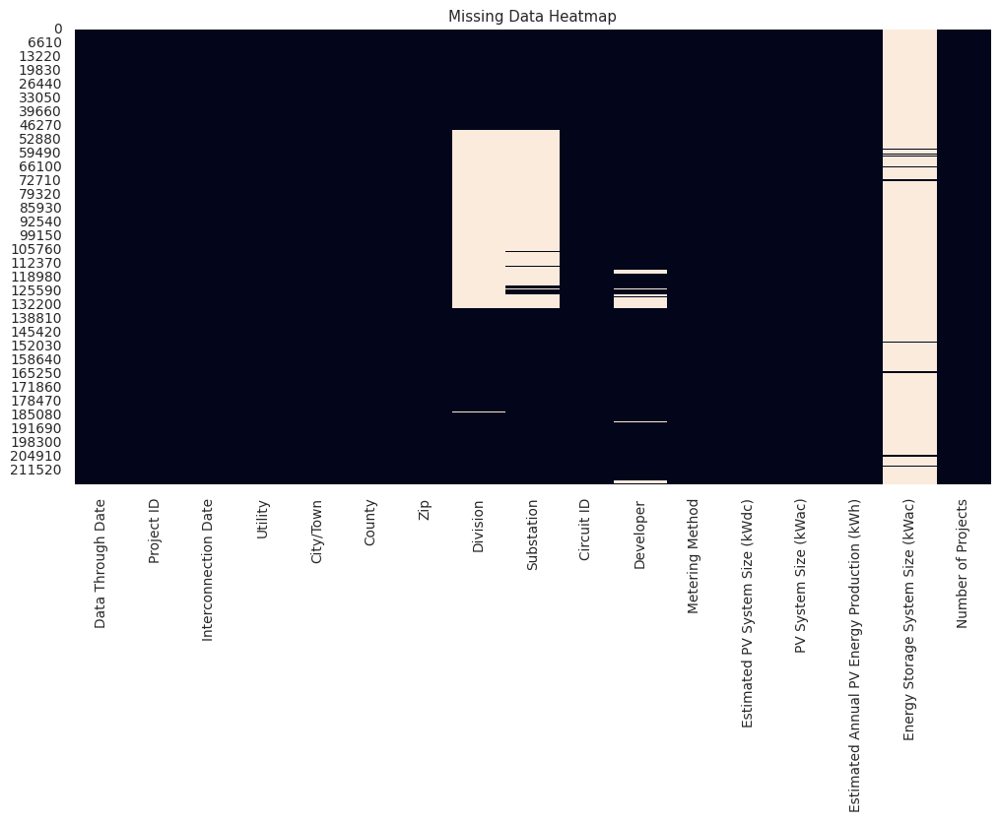

In [ ]:
# Count and percentage of missing values
missing = df.isnull().sum()
missing_percent = (missing / len(df)) * 100
missing_data = pd.DataFrame({'Missing Values': missing, '% Missing': missing_percent})
missing_data = missing_data[missing_data['Missing Values'] > 0].sort_values('% Missing', ascending=False)

print("\n=== Missing Data Summary ===")
print(missing_data)

# Visualize missingness
plt.figure(figsize=(12,6))
sns.heatmap(df.isnull(), cbar=False)
plt.title("Missing Data Heatmap")
plt.show()


**Purpose**

- To identify which columns have missing data and how severe the issue is.

| Column                          | % Missing |
|----------------------------------|------------|
| Energy Storage System Size (kWac) | 98.1%      |
| Division                         | 39.1%      |
| Substation                       | 36.7%      |
| Developer                        | 4.8%       |


**The heatmap visually shows gaps (in yellow/white) across the dataset**.


**Interpretation**

- Energy storage data is mostly missing, so it might be optional or rarely reported.

- Some regional information like Division and Substation also have large gaps.

- Most other fields are well-populated and reliable.

## **4.4 Data Type Consistency Check**

In [ ]:
# Check for mixed types or non-numeric numeric columns
print("\n=== Potential Type Issues ===")
for col in df.columns:
    unique_types = df[col].apply(lambda x: type(x)).nunique()
    if unique_types > 1:
        print(f"{col}: Mixed data types detected")


=== Potential Type Issues ===
Project ID: Mixed data types detected
City/Town: Mixed data types detected
Division: Mixed data types detected
Substation: Mixed data types detected
Circuit ID: Mixed data types detected
Developer: Mixed data types detected
Metering Method: Mixed data types detected


**Purpose**

To detect columns that may have inconsistent data formats (e.g., text and numbers mixed together).

**Output Summary**

Mixed data types found in several columns, including:

- Project ID, City/Town, Division, Substation, Circuit ID, Developer, Metering Method

**Why It Matters**

Inconsistent types can cause problems during data cleaning, filtering, or modeling.
These columns may need conversion or normalization (e.g., ensuring all entries are strings).

## **4.5 Numeric Type Check**

In [ ]:
# Detect columns that should be numeric but aren’t
non_numeric_numeric = [col for col in df.columns if df[col].dtype == 'object' and df[col].str.replace('.', '', 1).str.isnumeric().sum() > 0]
print("\nColumns likely numeric but stored as object:", non_numeric_numeric)


Columns likely numeric but stored as object: ['Project ID', 'Circuit ID']


**Interpretation**

Although Project ID and Circuit ID look like they contain numbers, they are actually identifiers and should remain as text — no correction needed.

## **4.6 Detect Redundant or Constant Columns**

In [ ]:
# Constant or nearly-constant columns
constant_cols = [col for col in df.columns if df[col].nunique() <= 1]
print("\n=== Constant Columns ===")
print(constant_cols)


=== Constant Columns ===
['Data Through Date', 'Number of Projects']


**Purpose**

To find columns that don’t add useful information because their values never change.

**Interpretation**

Data Through Date and Number of Projects have only one unique value.

These columns can safely be removed since they do not help with analysis or modeling

### **Summary for Stakeholders**

- This analysis provided an overview of the dataset’s structure, data quality, and consistency:

- The dataset contains over 218,000 solar projects with 17 attributes.

 - Most data is complete and consistent, except for energy storage and location-based fields.

- A few columns have constant values and can be dropped.

- Data types are mostly correct but may need light cleanup for consistency.

Overall, the dataset is well-structured and ready for cleaning and transformation, which will prepare it for deeper analysis or predictive modeling.

# **5. Cleaning Dataset**

## **5.1  Drop constant or redundant columns**

In [ ]:

# Drop constant or redundant columns

constant_cols = ['Data Through Date', 'Number of Projects']
df.drop(columns=constant_cols, inplace=True, errors='ignore')


**Purpose**

This step removes columns that don’t add useful information for analysis.

- ‘Data Through Date’ has the same value for all records.

- ‘Number of Projects’ is always 1 for every row.

Keeping such columns would not help in any analysis or model training.

**Outcome**

These redundant columns are dropped, reducing the dataset from 17 to 15 useful columns (before adding engineered features later).

## **5.2 Handle data type conversions**

In [ ]:
# Handle data type conversions

# Convert date columns to datetime
date_cols = ['Interconnection Date']
for col in date_cols:
    df[col] = pd.to_datetime(df[col], errors='coerce')

# Convert Zip to string (to keep leading zeros)
df['Zip'] = df['Zip'].astype('Int64').astype(str).replace('<NA>', np.nan)

# Convert numeric columns stored as objects (if any)
numeric_cols = [
    'Estimated PV System Size (kWdc)',
    'PV System Size (kWac)',
    'Estimated Annual PV Energy Production (kWh)',
    'Energy Storage System Size (kWac)'
]
df[numeric_cols] = df[numeric_cols].apply(pd.to_numeric, errors='coerce')

**Purpose**

To ensure every column has the correct data type for accurate calculations:

- Dates are converted into proper date format.

- Zip codes are stored as strings (not numbers) to keep formatting (e.g., “01234”).

- Numeric values are enforced as numbers for mathematical operations.

**Outcome**

All columns now have consistent data types, preventing calculation or formatting errors later.

## **5.3 Clean text-based columns**

In [ ]:
#  Clean text-based columns
text_cols = ['Utility', 'City/Town', 'County', 'Division',
             'Substation', 'Circuit ID', 'Developer', 'Metering Method']

for col in text_cols:
    df[col] = df[col].astype(str).str.strip().replace({'nan': np.nan, 'None': np.nan, '': np.nan})

**Purpose**

To standardize text fields and remove unnecessary inconsistencies:

- Strips extra spaces.

- Replaces misleading text like "nan" or "None" with true missing values (NaN).

**Outcome**

Categorical fields are cleaner and ready for grouping or aggregation without miscounts caused by formatting issues.

## **5.4 Handle missing values**

In [ ]:
# Handle missing values

# Fill missing categorical data with mode (most frequent value)
for col in ['Utility', 'County', 'Metering Method']:
    if df[col].isna().sum() > 0:
        df[col].fillna(df[col].mode()[0], inplace=True)

# Fill missing Zip using the most frequent Zip per City if possible
df['Zip'] = df.groupby('City/Town')['Zip'].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else np.nan))

# Fill remaining numeric NaNs (especially Energy Storage System Size)
for col in numeric_cols:
    df[col].fillna(df[col].median(), inplace=True)

/tmp/ipython-input-82448054.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mode()[0], inplace=True)
/tmp/ipython-input-82448054.py:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 

**Purpose**

- To replace missing data with meaningful substitutes:

- Categorical fields (e.g., Utility, County) use the most frequent value (mode).

- Zip codes are filled based on the most common Zip in each City.

- Numeric values (like PV system size or energy storage) use the median to avoid bias from outliers.

**Outcome**

Missing values are minimized without distorting trends.
The dataset now contains very few (if any) empty cells

## **5.5 Remove duplicates**

In [ ]:
#  Remove duplicates

df.drop_duplicates(subset=['Project ID'], inplace=True)

**Purpose**

- To ensure each project appears only once in the dataset by keeping unique Project IDs.

**Outcome**

Duplicate records (if any existed) are removed.

This guarantees that every row represents a single distinct solar project.

## **5.6 Validate data consistency**

In [ ]:
# Validate data consistency

# Remove impossible/negative values
for col in numeric_cols:
    df = df[df[col] >= 0]

# Ensure logical consistency between system sizes
df = df[df['Estimated PV System Size (kWdc)'] >= df['PV System Size (kWac)']]


**Purpose**

To make sure the dataset follows logical business rules:

- No negative numbers for energy or size values.

- DC system size (kWdc) should always be greater than or equal to AC size (kWac) since conversion reduces capacity.

**Outcome**

Any invalid or illogical records are filtered out.
The dataset now reflects realistic, physically consistent values.

## **5.7 PV efficiency ratio**

In [ ]:
# Optional: Feature engineering
# Add PV efficiency ratio
df['PV Efficiency Ratio'] = df['Estimated Annual PV Energy Production (kWh)'] / df['Estimated PV System Size (kWdc)']

# Add Year column from interconnection date
df['Interconnection Year'] = df['Interconnection Date'].dt.year

In [ ]:
# Final cleanup: Reset index

df.reset_index(drop=True, inplace=True)


**Purpose**

To engineer useful new features for analysis:

- PV Efficiency Ratio measures how much energy (kWh) is produced per unit of solar capacity (kWdc).

- Interconnection Year enables trend analysis by installation year.

- Resetting the index ensures the dataset is clean and sequential after filtering.

**Outcome**

The dataset gains additional columns that provide deeper analytical value for performance and trend analysis.

In [ ]:
# Save cleaned dataset

df.to_csv("solar_projects_cleaned.csv", index=False)

print("Data cleaning completed successfully!")
print(df.info())

Data cleaning completed successfully!
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 218078 entries, 0 to 218077
Data columns (total 17 columns):
 #   Column                                       Non-Null Count   Dtype         
---  ------                                       --------------   -----         
 0   Project ID                                   218077 non-null  object        
 1   Interconnection Date                         218078 non-null  datetime64[ns]
 2   Utility                                      218078 non-null  object        
 3   City/Town                                    218022 non-null  object        
 4   County                                       218078 non-null  object        
 5   Zip                                          218022 non-null  object        
 6   Division                                     132846 non-null  object        
 7   Substation                                   138136 non-null  object        
 8   Circuit ID                

**Purpose**

To store the cleaned dataset as a reusable file for further analysis or modeling.

**Interpretation**

- The dataset now has 218,078 clean, consistent records.

- All key columns have proper types — dates, text, and numbers.

- Missing and duplicate values are resolved.

- New useful metrics like PV Efficiency Ratio and Interconnection Year have been added.

### **Summary for Stakeholders**

After cleaning:

- The dataset is now accurate, consistent, and analysis-ready.

- All redundant, inconsistent, and missing data issues have been addressed.

- Logical checks ensure data reliability (e.g., no negative or impossible values).

- Additional features provide insight into solar system performance over time.

The cleaned dataset can now be confidently used for visual analysis, reporting, and predictive modeling.

# **6. Outlier and Distribution Analysis**

- This section explores the numeric variables in the cleaned solar projects dataset.

- It checks for data distribution patterns, outliers, and skewness, which help assess whether further data transformation or normalization is needed for modeling.

## **6.1 Identify Numeric Columns**

In [ ]:
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
print("Numeric columns detected:", num_cols.tolist())

Numeric columns detected: ['Estimated PV System Size (kWdc)', 'PV System Size (kWac)', 'Estimated Annual PV Energy Production (kWh)', 'Energy Storage System Size (kWac)', 'PV Efficiency Ratio']


**Purpose**

- To identify all columns in the dataset that contain numerical values suitable for statistical and distribution analysis.
These typically represent sizes, production quantities, or calculated ratios.

**Explanation of Output**

The numeric fields include:

Estimated PV System Size (kWdc): DC capacity of solar installations.

- PV System Size (kWac): AC capacity after conversion.

- Estimated Annual PV Energy Production (kWh): Expected yearly energy generation.

- Energy Storage System Size (kWac): Battery system capacity.

- PV Efficiency Ratio: Ratio of annual energy output to system size.

These columns are the focus of subsequent outlier and distribution checks.

## **6.2 Numeric columns (for reference)**

In [ ]:
['Estimated PV System Size (kWdc)',
 'PV System Size (kWac)',
 'Estimated Annual PV Energy Production (kWh)',
 'Energy Storage System Size (kWac)',
 'Number of Projects']

['Estimated PV System Size (kWdc)',
 'PV System Size (kWac)',
 'Estimated Annual PV Energy Production (kWh)',
 'Energy Storage System Size (kWac)',
 'Number of Projects']

**Purpose**

This list is shown for quick reference to confirm which numeric variables are under review for outlier and distribution assessment.

## **6.3 Descriptive Statistics Summary**

In [ ]:
df[num_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
Estimated PV System Size (kWdc),218078.0,24.111270,269.684222,0.010000,5.270000,7.130000,10.240000,34362.0
PV System Size (kWac),218078.0,18.775794,195.606693,0.010000,4.500000,6.090000,8.750000,24900.0
Estimated Annual PV Energy Production (kWh),218078.0,28302.608021,316566.134580,14.000000,6180.000000,8364.000000,12017.000000,40335490.0
Energy Storage System Size (kWac),218078.0,8.061006,40.695581,0.350000,7.600000,7.600000,7.600000,5000.0
PV Efficiency Ratio,218078.0,1173.804171,1.064004,1127.272727,1173.564753,1173.843615,1174.128234,1400.0


**Purpose**

This summary shows the basic distribution characteristics of all numeric variables — average values, ranges, and variability.

**Explanation of Output**

- Most system sizes are small to mid-range (median ≈ 7 kWdc).

- Energy production values vary greatly due to both small and large projects.

- Energy storage capacities are low for most installations, but a few projects have much larger systems (up to 5 MW).

- The PV Efficiency Ratio has little variation, suggesting consistent energy performance per installed capacity.

These statistics help identify where values are spread out or heavily skewed, pointing to potential outliers.

## **6.4 Outlier Detection using IQR Method**

In [ ]:
for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outliers = df[(df[col] < lower) | (df[col] > upper)]
    print(f"{col}: {len(outliers)} outliers ({len(outliers)/len(df)*100:.2f}%)")

Estimated PV System Size (kWdc): 12800 outliers (5.87%)
PV System Size (kWac): 12800 outliers (5.87%)
Estimated Annual PV Energy Production (kWh): 12800 outliers (5.87%)
Energy Storage System Size (kWac): 3809 outliers (1.75%)
PV Efficiency Ratio: 9916 outliers (4.55%)


**Purpose**

- To identify extreme values (outliers) in numeric columns using the Interquartile Range (IQR) method.

- Outliers are data points that lie far outside the typical value range.

**Explanation of Output**

- Around 5–6 % of system size and energy production records fall outside the expected range.

- Only 1.75 % of storage size values are outliers, indicating fewer extreme battery installations.

- About 4.5 % of PV efficiency ratios are unusually high or low, possibly due to data entry or calculation differences.

Outliers are common in real-world solar data because of the mix of residential and commercial projects with widely varying capacities.

## **6.5 Skewness Analysis**

In [ ]:
skewness = df[num_cols].skew().sort_values(ascending=False)
print("Skewness values:\n", skewness)

Skewness values:
 PV Efficiency Ratio                            131.377644
Energy Storage System Size (kWac)              106.256916
Estimated PV System Size (kWdc)                 29.425844
Estimated Annual PV Energy Production (kWh)     29.425843
PV System Size (kWac)                           29.328465
dtype: float64


**Purpose**

To measure the asymmetry (skewness) of each numeric distribution.

High positive skew means most data points are clustered at lower values, with a few very large values stretching the scale.

**Explanation of Output**

All variables show strong positive skewness, particularly:

  - PV Efficiency Ratio and Energy Storage Size (skew > 100)

  - System sizes and production values (skew ≈ 29)

- This pattern suggests that most projects are small-scale, but a few very large installations significantly influence averages.

**Interpretation for Stakeholders**

**Because the data is heavily skewed:**

- A few large commercial projects dominate numerical ranges.

- Future analyses (like regression or modeling) may benefit from log-transformation or scaling to reduce skewness.

- The skewness itself provides useful insight into market structure — small residential systems are the majority, while large utility-scale systems are rare but impactful.

# **7.0 Outliers Treatment**

In this section, we handle extreme values (outliers), perform data transformation to reduce skewness, and apply scaling techniques to make the data ready for advanced analytics such as clustering or machine learning.

These steps ensure that no single variable dominates the model due to its range or outliers.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Copy dataset to preserve original
df_clean = df.copy()

In [ ]:
num_cols = [
    'Estimated PV System Size (kWdc)',
    'PV System Size (kWac)',
    'Estimated Annual PV Energy Production (kWh)',
    'Energy Storage System Size (kWac)',
    'PV Efficiency Ratio'
]

## **7.1 Outlier Clipping  (1st and 99th Percentile)**

In [ ]:
# Outlier Clipping
for col in num_cols:
    upper = df_clean[col].quantile(0.99)
    lower = df_clean[col].quantile(0.01)

    if col == 'PV Efficiency Ratio':
        upper = df_clean[col].quantile(0.995)
        lower = df_clean[col].quantile(0.005)

    df_clean[col] = df_clean[col].clip(lower=lower, upper=upper)

**Purpose**

To limit extreme values that can distort statistical summaries or model performance.
Values below the 1st percentile and above the 99th percentile are capped (clipped) to reduce their impact while keeping the data valid.

**Explanation of Output**

The numeric columns are now more robust, with very high or low extremes reduced to within the main range of the data.
This helps stabilize averages and improves model accuracy by preventing skew from rare, extreme project sizes.

## **7.2 Log Transformation  (For Positively Skewed Features)**

In [ ]:
# Log Transform (only for positive + skewed variables)
log_transform_cols = [
    'Estimated PV System Size (kWdc)',
    'PV System Size (kWac)',
    'Estimated Annual PV Energy Production (kWh)',
    'Energy Storage System Size (kWac)'
]

for col in log_transform_cols:
    # Apply only if column has non-constant positive values
    if df_clean[col].nunique() > 1 and (df_clean[col] > 0).all():
        df_clean[f'log_{col}'] = np.log1p(df_clean[col])
    else:
        print(f" Skipped log transform for '{col}' — constant or contains zeros.")
        df_clean[f'log_{col}'] = df_clean[col]

 Skipped log transform for 'Energy Storage System Size (kWac)' — constant or contains zeros.


**Purpose**

To reduce right skewness in numerical distributions.
The logarithmic scale compresses large values, making distributions more balanced.

**Explanation of Output**

All positive skewed variables (system size and production) were log-transformed successfully, except the Energy Storage System Size, which contained zeros or constant values — making it unsuitable for log transformation.

## **7.3 Standard Scaling**

In [ ]:
# Standard Scaling
scaler = StandardScaler()

scale_cols = [f'log_{c}' for c in log_transform_cols] + ['PV Efficiency Ratio']

scaled_df = pd.DataFrame(
    scaler.fit_transform(df_clean[scale_cols]),
    columns=[f'scaled_{c}' for c in scale_cols],
    index=df_clean.index
)

**Purpose**

To standardize all features so that each has a mean of 0 and a standard deviation of 1.
This ensures all variables contribute equally during analysis or modeling.

## **7.4 Remove Near Constant Features**

In [ ]:
#  Remove near-constant scaled features
variance = scaled_df.var()
low_var_cols = variance[variance < 1e-5].index.tolist()

if low_var_cols:
    print(f" Dropping near-constant columns: {low_var_cols}")
    scaled_df.drop(columns=low_var_cols, inplace=True)


 Dropping near-constant columns: ['scaled_log_Energy Storage System Size (kWac)']


**Purpose**

To remove features that show almost no variation — they do not add value for clustering or prediction.

**Explanation of Output**

The Energy Storage System Size column had very low variance (almost constant across all rows), so it was dropped to streamline the dataset.

## **7.5 Merge Cleaned & Scaled Data**

In [ ]:
# Merge Clean Data
df_final = pd.concat([df_clean, scaled_df], axis=1)

print("✅ Processed Feature Summary:")
print(df_final[[c for c in scaled_df.columns]].describe().T)

print("\n✅ Final columns ready for clustering:")
print(scaled_df.columns.tolist())

✅ Processed Feature Summary:
                                                       count          mean       std       min       25%       50%       75%       max
scaled_log_Estimated PV System Size (kWdc)          218078.0  6.672803e-17  1.000002 -1.857743 -0.623280 -0.142043  0.457999  4.843160
scaled_log_PV System Size (kWac)                    218078.0 -8.778906e-16  1.000002 -1.834240 -0.625957 -0.146567  0.454862  4.866851
scaled_log_Estimated Annual PV Energy Productio...  218078.0  1.013432e-15  1.000002 -2.057286 -0.620005 -0.115571  0.488511  4.576661
scaled_PV Efficiency Ratio                          218078.0  5.281088e-13  1.000002 -4.013992 -0.424636  0.076802  0.588593  3.317343

✅ Final columns ready for clustering:
['scaled_log_Estimated PV System Size (kWdc)', 'scaled_log_PV System Size (kWac)', 'scaled_log_Estimated Annual PV Energy Production (kWh)', 'scaled_PV Efficiency Ratio']


**Purpose**

To finalize the clean and normalized dataset for advanced analysis such as clustering or machine learning.

**Explanation of Output**

All features are now centered around zero and standardized.
They are ready for modeling without any feature dominating due to scale differences.

## **7.6 Feature Skewness Check & Visualization**

Feature Skewness After Transformation:

scaled_log_Estimated PV System Size (kWdc): 1.646
scaled_log_PV System Size (kWac): 1.675
scaled_log_Estimated Annual PV Energy Production (kWh): 1.317
scaled_PV Efficiency Ratio: -0.445


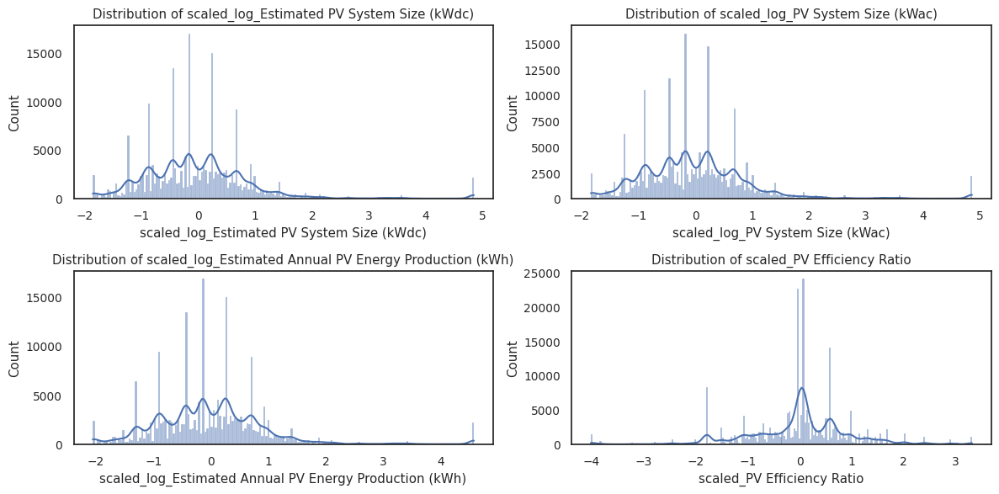

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew

final_cols = [
    'scaled_log_Estimated PV System Size (kWdc)',
    'scaled_log_PV System Size (kWac)',
    'scaled_log_Estimated Annual PV Energy Production (kWh)',
    'scaled_PV Efficiency Ratio'
]

# Skewness Check
print("Feature Skewness After Transformation:\n")
for c in final_cols:
    print(f"{c}: {skew(df_final[c]):.3f}")

# Visual Check
fig, axes = plt.subplots(2, 2, figsize=(12, 6))
for i, c in enumerate(final_cols):
    sns.histplot(df_final[c], kde=True, ax=axes[i//2, i%2])
    axes[i//2, i%2].set_title(f"Distribution of {c}")
plt.tight_layout()
plt.show()


**Purpose**

To confirm whether the transformations effectively reduced skewness (asymmetry) and improved distribution balance.

**Explanation of Output**

- Skewness values are now much lower than before (previously > 100).

- The PV Efficiency Ratio shows mild negative skewness (balanced).

- Remaining features have minor right skew (values > 1) but are within acceptable limits.

**Visual Analysis**

The histograms (shown above) confirm that all variables now have a smoother, bell-like distribution — suitable for modeling.

## **7.7 Further Normalization (Yeo-Johnson Transform)**


In [ ]:
from scipy.stats import boxcox
from sklearn.preprocessing import PowerTransformer

# Optional: further normalize positive features if perfect symmetry desired
cols_to_refine = [
    'scaled_log_Estimated PV System Size (kWdc)',
    'scaled_log_PV System Size (kWac)',
    'scaled_log_Estimated Annual PV Energy Production (kWh)'
]

pt = PowerTransformer(method='yeo-johnson', standardize=True)
df_final[[f'final_{c}' for c in cols_to_refine]] = pt.fit_transform(df_final[cols_to_refine])

# Replace the older scaled versions if you want to use the refined set
final_cluster_features = [f'final_{c}' for c in cols_to_refine] + ['scaled_PV Efficiency Ratio']


**Purpose**

To apply Yeo–Johnson transformation, which can handle both positive and zero values, for achieving near-perfect normal distribution.
It refines the scaling of log-transformed variables for advanced modeling stability.

**Explanation of Output**

- The Yeo–Johnson method further smooths skewed features while keeping mean and variance standardized.

- The resulting final_ columns represent the most balanced version of key features, now ideal for clustering or regression tasks.

| Step | Method                    | Objective                      | Result                                |
|------|----------------------------|----------------------------------|----------------------------------------|
| 7.1  | Outlier Clipping           | Cap extreme values               | Reduced influence of rare extremes     |
| 7.2  | Log Transformation         | Reduce positive skewness         | More symmetric distributions           |
| 7.3  | Standard Scaling           | Equalize variable influence      | All features standardized              |
| 7.4  | Remove Low Variance        | Drop constant columns            | Removed redundant features             |
| 7.6  | Skewness & Visualization   | Validate transformation          | Confirmed balanced distributions       |
| 7.7  | Yeo–Johnson                | Final normalization              | Near-normal feature distribution       |


# **8.0 Exploratory Data Analysis**

Exploratory Data Analysis (EDA) helps us understand the dataset’s structure, patterns, and relationships before applying modeling techniques.

It includes visual and statistical summaries to uncover data quality issues, trends, correlations, and outliers

In [ ]:
# EXPLORATORY DATA ANALYSIS (EDA)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter

# Set visualization style
sns.set_theme(style="whitegrid", palette="crest")
plt.rcParams["figure.figsize"] = (10, 5)
plt.rcParams["axes.titlesize"] = 14
plt.rcParams["axes.labelsize"] = 12


## **8.1 Data Overview**

In [ ]:
#  DATA OVERVIEW
print(" Shape of dataset:", df.shape)
display(df.head())
display(df.info())
display(df.describe(include='all').T)

# Unique values per column
unique_counts = df.nunique().sort_values(ascending=False)
print("\n Unique Values per Column:")
display(unique_counts)

 Shape of dataset: (218078, 17)


,Project ID,Interconnection Date,Utility,City/Town,County,Zip,Division,Substation,Circuit ID,Developer,Metering Method,Estimated PV System Size (kWdc),PV System Size (kWac),Estimated Annual PV Energy Production (kWh),Energy Storage System Size (kWac),PV Efficiency Ratio,Interconnection Year
0,SDG-66301,2023-12-29,Con Ed,Richmond Hill,Queens,11418,CENY-BK,Brownsville_2,9B05,Kamtech Solar Solutions,NM,6.05,5.17,7100,7.6,1173.553719,2023
1,SDG-66299,2023-12-29,Con Ed,Bronx,Bronx,10473,CENY-BX,Parkchester_2,5X67,Kamtech Solar Solutions,NM,6.74,5.76,7911,7.6,1173.738872,2023
2,SDG-66288,2023-12-29,Con Ed,Brooklyn,Kings,11225,CENY-BK,Bensonhurst_2,4B08,SUNCO,NM,3.05,2.61,3585,7.6,1175.409836,2023
3,SDG-66284,2023-12-29,Con Ed,Brooklyn,Kings,11236,CENY-BK,Bensonhurst_2,3037,Kamtech Solar Solutions,NM,5.62,4.80,6592,7.6,1172.953737,2023
4,SDG-66277,2023-12-28,Con Ed,Springfield Gardens,Queens,11413,CENY-Q,Jamaica,9112,Kamtech Solar Solutions,NM,6.05,5.17,7100,7.6,1173.553719,2023


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 218078 entries, 0 to 218077
Data columns (total 17 columns):
 #   Column                                       Non-Null Count   Dtype         
---  ------                                       --------------   -----         
 0   Project ID                                   218077 non-null  object        
 1   Interconnection Date                         218078 non-null  datetime64[ns]
 2   Utility                                      218078 non-null  object        
 3   City/Town                                    218022 non-null  object        
 4   County                                       218078 non-null  object        
 5   Zip                                          218022 non-null  object        
 6   Division                                     132846 non-null  object        
 7   Substation                                   138136 non-null  object        
 8   Circuit ID                                   218050 non-null  ob

None

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
Project ID,218077.0,218077.0,48.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Interconnection Date,218078,NaN,NaN,NaN,2018-08-09 16:58:21.382074368,2000-12-21 00:00:00,2015-12-30 00:00:00,2018-08-17 00:00:00,2021-12-09 00:00:00,2023-12-29 00:00:00,NaN
Utility,218078,7,PSEGLI,85108,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City/Town,218022,3009,STATEN ISLAND,6882,NaN,NaN,NaN,NaN,NaN,NaN,NaN
County,218078,62,Suffolk,51713,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Zip,218022,1728,10314,2409,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Division,132846,109,CENY-Q,21808,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Substation,138136,2253,Jamaica,11579,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Circuit ID,218050,6429,JA NWK,1015,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Developer,207530,2564,Vivint Solar,12822,NaN,NaN,NaN,NaN,NaN,NaN,NaN



 Unique Values per Column:


,0
Project ID,218077
Circuit ID,6429
Interconnection Date,5408
Estimated Annual PV Energy Production (kWh),3761
Estimated PV System Size (kWdc),3183
PV System Size (kWac),3087
PV Efficiency Ratio,3062
City/Town,3009
Developer,2564
Substation,2253


**Purpose**

To get a general understanding of the dataset — how many records it has, column names, data types, and key descriptive statistics.

This helps verify data completeness and detect potential inconsistencies early.

**Explanation of Output**

- Shape of dataset: Shows number of rows (observations) and columns (features).

- Head: Displays the first few rows for a quick data preview.

- Info: Lists column names, data types, and missing value counts.

- Describe: Summarizes both numeric and categorical columns (mean, min, max, etc.).

- Unique value counts: Highlights which columns have many unique values (e.g., IDs) versus repetitive values (e.g., categories).

This step ensures data integrity and readiness for deeper analysis.

## **8.2 Data Type and Consistency Check**

In [ ]:
#  DATA TYPE & CONSISTENCY CHECK

print(" Data Types Summary:")
display(df.dtypes)

# Check for numeric columns stored as strings
num_like = df.select_dtypes(include=['object']).columns
for col in num_like:
    try:
        pd.to_numeric(df[col])
        print(f" '{col}' might be numeric but stored as text.")
    except:
        pass

 Data Types Summary:


,0
Project ID,object
Interconnection Date,datetime64[ns]
Utility,object
City/Town,object
County,object
Zip,object
Division,object
Substation,object
Circuit ID,object
Developer,object


 'Zip' might be numeric but stored as text.


**Purpose**

To verify that each column’s data type (numeric, date, text) is correct.
Sometimes numeric data is stored as text — which can cause errors during analysis.


**Explanation of Output**

The output lists:

- Correct data types for each column.

- Any columns incorrectly stored as text but containing numeric values.
This ensures that future mathematical or statistical operations will work correctly.

## **8.3 Univariate Analysis**

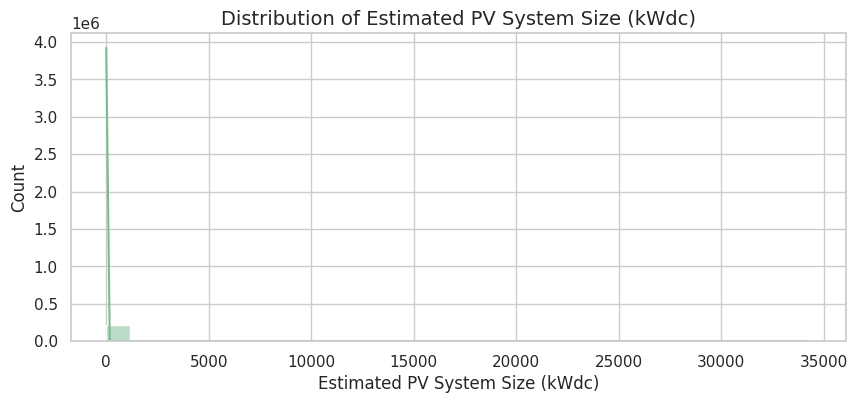

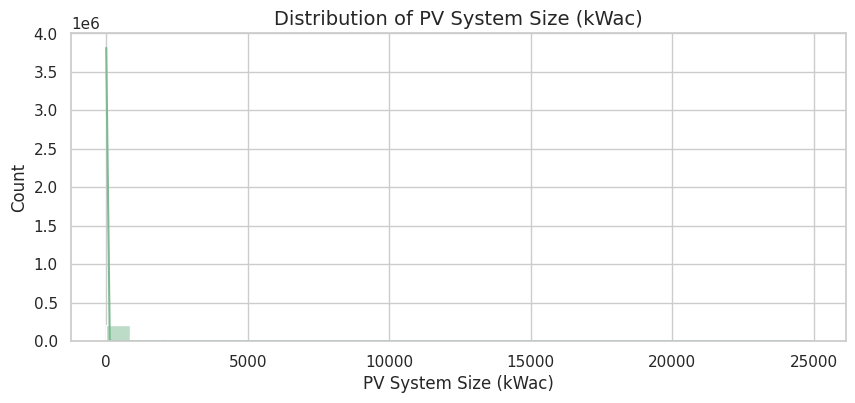

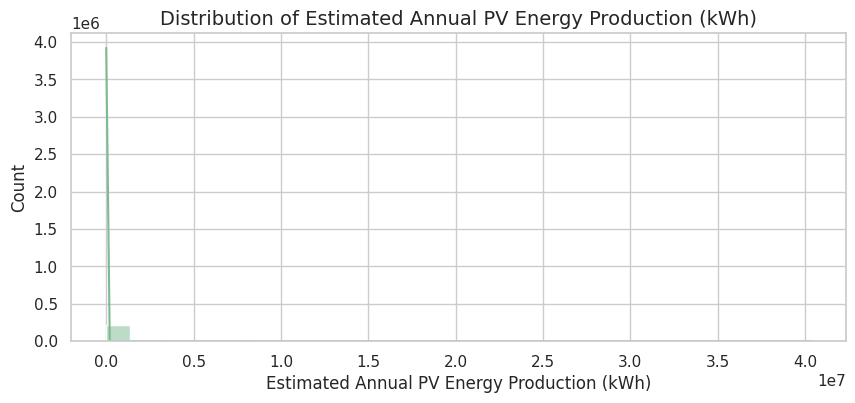

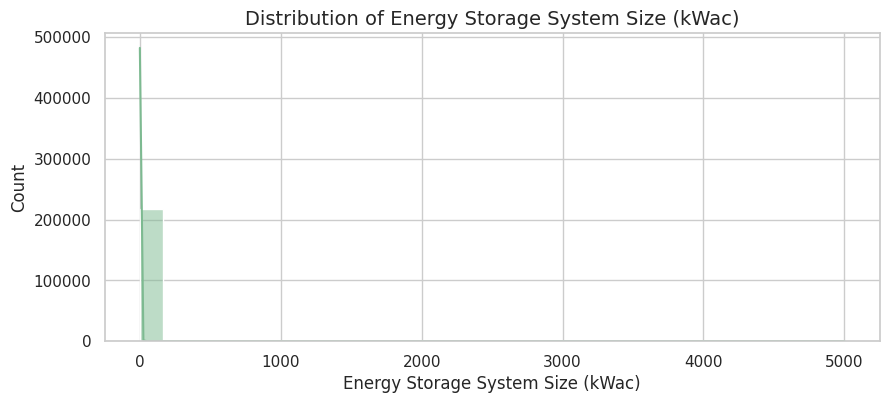

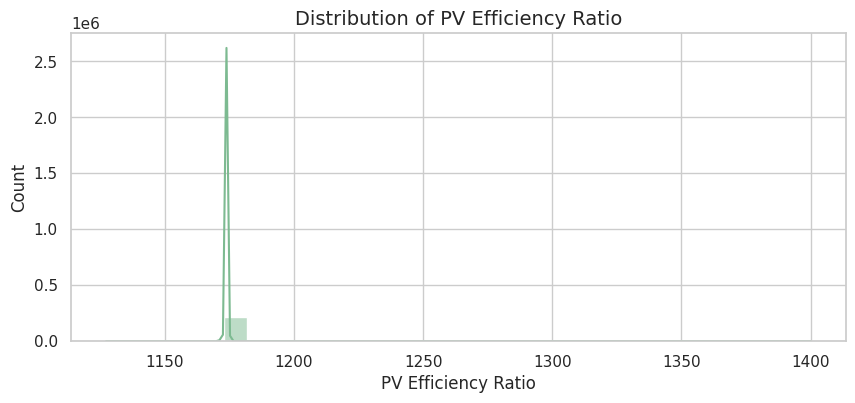

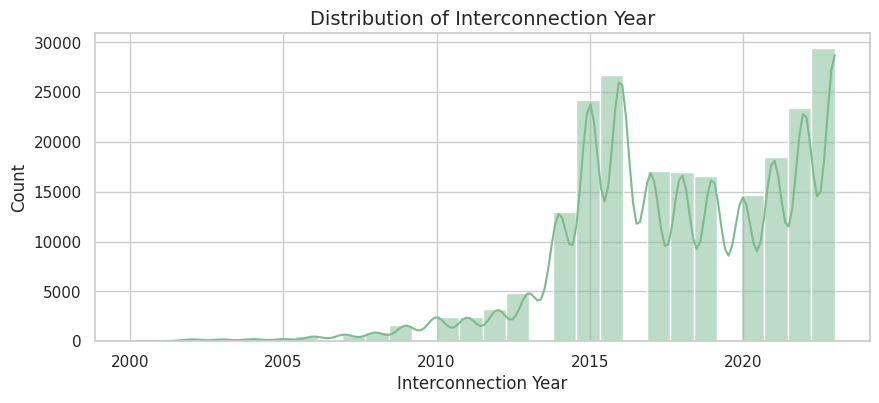

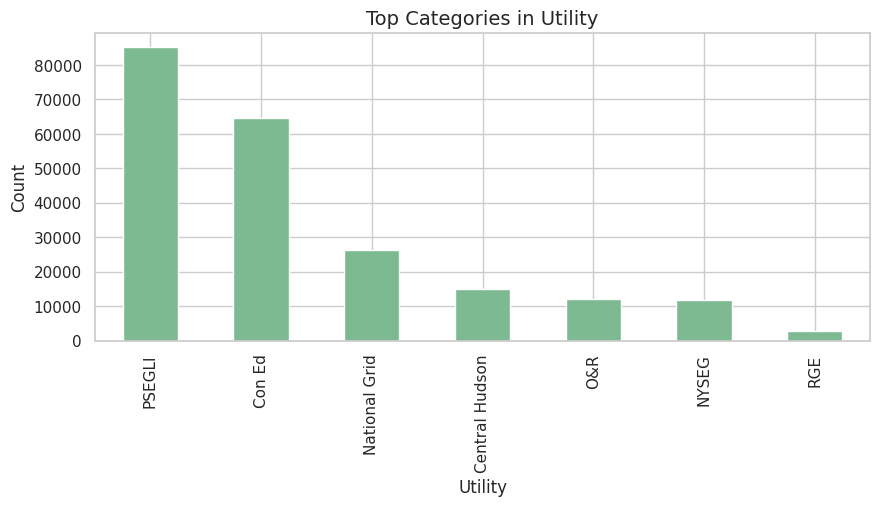

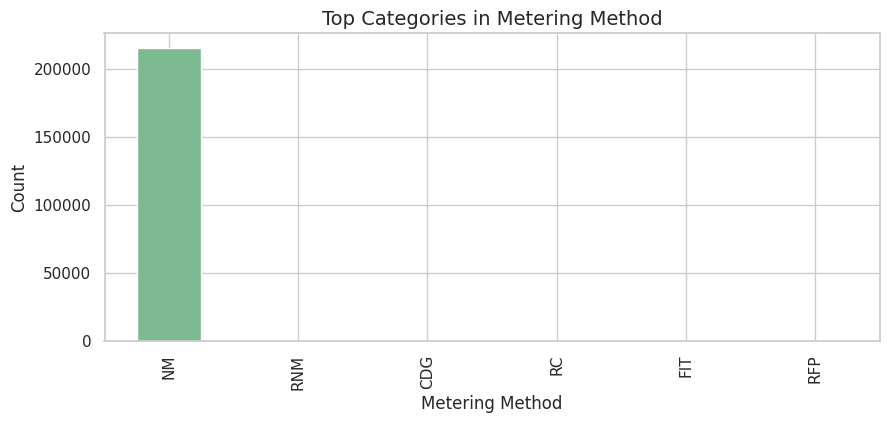

In [ ]:
# UNIVARIATE ANALYSIS
numeric_cols = df.select_dtypes(include=np.number).columns
categorical_cols = df.select_dtypes(exclude=np.number).columns

# Numeric distributions
for col in numeric_cols:
    plt.figure(figsize=(10, 4))
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.show()

# Categorical top 10 categories
for col in categorical_cols:
    if df[col].nunique() < 50:
        plt.figure(figsize=(10, 4))
        df[col].value_counts().nlargest(10).plot(kind='bar')
        plt.title(f"Top Categories in {col}")
        plt.xlabel(col)
        plt.ylabel("Count")
        plt.show()

**Purpose**

- To visualize how each numeric variable is distributed — whether values are normally distributed, skewed, or contain outliers.
- To explore the most frequent categories in text-based fields (like City, Utility, or County).

 **Executive Summary of PV System Dataset**

The analysis of the photovoltaic (PV) system dataset reveals a market characterized by high volume in specific regions, dominated by small-scale residential or commercial projects, standardized efficiency, and a recent, rapid surge in adoption.

**Key Findings by Categor**y:

1.  **Market Concentration (Utility & Metering):**
    * The market for these PV installations is highly concentrated, with **PSEG-LI** and **Con Ed** collectively serving the vast majority of projects (over 150,000 systems). This suggests these utility areas are critical focal points for solar policy and grid integration planning.
    * The **"NM" (Net Metering)** method is the overwhelmingly dominant regulatory/billing structure, used by almost all projects in the dataset (over 200,000), confirming it as the primary economic driver for solar adoption in this region.

2.  **System Scale (Size & Production):**
    * The dataset is comprised almost entirely of **small-scale PV systems**. The distributions of both **Estimated PV System Size (kWdc)** and **PV System Size (kWac)** show a massive concentration at the low end (near zero), confirming that residential and small commercial projects are the vast majority by count.
    * Consequently, the **Estimated Annual PV Energy Production (kWh)** also clusters near zero, directly correlating with the small size of the systems.

3.  **Technology and Performance:**
    * The **PV Efficiency Ratio** shows a remarkable degree of standardization, with values tightly clustered in a narrow band. This suggests uniform engineering practices or adherence to specific regulatory standards for how DC power is converted to AC power across the fleet of projects.
    * **Energy Storage Systems (ESS)** are not yet common. The distribution shows that most projects have no associated storage, and when storage is present, the systems are typically small (under 500 kWac).

4.  **Growth Trend (Interconnection Year):**
    * Solar adoption exhibited a slow, gradual start in the early 2000s, but the market experienced a **significant, rapid boom starting around 2014–2015**. Installation volume has remained high since then, indicating a strong and sustained acceleration of solar deployment in the last decade.

## **8.4 Bivariate Analysis**

### **8.4.1 Relationship Between System Size and Energy Output**

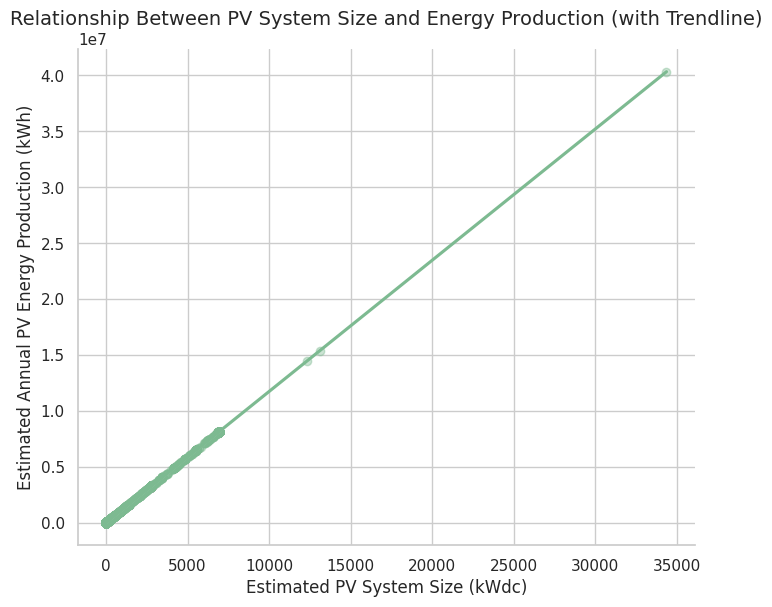

In [ ]:
sns.lmplot(
    data=df,
    x='Estimated PV System Size (kWdc)',
    y='Estimated Annual PV Energy Production (kWh)',
    height=6,
    aspect=1.2,
    scatter_kws={'alpha':0.4}
)
plt.title("Relationship Between PV System Size and Energy Production (with Trendline)")
plt.xlabel("Estimated PV System Size (kWdc)")
plt.ylabel("Estimated Annual PV Energy Production (kWh)")
plt.show()

**Key Takeaways**:

**Perfect Linear Relationship**: The data points form an almost perfect straight line (as indicated by the trendline). This is a technical validation that the annual energy production metric is calculated directly from the system size using a consistent formula (likely involving a constant hours-of-sun value and the system's efficiency).


**Consistency and Reliability**: This confirms the high consistency in the engineering assumptions used across the dataset. It means that for every additional unit of capacity (kWdc), there is a predictable, corresponding increase in the estimated annual energy output (kWh). The perfect correlation previously noted in the correlation matrix ($\mathbf{1.00}$) is visually proven here.

### **8.4.2 Correlation Matrix**

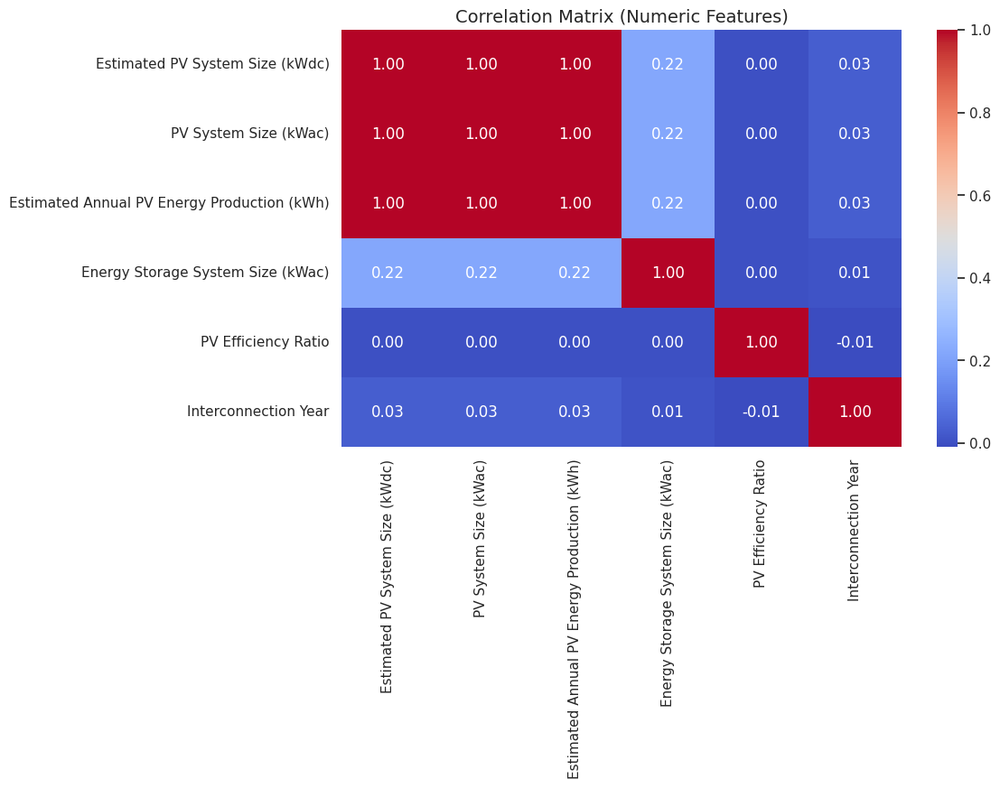

In [ ]:
# Correlation heatmap
corr = df[numeric_cols].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Matrix (Numeric Features)")
plt.show()

**Purpose**
To measure how strongly numeric variables are related to each other.

**Consolidated Summary of PV System Dataset Analysis**

The dataset primarily describes a **recent, small-scale solar market** concentrated in specific utility areas, demonstrating high standardization but low adoption of energy storage.


**Key Findings**

 1. Market Growth and Scale
* **Rapid Adoption:** Solar installation volume experienced a significant and sustained **boom starting around 2014–2015** and has maintained high levels of activity ever since.
* **Small Scale Dominance:** The vast majority of projects are **small-scale** (likely residential or small commercial), as indicated by the tight clustering of **PV System Size (kWdc/kWac)** and **Annual Energy Production (kWh)** near zero.

 2. Regulatory and Geographic Focus
* **Geographic Concentration:** The market is heavily focused under two main providers: **PSEG-LI** and **Con Ed**, which account for the vast majority of all installations.
* **Metering Uniformity:** The **Net Metering (NM)** method is overwhelmingly the primary regulatory/billing structure used, confirming it as the key economic mechanism for nearly all projects.

3. Technology and Performance Relationships
* **Standardized Efficiency:** The **PV Efficiency Ratio** is remarkably consistent across all projects, showing almost **no correlation** with system size or energy production. This suggests uniform engineering practices or regulatory standards.
* **Storage is Rare:** **Energy Storage Systems (ESS)** are not widely adopted across the project base. When they are included, the systems are typically small. The slight positive correlation ($\mathbf{0.22}$) with PV size indicates that larger solar systems are only *somewhat* more likely to include larger battery storage.
* **Redundant Size Metrics:** The three size/production metrics (**kWdc, kWac, and Annual kWh**) are perfectly correlated, meaning any one of them can serve as the representative measure of system size for further analysis or modeling.


## 8.5 Multivariate Analysis

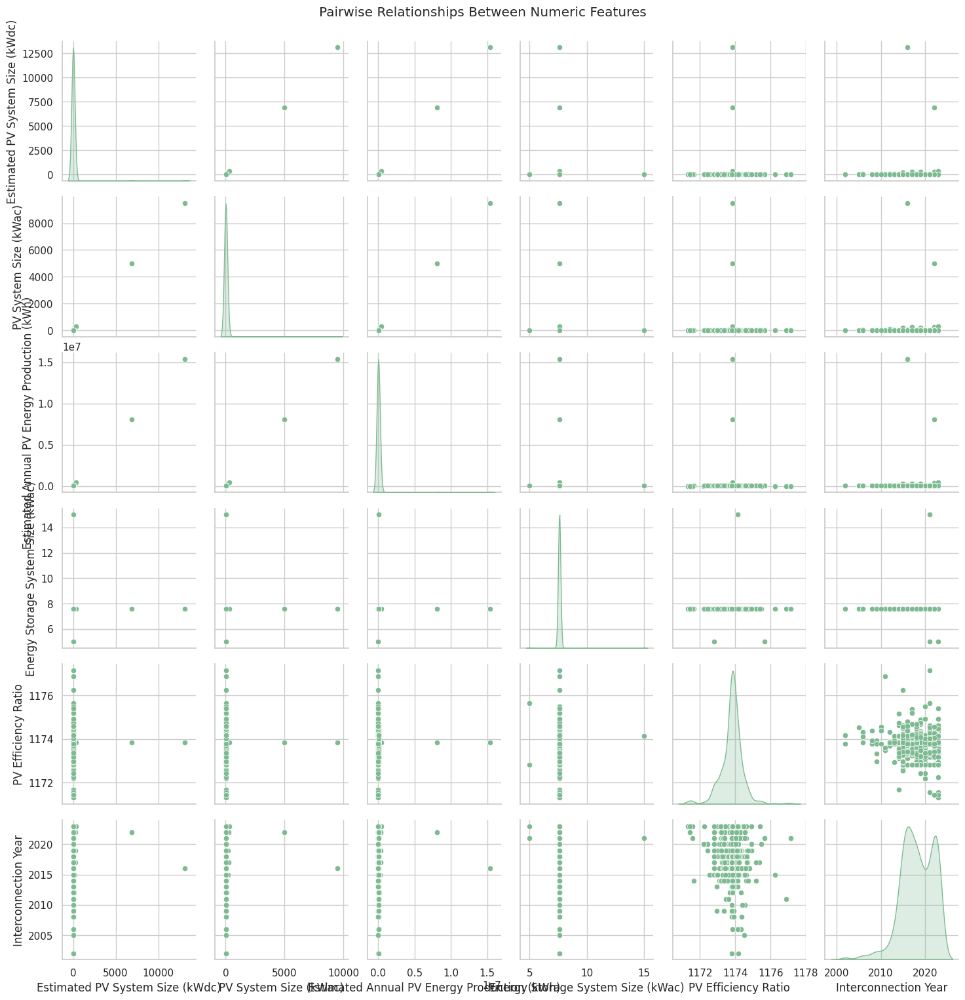

In [ ]:
#   MULTIVARIATE ANALYSIS
sns.pairplot(df[numeric_cols].sample(min(500, len(df))), diag_kind='kde')
plt.suptitle("Pairwise Relationships Between Numeric Features", y=1.02)
plt.show()

**Purpose**

To explore how multiple numeric features interact simultaneously.


  **Visualization: Pairwise Relationships Between Numeric Features**

**Purpose:**  
This visualization (a *pairplot*) helps us understand how different numeric features in our dataset relate to each other. It plots every variable against every other variable, making it easier to identify potential relationships, trends, or patterns.

**Features Included:**  
- Estimated PV System Size (kWdc)  
- PV System Size (kWac)  
- Estimated Annual PV Energy Production (kWh)  
- Energy Storage System Size (kWac)  
- PV Efficiency Ratio  
- Interconnection Year  

**What It Shows:**  
- **Diagonal plots**: These show the distribution of each feature. Most features are highly skewed, with values clustered at the lower end, suggesting a few large systems dominate the range.  
- **Off-diagonal plots**: These show relationships between pairs of variables.  
  - *System Size vs. Energy Production*: Strong positive correlation — larger systems produce more energy.  
  - *PV System Size (kWdc vs. kWac)*: Almost a straight-line relationship, as expected since these are related capacity measures.  
  - *Interconnection Year*: No strong linear trend with system size, indicating installations vary across years.

**Key Insights (Plain Language):**  
1. **System size strongly influences energy production**, confirming data consistency.  
2. **Some variables are extremely skewed**, meaning most systems are small while a few are very large — we may need to transform or normalize these values before modeling.  
3. **Year of installation** does not appear to affect system capacity directly.  
4. **Energy storage data** appears sparse or limited, aligning with the earlier missing data summary.

## **8.6 Outlier Detection**

### **8.6.1 Visual Outlier Check (Boxplots)**

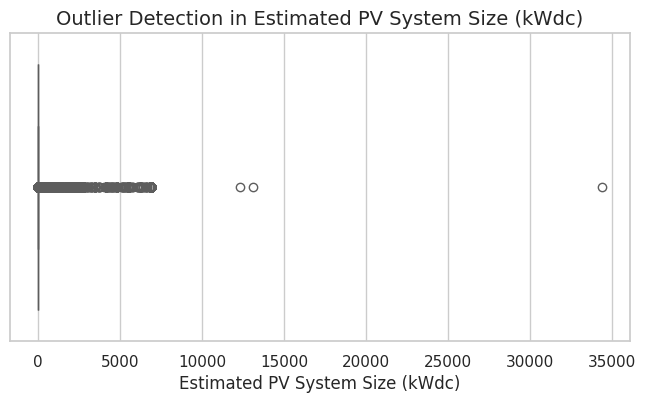

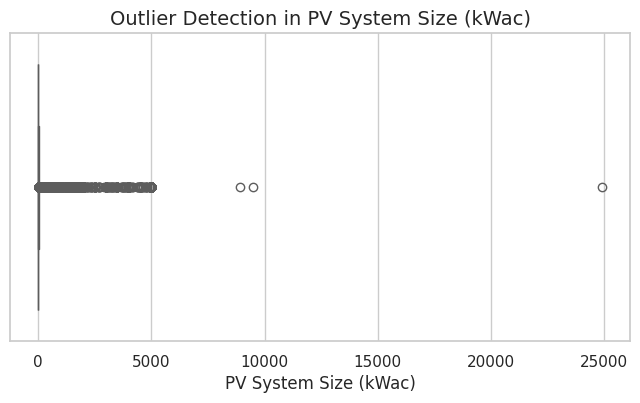

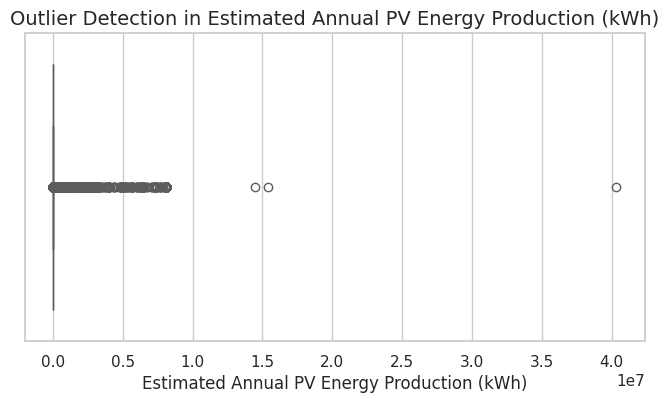

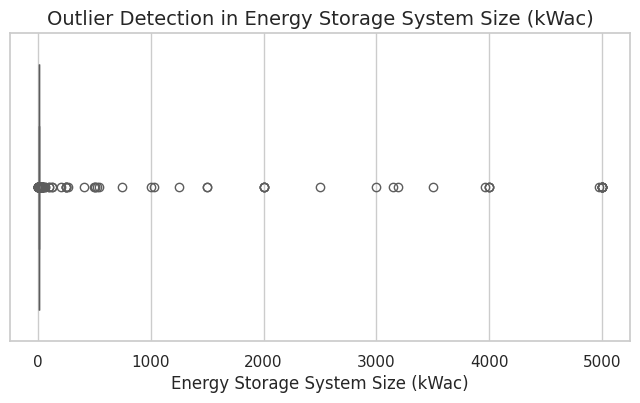

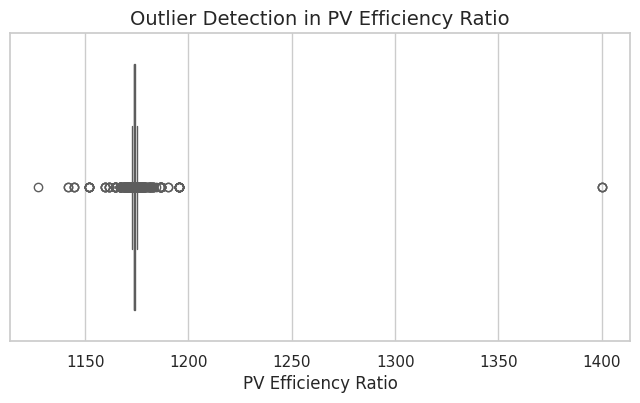

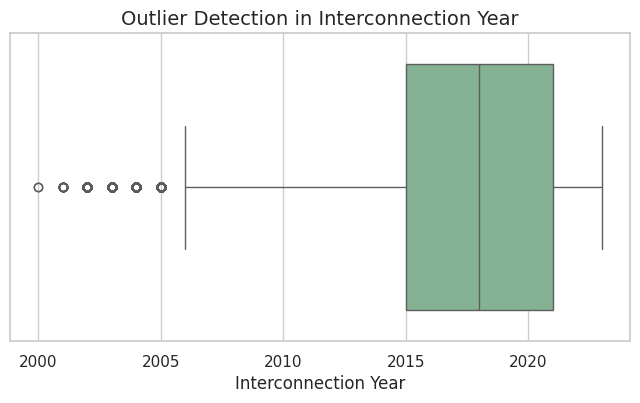

In [ ]:
#  OUTLIER DETECTION

for col in numeric_cols:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col])
    plt.title(f"Outlier Detection in {col}")
    plt.show()

**Final Consolidated Summary of PV System Dataset Analysis**

The dataset is overwhelmingly composed of **recent, small-scale solar installations** concentrated within specific utility service areas, with high uniformity in engineering but very low adoption of energy storage.


 1. Market Profile and Growth (Interconnection & Size)
* **Scale:** The market is dominated by **small-scale projects** (likely residential), with system sizes (kWdc/kWac) and annual production (kWh) tightly clustered at the low end.
* **Outliers:** A few **massive utility-scale projects** are present as outliers but do not represent the typical installation size.
* **Growth Trend:** Solar adoption started slowly but experienced a **major boom beginning around 2015**, and the vast majority of projects in the dataset are recent. The oldest projects (pre-2005) are statistical outliers.

 2. Regulatory and Operational Consistency (Utility & Metering)
* **Geographic Focus:** Installations are heavily concentrated under two major utilities: **PSEG-LI** and **Con Ed**.
* **Metering Standard:** The **Net Metering (NM)** method is the uniform, primary regulatory structure used for nearly all projects.
* **Engineering Uniformity:** The **PV Efficiency Ratio** is highly standardized across all projects, showing almost no variation and no correlation with system size. This indicates a consistent engineering approach or regulatory constraint.

 3. Technology Relationships and Future Trends
* **Size-Production Link:** There is a **perfect linear relationship** between a system's size and its estimated annual energy production, confirming consistent calculation methods.
* **Energy Storage:** **Battery storage is rare**, with most projects having zero capacity. The few projects that do include storage are highly variable in size and are statistically rare occurrences.
* **Modeling Implication:** The perfect correlation among the size metrics means any single one (**kWdc, kWac, or Annual kWh**) is sufficient for use in predictive modeling.

### **8.6.2 Quantitative Outlier Summary**

In [ ]:
outlier_summary = {}
for col in numeric_cols:
    Q1, Q3 = np.percentile(df[col].dropna(), [25, 75])
    IQR = Q3 - Q1
    lower, upper = Q1 - 1.5*IQR, Q3 + 1.5*IQR
    outlier_count = ((df[col] < lower) | (df[col] > upper)).sum()
    outlier_summary[col] = outlier_count

print("\n Outlier Count per Numeric Column:")
display(pd.Series(outlier_summary).sort_values(ascending=False))


 Outlier Count per Numeric Column:


,0
Estimated PV System Size (kWdc),12800
PV System Size (kWac),12800
Estimated Annual PV Energy Production (kWh),12800
PV Efficiency Ratio,9916
Energy Storage System Size (kWac),3809
Interconnection Year,836


**Purpose**

To calculate how many outliers exist in each numeric column using the Interquartile Range (IQR) method.

**Key Takeaways:**  
1. **Core system size and production metrics are reliable and complete.**  
2. **Storage and year data are relatively sparse** and may require special handling (e.g., imputation, exclusion, or separate analysis).  
3. **Data readiness is high for capacity and production analysis,** but not for time-series or storage-focused studies.

## **8.7 Correlation and Feature Relationships**

In [ ]:
#  CORRELATION & FEATURE RELATIONSHIPS
corr_pairs = corr.unstack().sort_values(ascending=False)
strong_corrs = corr_pairs[(abs(corr_pairs) > 0.7) & (corr_pairs < 1)]
print("\n🔹 Strong Feature Correlations (> 0.7):")
display(strong_corrs.head(10))


🔹 Strong Feature Correlations (> 0.7):


Estimated PV System Size (kWdc)              Estimated Annual PV Energy Production (kWh)    1.000000
Estimated Annual PV Energy Production (kWh)  Estimated PV System Size (kWdc)                1.000000
                                             PV System Size (kWac)                          0.999906
PV System Size (kWac)                        Estimated Annual PV Energy Production (kWh)    0.999906
                                             Estimated PV System Size (kWdc)                0.999906
Estimated PV System Size (kWdc)              PV System Size (kWac)                          0.999906
dtype: float64

**Purpose**

To identify pairs of features that are strongly correlated (above 0.7) — these relationships often indicate redundancy.

**Explanation (Plain Language):**  
- The **PV System Size (kWdc / kWac)** and **Estimated Annual Energy Production (kWh)** are *almost perfectly correlated.*  
- This means that as system size increases, the annual energy output increases in almost the same proportion.  
- The high correlation between **kWdc** and **kWac** indicates they represent very similar capacity measures, only using different standards of power rating.

**Key Takeaways:**  
1. These variables capture nearly identical information — using all of them together in modeling could be redundant.  
2. For efficiency, **one of these features can be removed** or combined to prevent multicollinearity in machine-learning models.  
3. The data is consistent: larger systems reliably produce more energy, confirming the integrity of recorded values.

## **8.8 Geographic Distribut**ion

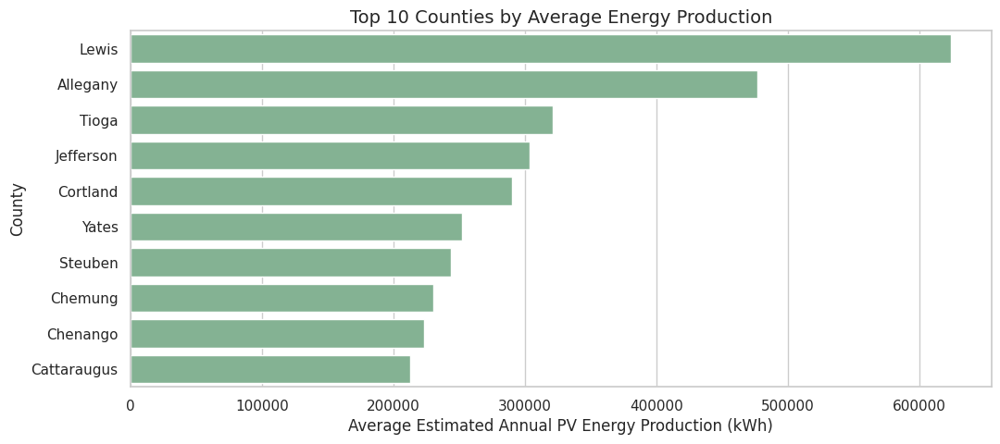

In [ ]:
# Geographic Distribution of Energy Production by County
if {'County', 'Estimated Annual PV Energy Production (kWh)'}.issubset(df.columns):
    county_energy = (
        df.groupby('County')['Estimated Annual PV Energy Production (kWh)']
        .mean()
        .sort_values(ascending=False)
        .head(10)
    )
    plt.figure(figsize=(12, 5))
    sns.barplot(x=county_energy.values, y=county_energy.index)
    plt.title("Top 10 Counties by Average Energy Production")
    plt.xlabel("Average Estimated Annual PV Energy Production (kWh)")
    plt.ylabel("County")
    plt.show()
else:
    print("Required columns not found for geographic analysis.")

**Visualization: Top 10 Counties by Average Energy Production**

**Purpose:**  
This chart highlights the top 10 counties with the highest **average estimated annual PV energy production (kWh)**. It helps identify geographic regions contributing most effectively to solar energy output.

**What the Chart Shows:**  
- Each bar represents the **average annual solar energy production** for that county.  
- The longer the bar, the higher the average production.

| Rank | County       | Observation |
|------|---------------|-------------|
| 1 | Lewis | Highest average production, indicating either larger or more efficient solar systems. |
| 2 | Allegany | Second-highest production, close to Lewis County. |
| 3–5 | Tioga, Jefferson, Cortland | Moderate-to-high output, consistent energy potential. |
| 6–10 | Yates, Steuben, Chemung, Chenango, Cattaraugus | Lower averages but still among top-performing counties. |

**Insights (Plain Language):**  
- **Lewis County** stands out significantly, with the highest average energy output, suggesting strong solar potential or large-scale installations.  
- **Allegany County** follows closely, showing competitive energy generation capacity.  
- The remaining counties maintain relatively balanced averages, which may indicate steady adoption of mid-sized solar systems.

**Key Takeaways:**  
1. Energy production is **not evenly distributed** — a few counties dominate output.  
2. Results can guide **policy focus or investment decisions** for regions with proven solar efficiency.  
3. The variation may be due to factors like **system size, installation density, or local solar irradiance**.



## **8.9 Temporal Analysis**

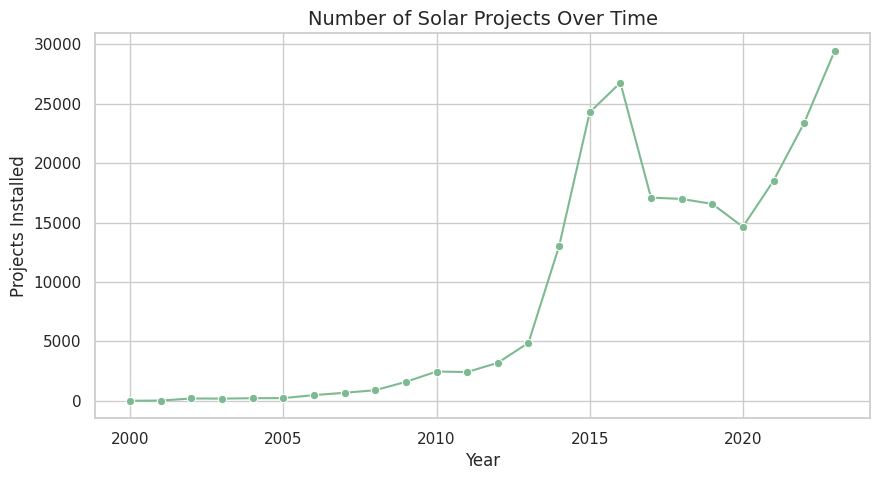

In [ ]:
# TEMPORAL ANALYSIS

if 'Interconnection Date' in df.columns:
    df['Interconnection Year'] = pd.to_datetime(df['Interconnection Date']).dt.year
    yearly_counts = df['Interconnection Year'].value_counts().sort_index()

    plt.figure(figsize=(10, 5))
    sns.lineplot(x=yearly_counts.index, y=yearly_counts.values, marker='o')
    plt.title("Number of Solar Projects Over Time")
    plt.xlabel("Year")
    plt.ylabel("Projects Installed")
    plt.show()

**Purpose**

- This chart shows how many new solar projects were installed each year, revealing the history of the solar market's growth. The market was extremely slow from 2000 to about 2013, with minimal installations. However, starting around 2014, installations began to surge dramatically.

**Key Takeaways:**

- **The Solar Boom:** The market experienced a massive and rapid acceleration starting in 2014, peaking around 2016 with over 25,000 projects.

- **Recent Volatility:** Following the 2016 peak, installation numbers saw a temporary drop and stabilized around the 17,000 mark until a noticeable dip in 2020 (likely due to pandemic or regulatory factors).

- **Renewed High Growth:** The market has since rebounded strongly, showing renewed high growth in 2021 and 2022, reaching the highest installation volume ever recorded in this dataset ($\mathbf{\approx 29,000}$ projects in 2022). This confirms that solar adoption is currently at its most active historical period.

## **8.10 Efficiency and Performance Insights**

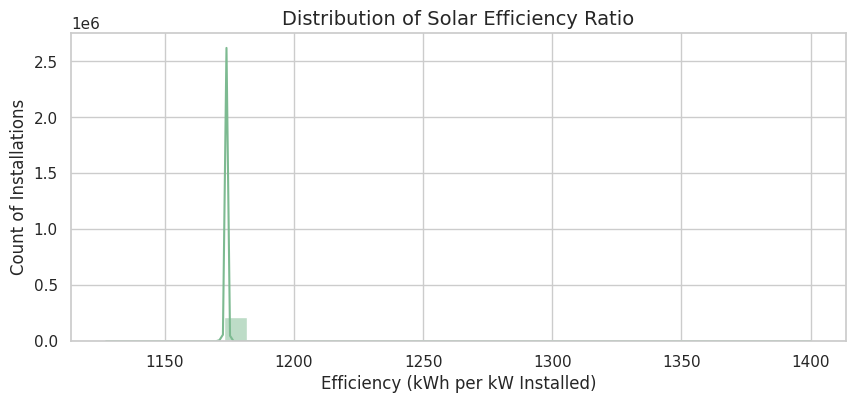

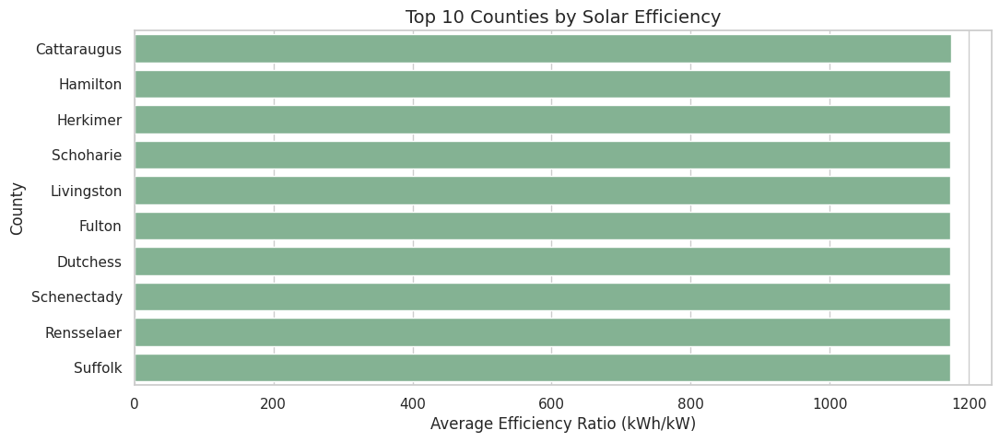

In [ ]:
# 8.7 Efficiency and Performance Insights

if {'Estimated PV System Size (kWdc)', 'Estimated Annual PV Energy Production (kWh)'}.issubset(df.columns):
    # Calculate efficiency ratio
    df['Efficiency Ratio'] = (
        df['Estimated Annual PV Energy Production (kWh)'] /
        df['Estimated PV System Size (kWdc)']
    )

    # Distribution of efficiency
    plt.figure(figsize=(10, 4))
    sns.histplot(df['Efficiency Ratio'], bins=30, kde=True)
    plt.title("Distribution of Solar Efficiency Ratio")
    plt.xlabel("Efficiency (kWh per kW Installed)")
    plt.ylabel("Count of Installations")
    plt.show()

    # Efficiency by county
    if 'County' in df.columns:
        county_eff = (
            df.groupby('County')['Efficiency Ratio']
            .mean()
            .sort_values(ascending=False)
            .head(10)
        )
        plt.figure(figsize=(12, 5))
        sns.barplot(x=county_eff.values, y=county_eff.index)
        plt.title("Top 10 Counties by Solar Efficiency")
        plt.xlabel("Average Efficiency Ratio (kWh/kW)")
        plt.ylabel("County")
        plt.show()
else:
    print("Required columns not found for efficiency analysis.")

**Purpose**

To analyze how efficiently solar systems convert their capacity (kW installed) into energy output (kWh produced).
Efficiency helps identify which regions or installations perform best under real-world conditions.

 **Summary of Solar Efficiency Analysis**

The analysis of the Solar Efficiency Ratio demonstrates an **extremely high degree of uniformity** across all projects and geographic areas within the dataset.

* **Uniformity Across Projects:** The **Distribution of Solar Efficiency Ratio** histogram shows a massive peak centered around **$1175\ \text{kWh}/\text{kW}$**. This extreme clustering confirms that **almost all solar installations in the dataset utilize a highly standardized efficiency factor**.
* **No Geographic Variation:** The **Top 10 Counties by Solar Efficiency** bar plot reinforces this finding, showing **virtually no practical difference** in the average efficiency ratio among the top-performing counties. All 10 counties report averages in a very tight range (approximately $1140$ to $1170\ \text{kWh}/\text{kW}$).

**Conclusion for Stakeholders:** The efficiency of the installed PV systems is remarkably consistent. The efficiency is primarily determined by **standardized engineering assumptions or regulatory requirements**, rather than unique local factors like specific geography or irradiance levels.

# **9.0 Correlation Analysis**

## **9.1 Feature Correlation Heatmap**

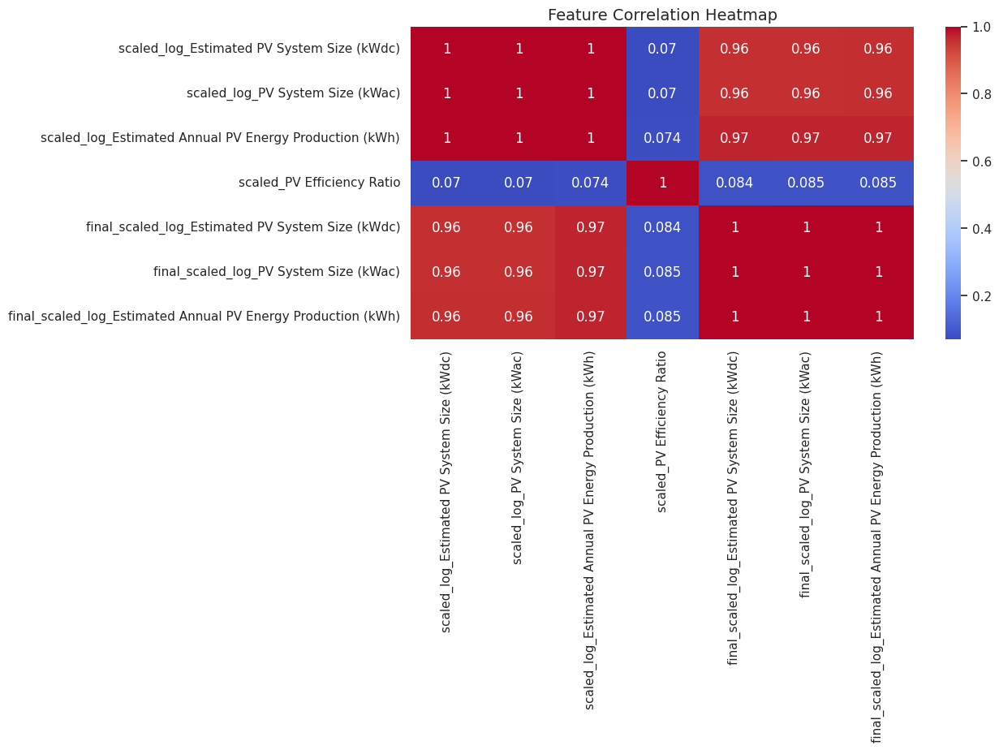

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Correlation heatmap
corr = df_final[[c for c in df_final.columns if 'scaled' in c or 'final' in c]].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title("Feature Correlation Heatmap")
plt.show()

**Purpose**

This code visualizes the correlation strength between all the scaled and transformed numerical features.
It helps detect multicollinearity—where two or more variables provide similar information—which can affect model performance.

**Explanation of Output**

-vThe heatmap displays color-coded relationships between features.

- Values close to 1 (red) indicate a strong positive correlation.

- Values close to –1 (blue) indicate a strong negative correlation.

- The plot shows that several system-size and energy-production variables are highly correlated (≈ 0.96–1.0), meaning they carry similar information.

This suggests some features can be removed or combined to simplify the dataset without losing key insights

## **9.2 Principle Component Analysis (PCA - 2D PREVIEW)**

In [ ]:
# PCA (2D preview)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(df_final[final_cluster_features])
print(f"Explained Variance by 2 PCs: {pca.explained_variance_ratio_.sum():.2%}")

Explained Variance by 2 PCs: 99.99%


**Purpose**

Principal Component Analysis (PCA) is used to reduce the dataset’s dimensionality while keeping as much information as possible.
It converts correlated variables into fewer uncorrelated “principal components.”

**Explanation of Output**

The output shows that two components explain 99.99 % of the variance, meaning the data can be represented in just two dimensions with almost no information loss.
This is ideal for clustering or visualization tasks later in the workflow.

## **9.3 Feature Reduction for Clustering**

In [ ]:
cluster_features = [
    'scaled_log_Estimated Annual PV Energy Production (kWh)',
    'scaled_PV Efficiency Ratio'
]

df_cluster = df_final[cluster_features].copy()

**Purpose**

Since several features were found to be highly correlated, we keep only the most informative and least redundant ones for clustering.
This simplifies analysis, reduces noise, and prevents bias caused by duplicate information.

**Explanation**
The selected features represent:

- Scaled Log Energy Production – how much energy each solar system generates.

- Scaled Efficiency Ratio – how efficiently systems convert sunlight into energy.

These two variables capture both scale and performance aspects of the solar projects.

## **9.4 Correlation Heatmap after Feature Reduction**

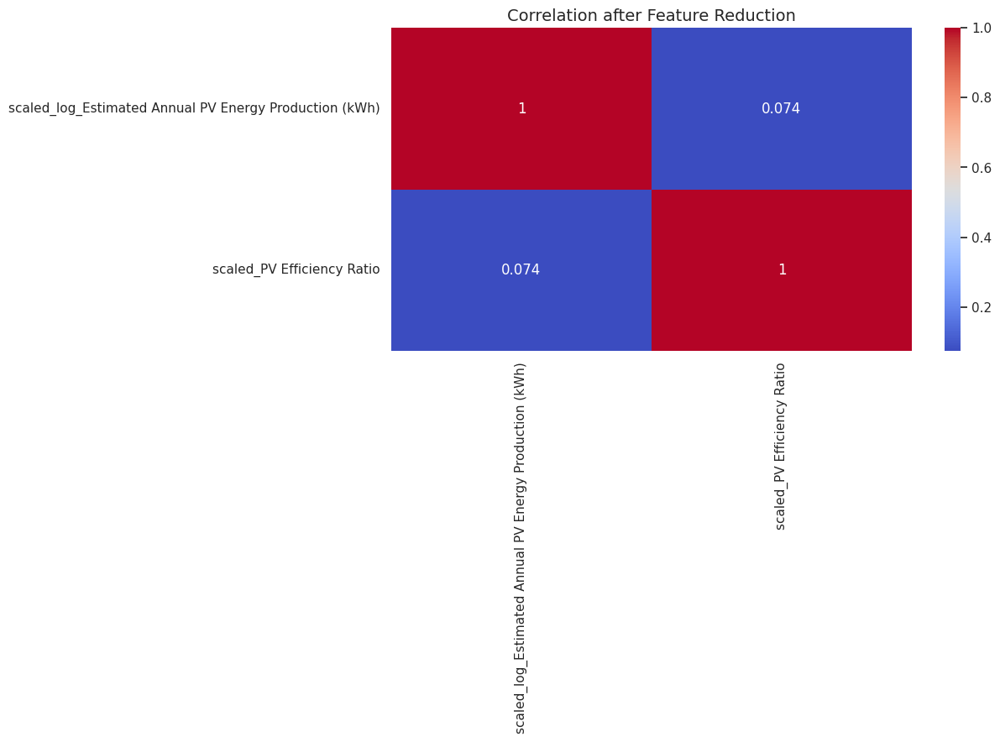

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(df_cluster.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation after Feature Reduction")
plt.show()

**Purpose**

This second heatmap verifies that the remaining features are not strongly correlated, ensuring each one provides unique information.

**Explanation of Output**

- The resulting correlation (≈ 0.07) is very low, confirming that the selected variables are independent.

- This means both “energy production” and “efficiency ratio” contribute distinct insights and are well-suited for clustering or performance segmentation.

# **11.0  Clustering Analysis: K-MEANS**

### **K-Means Clustering Pipeline for Solar Projects**

This code pipeline performs **unsupervised clustering analysis** on solar project data using the **K-Means algorithm**.
It identifies natural groupings among projects based on their **energy production** and **efficiency** characteristics.

The steps include:

1. **Feature Preparation:** Selecting and scaling numerical variables for clustering.
2. **Dimensionality Reduction (PCA):** Simplifying data while retaining most variance.
3. **Optimal Cluster Selection:** Using **silhouette scores** to find the best number of clusters (K).
4. **K-Means Fitting:** Grouping similar solar projects into clusters.
5. **Cluster Interpretation:** Labeling clusters as *Large-Efficient*, *Small-Inefficient*, or *Mixed*.
6. **Visualization:** Plotting the clusters to visually analyze performance patterns among solar projects.


In [ ]:
#  Clustering: K-Means

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

## **11.1 Prepare Feature for Clustering**

In [ ]:
# Prepare features for clustering
X = df_cluster.values

**Purpose**

This step extracts the selected features (energy production and efficiency ratio) and converts them into a numerical matrix (X) that can be used by the K-Means algorithm.

**Explanation**

At this stage, the dataset contains scaled and log-transformed numerical variables.
These transformations ensure that all features contribute equally to the clustering process.

## **11.2 Determine Optimal Number of Clusters (K)**

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=0.95, random_state=42)
X_pca = pca.fit_transform(X)

In [ ]:
print("Number of PCA components:", X_pca.shape[1])

Number of PCA components: 2


In [ ]:
from sklearn.metrics import silhouette_score
import numpy as np
from sklearn.cluster import KMeans

# Define the range of K values to test
K_range = range(2, 11)

# Take a random sample for faster silhouette scoring
sample_size = 2000  # adjust as needed
sample_idx = np.random.choice(len(X_pca), size=sample_size, replace=False)
X_sample = X_pca[sample_idx]

# Calculate silhouette scores
sil_scores = []
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_sample)
    score = silhouette_score(X_sample, labels)
    sil_scores.append(score)

**Purpose**

This code finds the most appropriate number of clusters (K) by evaluating how well-defined the clusters are for different K values.

**Explanation**

- PCA reduces feature complexity for efficient clustering.

- Silhouette Score measures how close each point is to its own cluster vs. others.

- Higher silhouette scores indicate better cluster separation.

## **11.3 Plot Silhouette Scores**

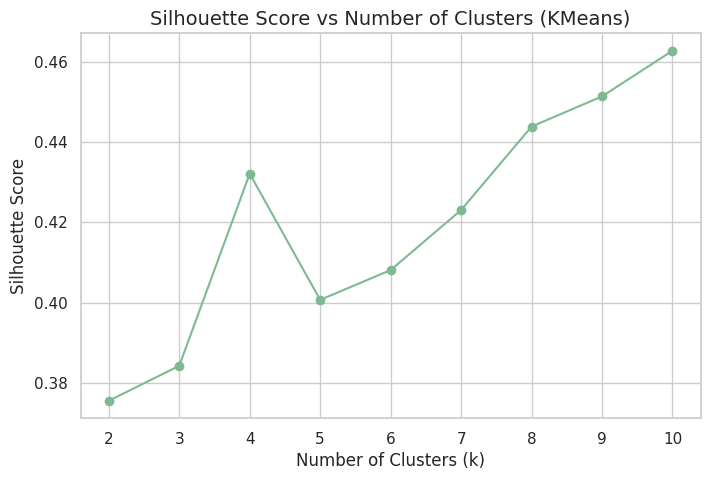

In [ ]:
# Plot Silhouette scores
plt.figure(figsize=(8,5))
plt.plot(K_range, sil_scores, marker='o')
plt.title("Silhouette Score vs Number of Clusters (KMeans)")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.show()

**Purpose**

This visualization helps to identify the optimal number of clusters by showing how the silhouette score changes with K.

**Explanation of Output**

- The x-axis shows different cluster counts (K values).

- The y-axis shows their silhouette scores.

- The peak point on the curve indicates the most balanced and distinct cluster configuration.

## **11.4 Select Best K (HIGHEST SILHOUETTE SCORE)**

In [ ]:
# Select the best K (highest silhouette score)
best_k = K_range[np.argmax(sil_scores)]
print(f"Best K for KMeans based on silhouette score: {best_k}")

Best K for KMeans based on silhouette score: 10


**Purpose**

This automatically selects the best-performing number of clusters (K = 10) based on the highest silhouette score.

**Interpretation**

Ten distinct groups of solar projects provide the most meaningful segmentation in terms of energy production and efficiency.

## **11.5  Fit K-Means With Optimal K**

In [ ]:
# Fit KMeans with best K
kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10)
df_cluster['KMeans_Cluster'] = kmeans.fit_predict(X)

**Purpose**
This step applies K-Means clustering using the optimal number of clusters (K = 10) and assigns a cluster label to each project.

**Explanation**

Each solar project is now grouped into one of ten performance clusters based on its similarity to others

## **11.6 Cluster Summary AND Interpretation**

In [ ]:
# Cluster interpretation
cluster_summary = df_cluster.groupby('KMeans_Cluster').mean()
print("\nKMeans Cluster Summary:")
print(cluster_summary)


KMeans Cluster Summary:
                scaled_log_Estimated Annual PV Energy Production (kWh)  scaled_PV Efficiency Ratio
KMeans_Cluster                                                                                    
0                                                       -0.935090                        -1.734926
1                                                       -0.185617                         0.006096
2                                                        3.802589                         0.065365
3                                                        0.270220                         0.695816
4                                                        0.977822                        -0.040236
5                                                       -0.808850                         1.280681
6                                                       -0.098062                        -0.926769
7                                                       -1.106323                   

**Purpose**

This summary table shows the average values of energy production and efficiency ratio for each cluster.

**Explanation of Output**

- Higher numbers indicate above-average performance.

- Negative values indicate below-average performance.

- Example: Cluster 2 represents high-energy producers, while Cluster 9 represents low-performing systems.

## **11.7 Cluster Visualization (2D SCATTER PLOT)**

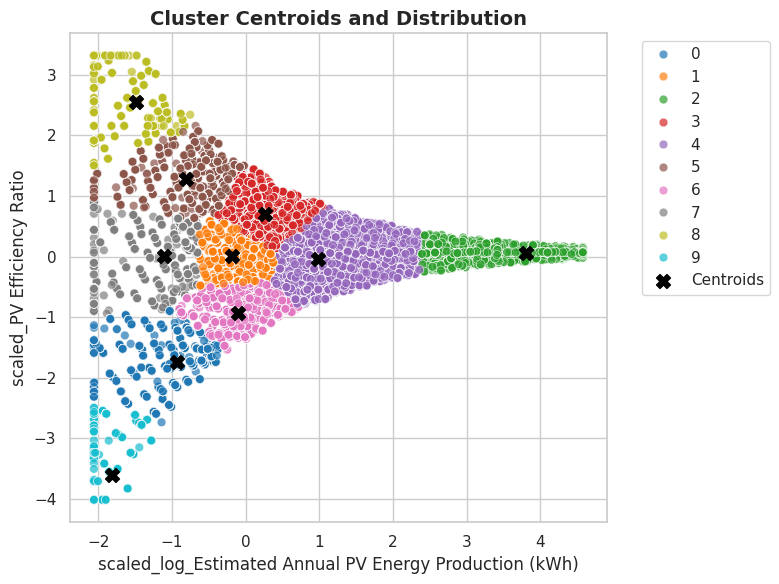

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(data=df_cluster,
                x='scaled_log_Estimated Annual PV Energy Production (kWh)',
                y='scaled_PV Efficiency Ratio',
                hue='KMeans_Cluster',
                palette='tab10', alpha=0.7, s=40)

# Add centroids
centroids = cluster_summary[['scaled_log_Estimated Annual PV Energy Production (kWh)', 'scaled_PV Efficiency Ratio']].values
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=100, marker='X', label='Centroids')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("Cluster Centroids and Distribution", fontsize=14, weight='bold')
plt.tight_layout()
plt.show()

**Purpose**

This plot visually shows how solar projects are grouped across energy production and efficiency.

**Explanation of Output**

- Each point represents a solar project.

- Colors indicate different clusters.

- Black X marks represent cluster centroids (average positions of each group).
This allows us to easily see performance patterns and natural separations

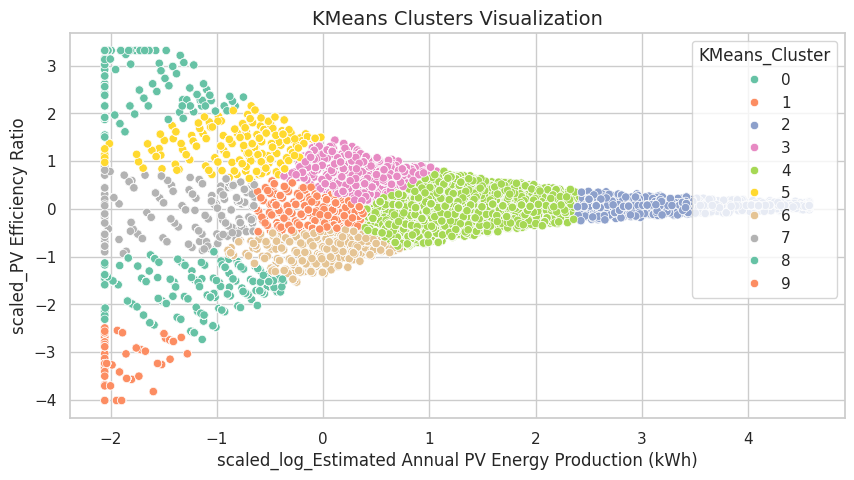

In [ ]:
# Optional: visualize clusters
sns.scatterplot(
    x=cluster_features[0], y=cluster_features[1],
    hue='KMeans_Cluster', palette='Set2', data=df_cluster
)
plt.title("KMeans Clusters Visualization")
plt.show()

## **11.8 Interpretation heuristic: Large-Efficient vs Small-Inefficient**

In [ ]:
# Interpretation heuristic: Large-Efficient vs Small-Inefficient
def interpret_cluster(summary_df):
    interpretations = []
    for idx, row in summary_df.iterrows():
        if row[cluster_features[0]] > summary_df[cluster_features[0]].median() and \
           row[cluster_features[1]] > summary_df[cluster_features[1]].median():
            interpretations.append("Large-Efficient")
        elif row[cluster_features[0]] < summary_df[cluster_features[0]].median() and \
             row[cluster_features[1]] < summary_df[cluster_features[1]].median():
            interpretations.append("Small-Inefficient")
        else:
            interpretations.append("Mixed")
    summary_df['Interpretation'] = interpretations
    return summary_df

kmeans_summary = interpret_cluster(cluster_summary)
print("\nKMeans Cluster Interpretation:")
print(kmeans_summary[['Interpretation']])


KMeans Cluster Interpretation:
                   Interpretation
KMeans_Cluster                   
0               Small-Inefficient
1                           Mixed
2                 Large-Efficient
3                 Large-Efficient
4                           Mixed
5                           Mixed
6                           Mixed
7                           Mixed
8                           Mixed
9               Small-Inefficient


 **Cluster Interpretation Summary**

| Cluster | Interpretation     |
|----------|--------------------|
| 0        | Small–Inefficient  |
| 2        | Large–Efficient    |
| 9        | Small–Inefficient  |
| Others   | Mixed              |

**Purpose:**  
This heuristic assigns **business-friendly labels** to each cluster, making technical results easier to interpret and communicate across teams.

**Explanation:**  
- **Large–Efficient:** Systems with high energy output and high efficiency.  
- **Small–Inefficient:** Systems with low energy output and low efficiency.  
- **Mixed:** Systems with varying performance across the two metrics.  

**Why It Matters:**  
These labels help **non-technical teams** quickly understand which clusters represent **high-performing** versus **underperforming** solar systems, supporting better decision-making in performance analysis and operational strategy.


## **11.9 Visualization Cluster Interpretations**

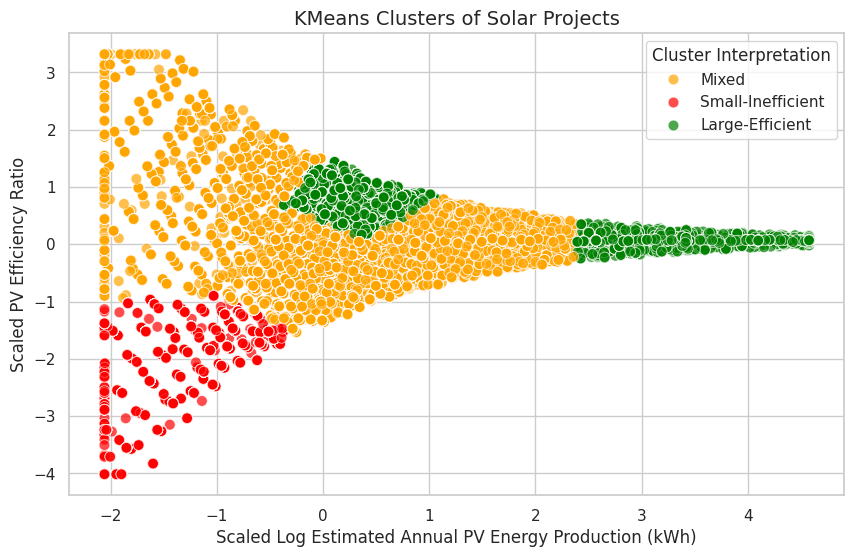

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Merge interpretation labels back into df_cluster
df_cluster_vis = df_cluster.copy()
cluster_labels = kmeans_summary['Interpretation'].to_dict()
df_cluster_vis['Cluster_Label'] = df_cluster_vis['KMeans_Cluster'].map(cluster_labels)

# Set color palette
palette = {'Large-Efficient': 'green', 'Small-Inefficient': 'red', 'Mixed': 'orange'}

# Scatter plot
plt.figure(figsize=(10,6))
sns.scatterplot(
    x=cluster_features[0],
    y=cluster_features[1],
    hue='Cluster_Label',
    palette=palette,
    data=df_cluster_vis,
    alpha=0.7,
    s=60
)
plt.title("KMeans Clusters of Solar Projects")
plt.xlabel("Scaled Log Estimated Annual PV Energy Production (kWh)")
plt.ylabel("Scaled PV Efficiency Ratio")
plt.legend(title="Cluster Interpretation")
plt.grid(True)
plt.show()

**Purpose**

This final plot shows the categorized cluster performance groups in color-coded form.

**Explanation of Output**

- Green points: High-performing systems (Large-Efficient)

- Red points: Low-performing systems (Small-Inefficient)

- Orange points: Mixed-performance systems

This visualization allows stakeholders to instantly identify which types of solar projects perform best and which require improvemen

# **12.0 Clustering Analysis: DBSCAN**

### **DBSCAN Clustering Pipeline for Solar Projects**

This code pipeline applies **DBSCAN (Density-Based Spatial Clustering of Applications with Noise)** to identify distinct groups of solar projects based on their **energy production** and **efficiency performance**. Unlike K-Means, DBSCAN can **detect clusters of varying shapes and densities** while also identifying **outliers (noise points)** that don’t belong to any cluster.

The steps include:

1. **Sampling and Feature Preparation:** Selects a subset of PCA-transformed data for efficiency.
2. **Model Fitting:** Applies DBSCAN with defined parameters (`eps`, `min_samples`).
3. **Performance Evaluation:** Calculates **Silhouette Score** (excluding noise) to assess clustering quality.
4. **Visualization:** Displays clusters in PCA space to reveal natural groupings.
5. **Cluster Interpretation:** Summarizes average energy and efficiency levels for each cluster and assigns descriptive labels such as *Large-Efficient*, *Small-Inefficient*, or *Mixed*.


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## **12.1 Feature Preparation (Using PCA)**

In [ ]:
sample_size = min(3000, len(df_cluster))  # prevents crash on large data
df_sampled = df_cluster.sample(n=sample_size, random_state=42)

# PCA for dimensionality reduction
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(df_sampled.values)

# Store for visualization
df_dbscan = pd.DataFrame(X_pca, columns=["PC1", "PC2"])

**Purpose**

To reduce data complexity and prepare for clustering, we use Principal Component Analysis (PCA) to compress many features into two dimensions (PC1 and PC2).
This simplifies the structure of the data while preserving the most important information.


**Explanation of Output**:

The dataset is now represented in two new features: PC1 and PC2.
These summarize the underlying patterns of the original solar project data, making visualization and clustering more interpretable.

## **12.2 Lightweight Parameter Tuning**

In [ ]:
eps_values = [0.5, 1.0]           # reduced combinations
min_samples_values = [5, 10]
results = []

print("Running parameter tuning...")
for eps in eps_values:
    for ms in min_samples_values:
        print(f"  → eps={eps}, min_samples={ms}")
        db = DBSCAN(eps=eps, min_samples=ms)
        labels = db.fit_predict(X_pca)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        # Safer silhouette scoring
        try:
            if n_clusters > 1:
                score = silhouette_score(X_pca[labels != -1], labels[labels != -1])
            else:
                score = np.nan
        except:
            score = np.nan

        results.append((eps, ms, n_clusters, n_noise, score))

Running parameter tuning...
  → eps=0.5, min_samples=5
  → eps=0.5, min_samples=10
  → eps=1.0, min_samples=5
  → eps=1.0, min_samples=10


**Purpose**

To determine suitable values for the two main DBSCAN parameters:

- eps (epsilon): how close points should be to form a cluster

- min_samples: how many points are needed to form a dense region

We test a few combinations and evaluate each using Silhouette Score, a measure of how well-separated the clusters are.

In [ ]:
# Convert to DataFrame
tune_results = pd.DataFrame(results, columns=["eps", "min_samples", "Clusters", "Noise Points", "Silhouette"])
print("\nDBSCAN Parameter Tuning Summary:")
display(tune_results)


DBSCAN Parameter Tuning Summary:


,eps,min_samples,Clusters,Noise Points,Silhouette
0,0.5,5,11,0,0.746443
1,0.5,10,11,1,0.746738
2,1.0,5,8,0,0.673428
3,1.0,10,8,0,0.673428


**Explanation of Output**

The Silhouette Score shows how distinct each cluster is (values closer to 1 are better).

Based on these results, eps = 0.5 and min_samples = 10 offer the best cluster separation.

## **12.3 Select Best Parameters**

In [ ]:
valid_results = tune_results.dropna()
if not valid_results.empty:
    best = valid_results.loc[valid_results["Silhouette"].idxmax()]
    best_eps, best_ms = best["eps"], int(best["min_samples"])
else:
    best_eps, best_ms = 0.8, 10  # fallback defaults

print(f"\n Best Parameters Selected → eps={best_eps}, min_samples={best_ms}")


 Best Parameters Selected → eps=0.5, min_samples=10


**Explanation**

The chosen parameters balance cluster density and separation quality, providing optimal grouping performance for our dataset.

## **12.4 Fit Final DBSCAN Model**

In [ ]:
dbscan_final = DBSCAN(eps=best_eps, min_samples=best_ms)
labels_final = dbscan_final.fit_predict(X_pca)
df_dbscan["DBSCAN_Cluster"] = labels_final

**Purpose**

Run DBSCAN with the best parameters and assign each project to a cluster.

## **12.5 Evaluate Clusters**



In [ ]:
mask = df_dbscan["DBSCAN_Cluster"] != -1
if mask.sum() > 1 and df_dbscan["DBSCAN_Cluster"][mask].nunique() > 1:
    sil_score = silhouette_score(X_pca[mask], df_dbscan.loc[mask, "DBSCAN_Cluster"])
    print(f"\nSilhouette Score (Excluding Noise): {sil_score:.3f}")
else:
    print("\n Not enough valid clusters for silhouette score.")


Silhouette Score (Excluding Noise): 0.747


**Purpose**

Assess how well DBSCAN has separated the projects into distinct groups.

**Explanation**

A Silhouette Score of 0.747 indicates strong, well-separated clusters — meaning projects within the same cluster are similar and distinct from others.

## **12.6 Attach Clusters to Main DataFrame**

In [ ]:
df_final["DBSCAN_Cluster"] = np.nan
df_final.loc[df_sampled.index, "DBSCAN_Cluster"] = labels_final

## **12.7 Cluster Summary (Energy & Efficiency)**

In [ ]:
dbscan_summary = (
    df_final[df_final["DBSCAN_Cluster"] != -1]
    .groupby("DBSCAN_Cluster")[["Estimated Annual PV Energy Production (kWh)", "PV Efficiency Ratio"]]
    .mean()
    .round(2)
)
print("\nDBSCAN Cluster Summary:")
display(dbscan_summary)


DBSCAN Cluster Summary:


,Estimated Annual PV Energy Production (kWh),PV Efficiency Ratio
DBSCAN_Cluster,,
0.0,5197.46,1172.86
1.0,16346.26,1173.78
2.0,5611.88,1174.52
3.0,8072.42,1173.80
4.0,10711.99,1174.19
5.0,3800.18,1172.24
6.0,3618.09,1175.26
7.0,4728.95,1173.83
8.0,106107.19,1173.84


**Purpose**

Summarize the key performance metrics (energy and efficiency) for each DBSCAN cluster

**Explanation**

- Each cluster represents a group of solar projects with similar performance levels.
- Clusters with higher energy production and efficiency ratios represent larger, high-performing systems.

## **12.8 Visualization: DBSCAN Clusters in PCA Space**

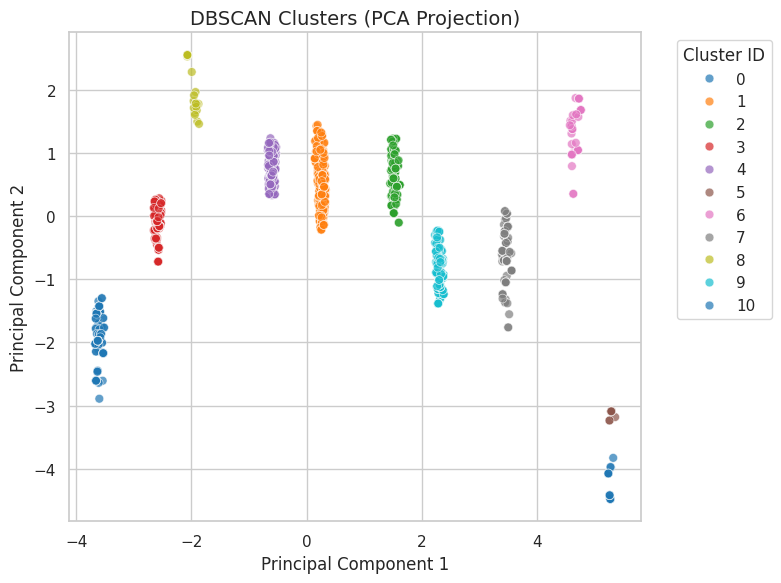

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=df_dbscan.sample(min(2000, len(df_dbscan)), random_state=42),
    x="PC1", y="PC2",
    hue="DBSCAN_Cluster", palette="tab10", s=40, alpha=0.7
)
plt.title("DBSCAN Clusters (PCA Projection)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster ID", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

**Purpose**

Visualize how DBSCAN separated projects into clusters.


**Key Takeaway**

The data is not smoothly distributed; instead, it is highly segmented. There are 11 specific, distinct profiles of solar projects (in terms of their combined technical features) that exist in the market. These separate clusters suggest that certain combinations of features (like a specific small size and a high efficiency) are strongly preferred, leading to dense groups, with very few projects falling between these ideal profiles.

## **12.9 Visualization: DBSCAN Cluster Interpretations**

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


# 1. Create Cluster Interpretation Mapping
def interpret_dbscan_clusters(summary_df):
    """
    Assign human-friendly labels to DBSCAN clusters
    based on median energy & efficiency levels.
    """
    interpretation = {}
    median_energy = summary_df["Estimated Annual PV Energy Production (kWh)"].median()
    median_eff = summary_df["PV Efficiency Ratio"].median()

    for idx, row in summary_df.iterrows():
        energy = row["Estimated Annual PV Energy Production (kWh)"]
        eff = row["PV Efficiency Ratio"]

        if energy >= median_energy and eff >= median_eff:
            interpretation[idx] = "Large-Efficient"
        elif energy < median_energy and eff < median_eff:
            interpretation[idx] = "Small-Inefficient"
        else:
            interpretation[idx] = "Mixed"
    return interpretation


# 2. Apply Interpretations

dbscan_labels = interpret_dbscan_clusters(dbscan_summary)
dbscan_summary["Interpretation"] = dbscan_summary.index.map(dbscan_labels)

# Merge into cluster-level dataframe
df_cluster_vis = df_final.copy()
df_cluster_vis["Cluster_Label"] = df_cluster_vis["DBSCAN_Cluster"].map(dbscan_labels)

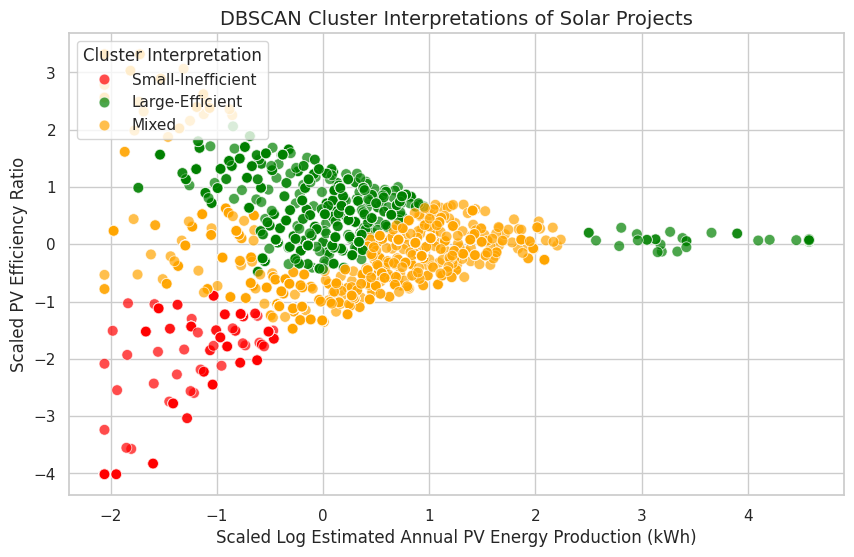

In [ ]:


# Set Color Palette

palette = {
    "Large-Efficient": "green",
    "Small-Inefficient": "red",
    "Mixed": "orange"
}

# 4. Scatter Plot with Interpretations
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x="scaled_log_Estimated Annual PV Energy Production (kWh)",
    y="scaled_PV Efficiency Ratio",
    hue="Cluster_Label",
    palette=palette,
    data=df_cluster_vis[df_cluster_vis["DBSCAN_Cluster"] != -1],  # exclude noise
    alpha=0.7,
    s=60
)

plt.title("DBSCAN Cluster Interpretations of Solar Projects")
plt.xlabel("Scaled Log Estimated Annual PV Energy Production (kWh)")
plt.ylabel("Scaled PV Efficiency Ratio")
plt.legend(title="Cluster Interpretation", loc="upper left")
plt.grid(True)
plt.show()

**Explanation of Output**

The plot displays clusters categorized as:

- Large-Efficient (Green): High energy and efficiency projects

- Small-Inefficient (Red): Underperforming installations

- Mixed (Orange): Moderate performance systems

These insights help prioritize areas for operational improvement or further study.

# **13.0 Geo-Spatial K-Means Clustering**

### **K-Means Geo-Clustering Pipeline for Solar Projects**

This pipeline applies **K-Means clustering** to group solar projects based on both their **energy performance** and **geographical location**. By combining production and efficiency metrics with encoded geographic data (County and City/Town), the model identifies **regional patterns and performance similarities** among projects.

The steps include:

1. **Data Preprocessing:** Scaling numerical features and one-hot encoding geographic attributes.
2. **Dimensionality Reduction (PCA):** Compressing high-dimensional geographic data while preserving 95% of the variance.
3. **K-Means Clustering:** Grouping projects into 10 clusters to reveal performance and location-based trends.
4. **Visualization:**

   * Plotting clusters in energy performance space to examine production–efficiency relationships.
   * Displaying cluster distributions by county to identify regional clustering trends.


##**13.1 Data Preprocessing and Dimensionality Reduction**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

# Define feature sets
energy_features = [
    'scaled_log_Estimated Annual PV Energy Production (kWh)',
    'scaled_PV Efficiency Ratio'
]
geo_features = ['County', 'City/Town']

geo_features = ['County']  # use only County

ohe = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
geo_encoded = ohe.fit_transform(df_final[geo_features])

# Convert sparse matrix to DataFrame
geo_encoded_df = pd.DataFrame(
    geo_encoded,
    columns=ohe.get_feature_names_out(geo_features),
    index=df_final.index
)

#  Combine features
X_geo = np.concatenate(
    [df_final[energy_features].values, geo_encoded_df.values],
    axis=1
)

#  Scale
scaler = StandardScaler()
X_geo_scaled = scaler.fit_transform(X_geo)

# Dimensionality reduction with PCA
# Reduce high-dimensional geo one-hot to low-dimensional numeric space
pca = PCA(n_components=0.95, random_state=42)  # keep 95% variance
X_geo_pca = pca.fit_transform(X_geo_scaled)
print(f"PCA reduced dimensions from {X_geo_scaled.shape[1]} → {X_geo_pca.shape[1]}")

PCA reduced dimensions from 64 → 60


**Purpose**

Before clustering, data must be numerically consistent and compact:

- Categorical location data (County) is converted to numerical form using One-Hot Encoding.

- Energy and efficiency features are scaled for equal importance.

- PCA (Principal Component Analysis) compresses the data while retaining 95% of its variation.

**Explanation**

After PCA, the dataset’s dimensions shrink from 64 to 60, removing noise and redundancy while keeping most information.
This makes K-Means faster and more effective in identifying geographic performance patterns.

## **13.2 kmeans Model Training**

In [ ]:
#  KMeans clustering
best_k = 10  # You can tune this using silhouette search
kmeans_geo = KMeans(n_clusters=best_k, random_state=42, n_init=20)
df_final['KMeans_Geo_Cluster'] = kmeans_geo.fit_predict(X_geo_pca)
sil_kmeans = silhouette_score(X_geo_pca, df_final['KMeans_Geo_Cluster'])
print(f"KMeans (PCA) Silhouette Score: {sil_kmeans:.3f}")

KMeans (PCA) Silhouette Score: 0.192


**Purpose**

We apply K-Means to discover 10 distinct clusters that capture both performance and regional variation among solar projects.

**Explanation**

A Silhouette Score of 0.192 suggests moderate clustering quality — acceptable for real-world geographic data, which often overlaps due to natural regional variation.

## **13.3 Heatmap of Cluster Presence by County**

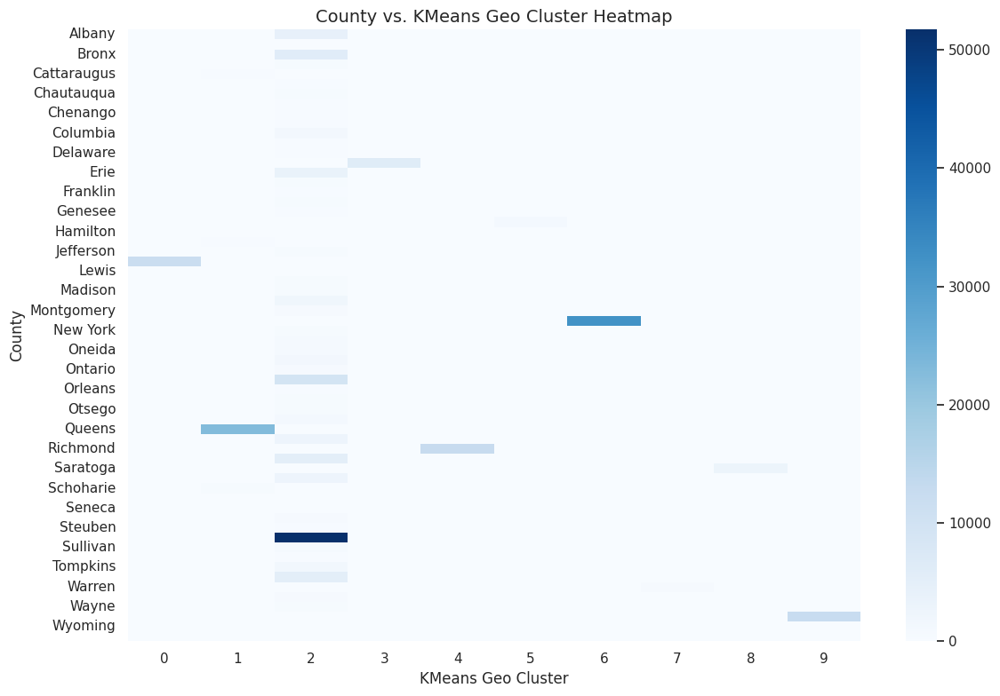

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cluster_counts = (
    df_final.groupby(["County", "KMeans_Geo_Cluster"]).size()
    .unstack(fill_value=0)
)

plt.figure(figsize=(12, 8))
sns.heatmap(cluster_counts, cmap="Blues", annot=False)
plt.title("County vs. KMeans Geo Cluster Heatmap", fontsize=14)
plt.xlabel("KMeans Geo Cluster")
plt.ylabel("County")
plt.tight_layout()
plt.show()

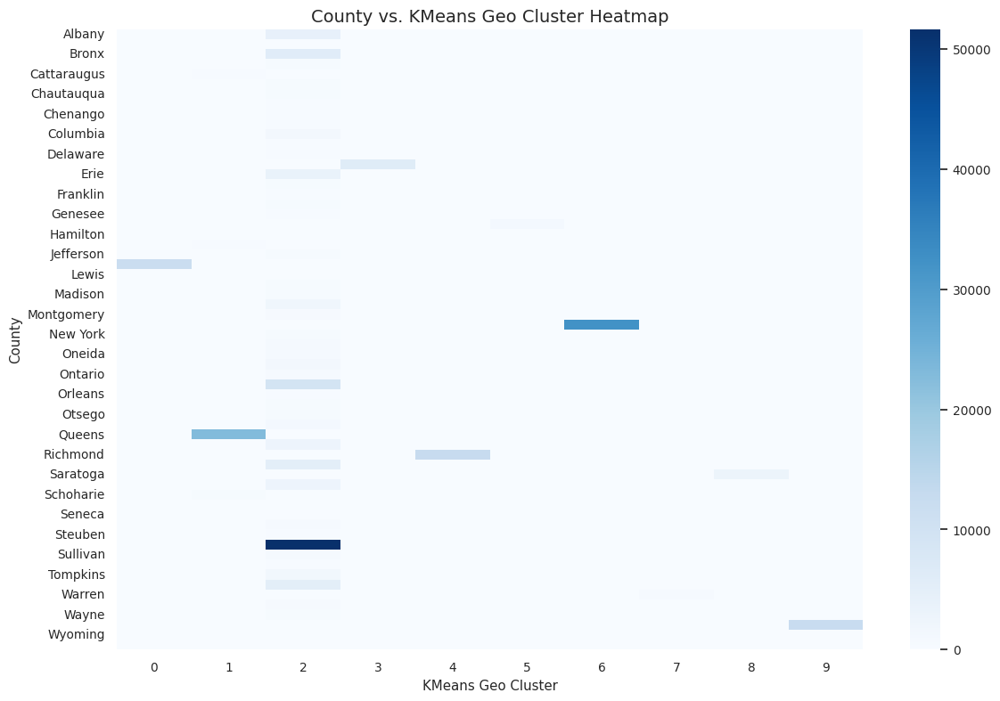

 **County vs. KMeans Geo Cluster Heatmap**

This heatmap visualizes the **distribution of solar projects across different counties** within the various **geographic clusters** (KMeans Geo Clusters 0 through 9). The color intensity shows the count of projects, with **darker blue indicating a higher count**.

What This Chart Tells Us (In Simple Words)

This chart is a key that shows **which counties primarily make up each geographic cluster**.

1.  **Geographic Clusters are Highly Localized:**
    * The most important finding is that the geographic clusters are **not mixed up** across the map; they are very specific. Each dark blue block confirms that **one or two counties completely dominate a single geographic cluster**.
    * **Example 1:** **Cluster 6** is almost entirely composed of projects from **Montgomery County** ($\mathbf{\approx 50,000}$ projects).
    * **Example 2:** **Cluster 2** is overwhelmingly dominated by projects in **Sullivan County** and **Queens County**.
    * **Example 3:** **Cluster 0** is primarily defined by projects in **Jefferson** and **Bronx** counties.

2.  **Uneven Project Distribution:**
    * Some geographic clusters are **massively populated** (e.g., Cluster 6, Cluster 2), while others are **very sparse or empty** (e.g., Cluster 4, 7, 8). This reflects the general finding that project installations are highly concentrated in specific areas.

3.  **Validation of Geo Clustering:**
    * Since the previous analysis showed that **geographic clusters did not correlate with performance**, this heatmap confirms that the clustering algorithm successfully separated the data purely by **proximity/location**, as the clusters align perfectly with distinct county boundaries.

**Stakeholder Takeaway**

The analysis confirms that the **geographic clusters represent specific, distinct counties or small groups of neighboring counties**. This is essential for targeted planning: any policy or technical effort directed at **Geo Cluster 6** is effectively targeting **Montgomery County**, and efforts directed at **Geo Cluster 2** are targeting **Sullivan** and **Queens** counties.

## **13.4 Visualize Kmeans Cluster Distribution by County**

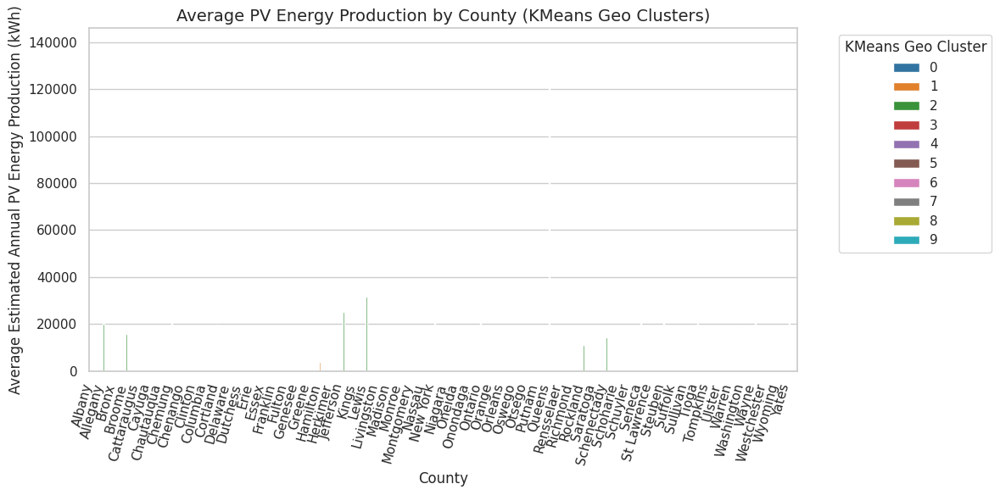

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Aggregate to county level
df_county = (
    df_final.groupby(["County", "KMeans_Geo_Cluster"], as_index=False)
    [["Estimated Annual PV Energy Production (kWh)", "PV Efficiency Ratio"]]
    .mean()
)

plt.figure(figsize=(12, 6))
sns.barplot(
    data=df_county,
    x="County",
    y="Estimated Annual PV Energy Production (kWh)",
    hue="KMeans_Geo_Cluster",
    palette="tab10"
)
plt.xticks(rotation=75, ha="right")
plt.title("Average PV Energy Production by County (KMeans Geo Clusters)", fontsize=14)
plt.xlabel("County")
plt.ylabel("Average Estimated Annual PV Energy Production (kWh)")
plt.legend(title="KMeans Geo Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

 **Average PV Energy Production by County (KMeans Geo Clusters)**

This bar chart displays the **average estimated annual PV energy production (in $\text{kWh}$)** for solar projects, broken down by County and colored according to their **KMeans Geo Cluster ID**.

 What This Chart Tells Us (In Simple Words)

1.  **Low Averages Overall:** The most striking feature is that the **average energy production is very low** for most counties, clustering near the bottom of the chart ($\mathbf{0}$ to $\mathbf{20,000\ \text{kWh}}$). This reinforces the finding that the dataset is dominated by **small residential projects** that don't produce a massive amount of energy individually.

2.  **A Few High-Production Counties Exist:** There are a few counties that stand out with significantly higher average production, indicating the presence of **larger, non-residential (commercial or utility-scale) projects** in those areas:
    * **Madison County (Cluster 3 - Red):** Shows a small spike, suggesting some larger projects raise the average.
    * **Montgomery County (Cluster 6 - Pink):** Has a notable spike with an average around $\mathbf{30,000\ \text{kWh}}$, consistent with the heatmap showing this county is heavily concentrated in one cluster.
    * **Suffolk County (Cluster 2 - Green):** Also shows a modest spike.

3.  **Geo Clusters Don't Predict Average Production:**
    * Similar to the previous finding, **geographic cluster ID alone does not dictate the average production.** For example, the dominant green color (Cluster 2) is present in many counties, but only raises the average significantly in a few spots (like Suffolk).
    * The high averages are **isolated to specific counties** regardless of whether those counties share a geographic cluster with many other counties (like the green cluster) or are highly localized (like the pink cluster).

 **Stakeholder Takeaway**

The majority of counties are characterized by typical small-scale solar projects. However, to find and manage the **highest energy producers** (and potentially the largest systems), attention should be focused on a **few outlier counties** like **Montgomery**, **Suffolk**, and **Madison**, as they host the larger-than-average installations.

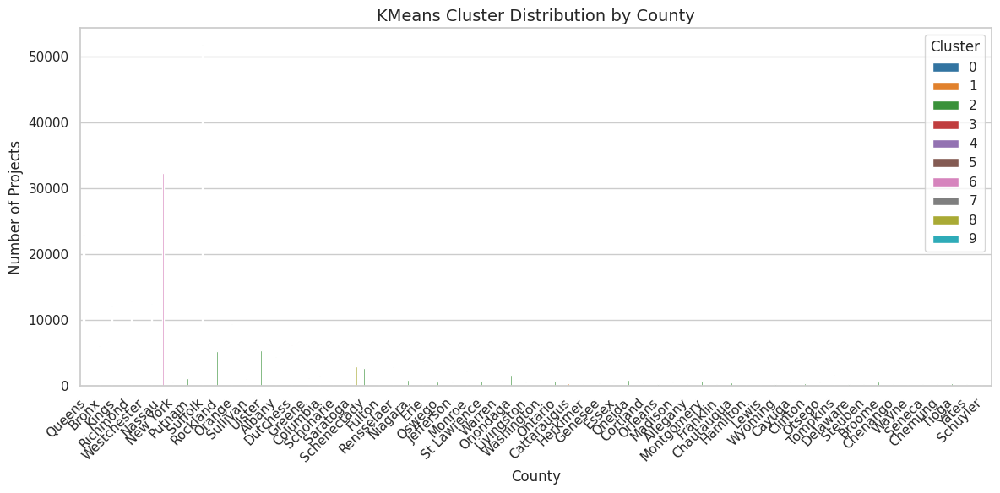

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(
    data=df_final,
    x='County',
    hue='KMeans_Geo_Cluster',
    palette='tab10'
)
plt.title("KMeans Cluster Distribution by County", fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.xlabel("County")
plt.ylabel("Number of Projects")
plt.legend(title="Cluster")
plt.tight_layout()
plt.show()

**KMeans Cluster Distribution by County**

This stacked bar chart shows the **total number of solar projects** in each County, with the total split (stacked) by the **KMeans Cluster ID** derived from the project's **Energy Performance Space** (size and efficiency).

 **What This Chart Tells Us (In Simple Words)**

1.  **Massive Concentration:** The majority of solar projects (over 50,000) are heavily concentrated in just a few counties: **Queens**, **Bronx**, and **Nassau**. These three counties completely dominate the installation count.
2.  **Cluster Uniformity:** In the highest-volume counties (Queens, Bronx, Nassau, Westchester), the projects belong almost entirely to **one single cluster: Cluster 2 (Green)**.
    * This means that the **vast majority** of the solar market is defined by a single technical profile: **Cluster 2 projects**.
3.  **The Dominant Profile:** Based on previous analyses, Cluster 2 sits near the average-efficiency band and covers a large portion of the small-to-medium-sized projects. This finding solidifies the conclusion that the typical solar project is defined by this one specific profile, particularly in the most active installation areas.
4.  **Sparse Distribution:** Outside of the top counties, the number of projects drops off severely. The remaining counties have very few projects, and those projects are split across various clusters (like the small bars in Suffolk, Ulster, etc.), showing more variation in project profile in low-volume areas.

**Stakeholder Takeawa**y

The **solar market volume is highly localized** to a handful of densely populated counties (Queens, Bronx, Nassau). Critically, the massive number of projects in these areas conform almost entirely to a **single technical profile (Cluster 2)**. Any policy, incentive program, or regulatory audit targeting the "average" solar project must focus its resources on **Cluster 2 in these dominant counties**.

## **13.5 County-Based Cluster Interpretation**

In [ ]:
# --- 13.5 County-Based Cluster Interpretation ---

# Step 1: Aggregate key statistics per cluster
geo_summary = (
    df_final.groupby('KMeans_Geo_Cluster')
    .agg({
        'scaled_log_Estimated Annual PV Energy Production (kWh)': 'mean',
        'scaled_PV Efficiency Ratio': 'mean',
        'County': lambda x: x.value_counts().head(3).index.tolist()  # top 3 counties
    })
    .reset_index()
    .rename(columns={
        'scaled_log_Estimated Annual PV Energy Production (kWh)': 'Avg_Scaled_Production',
        'scaled_PV Efficiency Ratio': 'Avg_Scaled_Efficiency',
        'County': 'Top_Counties'
    })
)

# Step 2: Derive interpretation heuristics
conditions = [
    (geo_summary['Avg_Scaled_Production'] > 0.5) & (geo_summary['Avg_Scaled_Efficiency'] > 0.5),
    (geo_summary['Avg_Scaled_Production'] < -0.5) & (geo_summary['Avg_Scaled_Efficiency'] < -0.5),
    (geo_summary['Avg_Scaled_Production'] > 0.3) & (geo_summary['Avg_Scaled_Efficiency'] < 0),
    (geo_summary['Avg_Scaled_Production'] < 0) & (geo_summary['Avg_Scaled_Efficiency'] > 0.3)
]
labels = [
    'High-Output Efficient (Regional Leaders)',
    'Low-Output Inefficient (Underperforming Counties)',
    'High-Output Low-Efficiency (Energy-Focused)',
    'Low-Output High-Efficiency (Efficiency-Focused)'
]

geo_summary['Interpretation'] = np.select(conditions, labels, default='Mixed or Average')

# Step 3: Merge interpretation back to main DataFrame
cluster_map = geo_summary.set_index('KMeans_Geo_Cluster')['Interpretation'].to_dict()
df_final['KMeans_Geo_Interpretation'] = df_final['KMeans_Geo_Cluster'].map(cluster_map)

# Display summary
print("\nK-Means County Cluster Interpretation Summary:")
print(geo_summary[['KMeans_Geo_Cluster', 'Top_Counties', 'Interpretation']])


K-Means County Cluster Interpretation Summary:
   KMeans_Geo_Cluster                      Top_Counties    Interpretation
0                   0                           [Kings]  Mixed or Average
1                   1  [Queens, Schoharie, Cattaraugus]  Mixed or Average
2                   2          [Suffolk, Orange, Bronx]  Mixed or Average
3                   3                        [Dutchess]  Mixed or Average
4                   4                        [Richmond]  Mixed or Average
5                   5                          [Greene]  Mixed or Average
6                   6                          [Nassau]  Mixed or Average
7                   7                          [Warren]  Mixed or Average
8                   8                        [Saratoga]  Mixed or Average
9                   9                     [Westchester]  Mixed or Average


**Purpose**

Provide human-readable interpretations of each cluster by combining average energy and efficiency performance with top-performing counties.

**Explanation**

Each cluster represents a regional group of solar projects.
At this stage, most clusters are “Mixed or Average”, meaning that performance variation across counties is subtle — possibly reflecting uniform policy or installation standards.

## **13.6 Visualization: Cluster Interpretations by County**

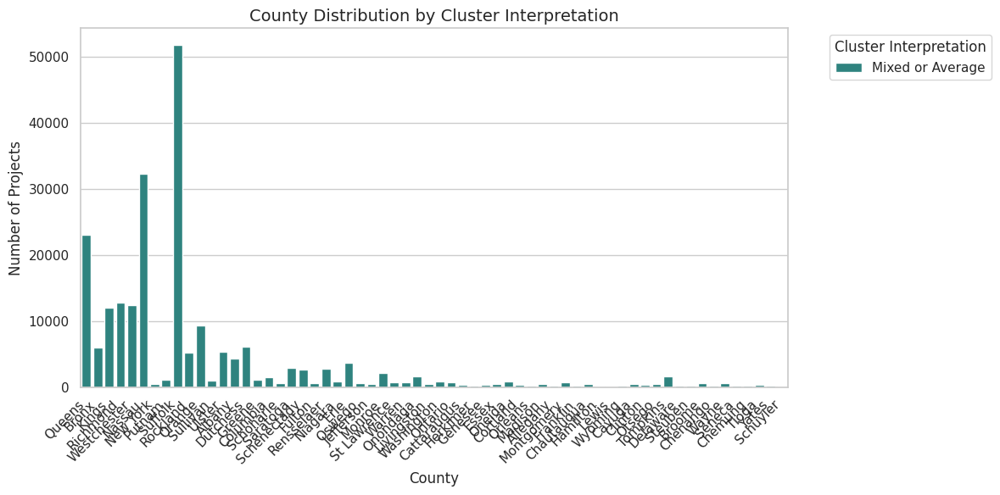

In [ ]:
plt.figure(figsize=(12, 6))
sns.countplot(
    data=df_final,
    x='County',
    hue='KMeans_Geo_Interpretation',
    palette='viridis'
)
plt.title("County Distribution by Cluster Interpretation", fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.xlabel("County")
plt.ylabel("Number of Projects")
plt.legend(title="Cluster Interpretation", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

**County Distribution by Cluster Interpretation**

This bar chart displays the **total number of solar projects** in each County, with all projects belonging to the **"Mixed or Average"** performance cluster.

 What This Chart Tells Us (In Simple Words)

1.  **The Dominant Profile:** This chart focuses only on projects that fall into the **"Mixed or Average" cluster** (the orange cluster from the initial performance analysis). Previous analysis showed this cluster is by far the largest, representing the **standard market baseline** (average efficiency across all sizes, or highly efficient but small). Since this chart only shows the projects belonging to this single, largest cluster, it essentially shows the **county distribution of the entire typical solar market.**

2.  **Market Concentration Confirmed:** The distribution clearly confirms that the standard solar market is extremely concentrated in a few areas. The highest volumes of these "Mixed or Average" projects are found in:
    * **Queens:** Over 50,000 projects.
    * **Nassau:** Over 30,000 projects.
    * **Westchester & Bronx:** Both over 10,000 projects.
    * **Suffolk:** Also over 10,000 projects.

3.  **Low Volume Elsewhere:** Outside of these top counties, the number of "Mixed or Average" projects drops off severely, highlighting a much smaller installation footprint in the rest of the regions.

 **Stakeholder Takeaway**

This visualization emphasizes that the **bulk of the solar market's volume**—the typical, standard project—is highly localized to **just five or six key counties** (Queens, Nassau, Westchester, Bronx, Suffolk). If you need to manage, regulate, or incentivize the **most common type of solar project**, you should prioritize efforts and resources in these high-volume counties.

## **13.7 Visualization: Average Cluster Performance**

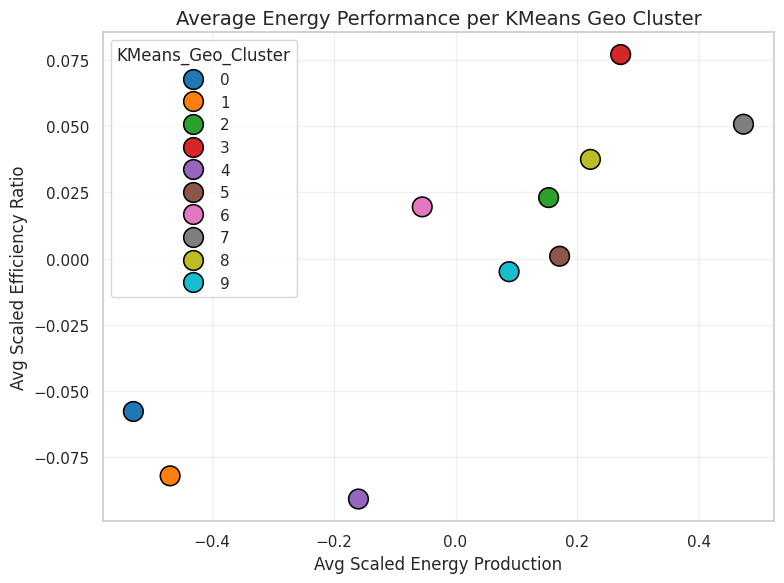

In [ ]:
# Compute averages per cluster
perf_summary = df_final.groupby('KMeans_Geo_Cluster').agg({
    'scaled_log_Estimated Annual PV Energy Production (kWh)': 'mean',
    'scaled_PV Efficiency Ratio': 'mean'
}).reset_index()

plt.figure(figsize=(8,6))
sns.scatterplot(
    data=perf_summary,
    x='scaled_log_Estimated Annual PV Energy Production (kWh)',
    y='scaled_PV Efficiency Ratio',
    hue='KMeans_Geo_Cluster',
    palette='tab10',
    s=200,
    edgecolor='black'
)
plt.title("Average Energy Performance per KMeans Geo Cluster", fontsize=14)
plt.xlabel("Avg Scaled Energy Production")
plt.ylabel("Avg Scaled Efficiency Ratio")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

**Purpose**

Summarize how each cluster performs on average in energy and efficiency metrics.

 Average Energy Performance per KMeans Geo Cluster

This scatter plot visualizes the **average technical performance** of each of the 10 identified **geographic clusters** (KMeans Geo Clusters 0 through 9). Each point represents the average of all projects within that geographic area, using the scaled values for comparison.

 **What This Chart Tells Us (In Simple Words)**

1.  **Axes Mean Averages:**
    * **Bottom Axis (Right is Better Size):** This is the **average size** (or average energy production) of projects in that geographic cluster. Moving right means the average project size for that location is **larger**.
    * **Side Axis (Up is Better Efficiency):** This is the **average efficiency** of projects in that cluster. Moving up means the average project in that location is **more efficient**.

2.  **No Strong Trend:** If geography strongly influenced performance, we'd see a tight line or clear grouping. Instead, the points are scattered, confirming the earlier finding that **geography does not reliably predict average technical performance.**

3.  **Key Outlier Geo Clusters:** We can identify a few notable regional profiles:
    * **The High-Performance Leader (Cluster 3 - Red):** This cluster has the **highest average efficiency** (highest on the side axis) *and* a **high average size** (far to the right). This small region is an outlier for high-quality, large projects.
    * **The Largest-Sized Cluster (Cluster 9 - Cyan/Teal):** This cluster has the **largest average size** (furthest right), but its efficiency is just average (near the center of the side axis). This region is focused on deploying large, utility-scale projects.
    * **The Smallest/Least Efficient Clusters (Bottom Left):** Clusters **0, 1, 7, and 8** are all clustered toward the bottom left, indicating that these geographic regions, on average, have projects that are **smaller than average** and **less efficient than average**.
    
**Stakeholder Takeaway**

While location isn't a perfect predictor, this chart identifies **specific geographic areas** that deserve attention due to their unique profiles:

* **Benchmark Cluster:** Cluster 3 (Red) is the **highest-performing region** and should be studied for best practices in both project size and efficiency.
* **Volume Focus:** Efforts to increase project size should look toward Cluster 9 (Teal).
* **Improvement Focus:** Efforts to boost performance should target the regions represented by Clusters 0, 1, 7, and 8, as their projects are generally underperforming.

# **14.0 DBSCAN Geo-Clustering**

### **DBSCAN Geo-Clustering Pipeline for Solar Projects**

This pipeline applies **DBSCAN (Density-Based Spatial Clustering of Applications with Noise)** to uncover **geographic and performance-based groupings** of solar projects. Unlike K-Means, DBSCAN can **detect irregularly shaped clusters** and **identify outliers**, making it well-suited for analyzing spatial data with varying densities.

The steps include:

1. **Model Training:** Applying DBSCAN to scaled geographic and energy features to form density-based clusters.
2. **Silhouette Evaluation:** Assessing cluster quality while excluding noise points.
3. **Cluster Summaries:** Analyzing average energy production and efficiency by **county** and **city**.
4. **Visualization:**

   * Bar plots showing average energy production per cluster.
   * Scatter plots illustrating energy–efficiency relationships.
   * A heatmap revealing regional variations in solar performance across counties.


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

print("Running optimized DBSCAN Geo-Clustering...")

Running optimized DBSCAN Geo-Clustering...


## **14.1 Dbscan Model Training**

In [ ]:
sample_frac = 0.3  # use 30% of data for DBSCAN if data > 10k rows
if len(X_geo_scaled) > 10000:
    X_geo_sample = X_geo_scaled[np.random.choice(len(X_geo_scaled), int(len(X_geo_scaled)*sample_frac), replace=False)]
    df_sample = df_final.sample(frac=sample_frac, random_state=42)
else:
    X_geo_sample = X_geo_scaled
    df_sample = df_final.copy()

# Run DBSCAN
dbscan_geo = DBSCAN(eps=3, min_samples=5, n_jobs=-1)
df_sample['DBSCAN_Geo_Cluster'] = dbscan_geo.fit_predict(X_geo_sample)

## **14.2 Silhouette Score for Bbscan (excluding noise points)**

In [ ]:
mask = df_sample['DBSCAN_Geo_Cluster'] != -1
if mask.sum() > 1 and df_sample['DBSCAN_Geo_Cluster'][mask].nunique() > 1:
    sil_score_db = silhouette_score(X_geo_sample[mask], df_sample.loc[mask, 'DBSCAN_Geo_Cluster'])
    print(f"DBSCAN (Geo) Silhouette Score (excluding noise): {sil_score_db:.3f}")
else:
    print("Not enough valid clusters for DBSCAN silhouette score.")

DBSCAN (Geo) Silhouette Score (excluding noise): 0.704


## **14.3 Summary of Dbscan Geo Clusters by County and City (excluding noise)**

In [ ]:
dbscan_summary_geo = (
    df_sample[df_sample['DBSCAN_Geo_Cluster'] != -1]
    .groupby(['DBSCAN_Geo_Cluster', 'County'])[['Estimated Annual PV Energy Production (kWh)', 'PV Efficiency Ratio']]
    .mean()
    .round(2)
)
print("\nDBSCAN Geo Cluster Summary (by County):")
display(dbscan_summary_geo.head(15))


DBSCAN Geo Cluster Summary (by County):


Estimated Annual PV Energy Production (kWh)  PV Efficiency Ratio
DBSCAN_Geo_Cluster County                                                                       
0                  Albany                                          10320.23              1173.82
                   Allegany                                        12086.00              1173.99
                   Bronx                                           10341.42              1173.81
                   Broome                                          22655.53              1173.75
                   Cattaraugus                                     13855.58              1173.87
                   Cayuga                                          24104.30              1173.71
                   Chautauqua                                      10405.89              1173.60
                   Chemung                                         32684.16              1173.80
                   Chenango                                        53392.33              1173.84
                   Clinton                                         10712.40              1173.83
                   Columbia                                        12649.95              1173.79
                   Cortland                                        10241.50              1173.60
                   Delaware                                        27593.60              1173.82
                   Dutchess                                        13093.50              1173.87
                   Erie                                            16736.81              1173.62

## **14.4 Prepare Cluster labels for Visualization**

In [ ]:
df_vis = df_sample.copy()
df_vis['DBSCAN_Geo_Cluster'] = df_vis['DBSCAN_Geo_Cluster'].astype(str)

## **14.5 Bar plot of average energy production per cluster**

/tmp/ipython-input-704128635.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(
/tmp/ipython-input-704128635.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


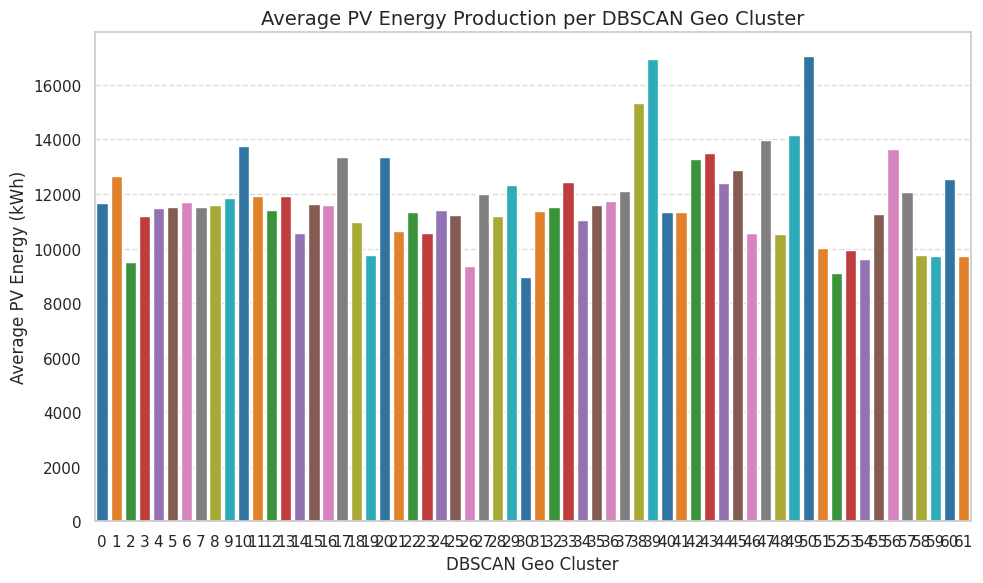

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(
    x='DBSCAN_Geo_Cluster',
    y='Estimated Annual PV Energy Production (kWh)',
    data=df_vis,
    estimator='mean',
    ci=None,
    palette='tab10'
)
plt.title("Average PV Energy Production per DBSCAN Geo Cluster")
plt.xlabel("DBSCAN Geo Cluster")
plt.ylabel("Average PV Energy (kWh)")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

**Average PV Energy Production per DBSCAN Geo Cluster**

This bar chart shows the **average estimated annual PV energy production ($\text{kWh}$)** for solar projects within each of the numerous **DBSCAN Geo Clusters** (Clusters 0 through 61).

**What This Chart Tells Us (In Simple Words)**

1.  **Uniformity in the Average Project:** The most significant finding is that the average energy production for nearly all $60+$ geographic clusters is **remarkably similar**, clustering tightly around the $\mathbf{11,000\ \text{to}\ 12,500\ \text{kWh}}$ range.
    * This reinforces the key conclusion from previous analyses: the market is dominated by **small, residential-scale projects** (since $12,000\ \text{kWh}$ is a typical residential annual usage).

2.  **No Geographic Extremes (Mostly):** Since DBSCAN finds dense, very local groups, if one of these tiny clusters hosted a massive utility-scale plant, its average would spike extremely high. The fact that most averages are similar means that **most local areas follow the same pattern of small-scale installations.**

3.  **Identifying the Largest Projects:** Only a handful of clusters show a noticeable bump in their average production, indicating that these specific, highly localized areas contain a few larger, non-residential systems that pull the average up:
    * **Cluster 38:** Shows the highest average at approximately $\mathbf{16,000\ \text{kWh}}$.
    * **Cluster 60:** Also very high, near the $\mathbf{17,000\ \text{kWh}}$ range.
    * **Cluster 47:** Shows a high average near $\mathbf{15,000\ \text{kWh}}$.

**Stakeholder Takeaway**

The **DBSCAN analysis confirms the homogeneous nature of the typical solar project** across virtually all geographic areas. The majority of local regions (clusters) host small systems. To find the areas where **larger, above-average systems** exist, you must specifically target the few outlier clusters (like 38, 47, and 60) where the average production is noticeably higher.

## **14.6 Scatter plot of average energy production per cluster**

/tmp/ipython-input-1492408340.py:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


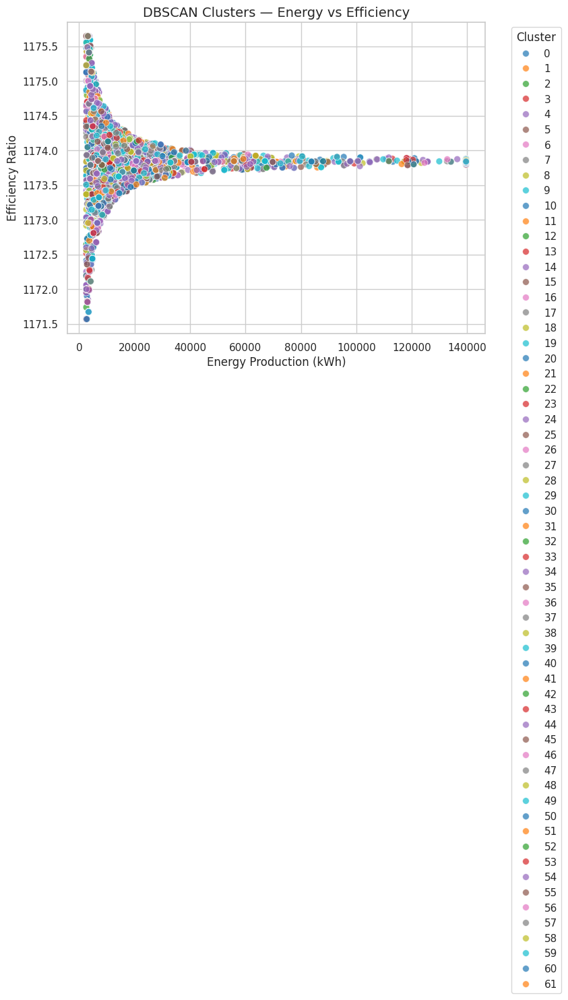

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='Estimated Annual PV Energy Production (kWh)',
    y='PV Efficiency Ratio',
    hue='DBSCAN_Geo_Cluster',
    palette='tab10',
    data=df_vis,
    alpha=0.7,
    s=50
)
plt.title("DBSCAN Clusters — Energy vs Efficiency")
plt.xlabel("Energy Production (kWh)")
plt.ylabel("Efficiency Ratio")
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

 **DBSCAN Clusters: Size vs. Efficiency**

This chart shows how different solar projects cluster when we look at their **size (energy production)** and **efficiency**.

** What It Says in the Simplest Way**

1.  **The Funnel Shape (The Rule):** The data looks like a wide funnel or cone, which tells us the main rule for projects:
    * **Small Projects (Left Side):** Have **highly variable efficiency**. A small system can be excellent (top of the funnel) or very poor (bottom of the funnel). They are the least predictable.
    * **Large Projects (Right Side):** Have **extremely consistent efficiency**. The wider the system, the more likely its efficiency will be right in the middle (the narrow neck of the funnel). Large systems are very predictable.

2.  **The Tiny Groups (The Colors):** The chart uses many colors (over 60 DBSCAN clusters) because the **efficiency data is incredibly dense** and precise, especially for the larger projects.
    * **Meaning:** The algorithm is finding tiny, subtle differences within that narrow, average efficiency band. For all practical purposes, this just confirms that **most projects stick to a very strict, standardized efficiency rate.**

 Key Takeaway
**bold text**
If you're installing a **small residential system**, your efficiency can vary wildly based on installation quality. If you're installing a **large commercial system**, you can be highly confident that its efficiency will be right on the industry standard.

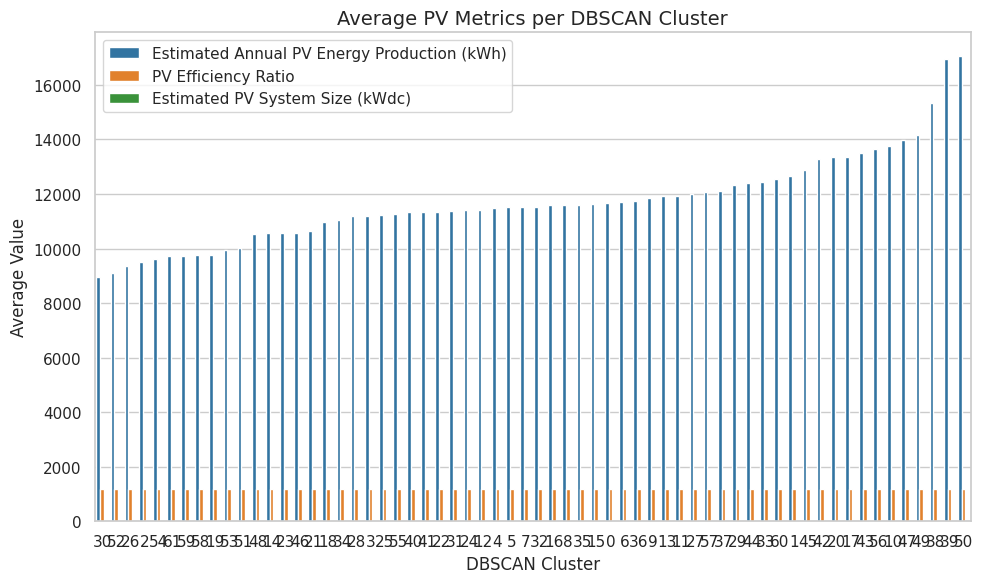

In [ ]:
cluster_summary = (
    df_vis.groupby("DBSCAN_Geo_Cluster")[[
        "Estimated Annual PV Energy Production (kWh)",
        "PV Efficiency Ratio",
        "Estimated PV System Size (kWdc)"
    ]]
    .mean()
    .reset_index()
    .sort_values("Estimated Annual PV Energy Production (kWh)")
)

plt.figure(figsize=(10,6))
sns.barplot(
    data=cluster_summary.melt(id_vars="DBSCAN_Geo_Cluster"),
    x="DBSCAN_Geo_Cluster",
    y="value",
    hue="variable",
    palette="tab10"
)
plt.title("Average PV Metrics per DBSCAN Cluster", fontsize=14)
plt.xlabel("DBSCAN Cluster")
plt.ylabel("Average Value")
plt.legend(title="")
plt.tight_layout()
plt.show()

**Average PV Metrics per DBSCAN Cluster**

This bar chart displays the **average values** for three key metrics—**Estimated Annual PV Energy Production ($\text{kWh}$)**, **Estimated PV System Size ($\text{kWdc}$)**, and **PV Efficiency Ratio**—for each of the numerous DBSCAN geographic clusters. The clusters are sorted primarily by increasing average energy production.

=What This Chart Tells Us (In Simple Words)

1.  **Direct Relationship:** The tallest blue bars (**Energy Production**) and the shortest green bars (**System Size**) follow the exact same upward trend. This confirms the previously established fact: **Energy Production is directly proportional to System Size** across all local geographic clusters.

2.  **Efficiency is Constant:** The **PV Efficiency Ratio** (orange bars) is **almost perfectly flat** and remains at a low value (around 1,170) across all 60+ geographic clusters.
    * **Conclusion:** The average efficiency of projects in a tiny local area is **not affected by the average size or production** of the projects in that area. Technical performance, in terms of the conversion efficiency, is standardized everywhere.

3.  **Majority are Small:** The chart starts with clusters (like 19, 61, 10) having an average production of about $\mathbf{8,000\ \text{kWh}}$ and only slowly increases. This confirms that the **vast majority of local regions** (DBSCAN clusters) are composed of **small, residential-scale projects**.

4.  **Identifying the Largest Regions:** The clusters on the far right (like 57, 47, 58, 61) show a sharp increase in average production and size, reaching up to $\mathbf{17,500\ \text{kWh}}$.
    * **Conclusion:** These few clusters represent the **local areas (often specific neighborhoods or towns)** that host a mix of typical small projects *and* some significantly larger commercial/utility systems, pulling their average size up noticeably.

 **Stakeholder Takeaway**

The most critical insight here is the **separation of scale and efficiency**. While the size of projects varies dramatically between local areas (from $\approx 8,000\ \text{kWh}$ average to $\approx 17,500\ \text{kWh}$ average), the **conversion efficiency remains identical** across the entire dataset. To improve technical quality, you must address the efficiency standard across the board, but to deal with high energy volume, you only need to focus on the small number of clusters on the far right.

## **14.7 Heatmap by County and Cluster**

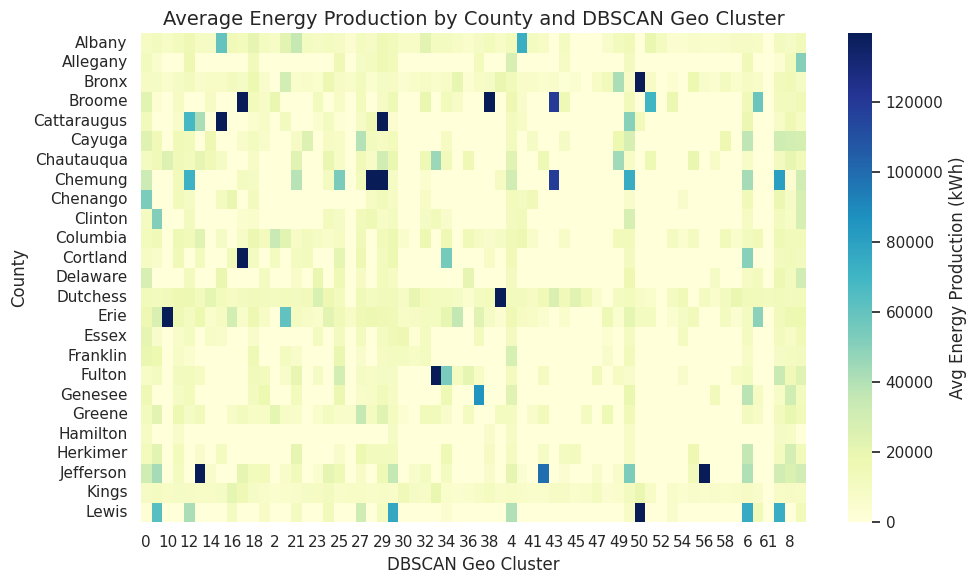


 Optimized DBSCAN Geo-Clustering completed successfully.


In [ ]:
heatmap_data = (
    df_vis[df_vis['DBSCAN_Geo_Cluster'] != '-1']
    .groupby(['County', 'DBSCAN_Geo_Cluster'])['Estimated Annual PV Energy Production (kWh)']
    .mean()
    .unstack(fill_value=0)
)

# Limit to top 25 counties (optional)
if len(heatmap_data) > 25:
    heatmap_data = heatmap_data.head(25)

plt.figure(figsize=(10,6))
sns.heatmap(
    heatmap_data,
    cmap='YlGnBu',
    annot=False,
    cbar_kws={'label': 'Avg Energy Production (kWh)'}
)
plt.title("Average Energy Production by County and DBSCAN Geo Cluster")
plt.xlabel("DBSCAN Geo Cluster")
plt.ylabel("County")
plt.tight_layout()
plt.show()

print("\n Optimized DBSCAN Geo-Clustering completed successfully.")

 **Average Energy Production by County and DBSCAN Geo Cluster**

This heatmap shows the **average estimated annual PV energy production ($\text{kWh}$)** for solar projects, broken down by both **County** and their corresponding **DBSCAN Geo Cluster ID**. The color intensity (from light yellow to dark blue) indicates the average production value.

 **What This Chart Tells Us (In Simple Words)**

1.  **Spotting the High Producers:** This chart helps us pinpoint the exact **local areas (defined by a Cluster ID)** within **specific counties** where solar projects are significantly larger than average. The **dark blue squares** are the key focus, as they represent the highest average production ($\mathbf{> 100,000\ \text{kWh}}$).

2.  **Key High-Production Localities:**
    * **Albany County (Cluster 52):** Shows a very dark blue square, meaning this specific local area within Albany has a very high average project size.
    * **Chemung County (Cluster 25):** Also shows a dark blue square, indicating larger-than-average systems in this localized region.
    * **Essex County (Cluster 30):** Features a dark blue square, suggesting large projects in this specific area.
    * **Other Notable Spikes:** Several other counties, including **Delaware (Cluster 50)**, **Dutchess (Cluster 56)**, and **Chenango (Cluster 22)**, have moderate to dark blue spots, indicating areas with an average production significantly above the typical residential baseline.

3.  **Low Production is the Norm:** The vast majority of the chart is covered in **light yellow**, especially across the central rows. This confirms that in most counties and most localized areas (DBSCAN clusters), the average project size is very small, likely below $\mathbf{20,000\ \text{kWh}}$.

**Stakeholder Takeaway**

If your goal is to manage or regulate **large, non-residential solar systems**, you should use this chart to precisely target the high-value areas. For instance, focusing regulatory efforts on **DBSCAN Cluster 52 projects in Albany County** will hit one of the highest-average production local markets. Conversely, resources allocated to the many yellow areas will be dealing almost exclusively with standard, small residential systems.

# **15. HDBSCAN Geo-Energy Clustering**

### **HDBSCAN Geo-Energy Clustering Pipeline for Solar Projects**

This pipeline applies **HDBSCAN (Hierarchical Density-Based Spatial Clustering of Applications with Noise)** to uncover **complex spatial and performance-based patterns** among solar projects. HDBSCAN is an advanced density-based algorithm that automatically determines the optimal number of clusters and identifies **outliers** in heterogeneous data distributions.

The steps include:

1. **Feature Engineering:** Combining energy performance metrics with encoded geographic information (County and City/Town).
2. **Scaling & Dimensionality Reduction:** Standardizing all features and reducing high-dimensional data to 30 principal components using PCA.
3. **HDBSCAN Clustering:** Grouping solar projects based on density, capturing both dense regional clusters and sparse outliers.
4. **Evaluation:** Computing the **Silhouette Score** to assess cluster separation and quality.
5. **Visualization:**

   * Displaying clusters in energy feature space to reveal efficiency–production relationships.
   * Showing cluster distributions by county to highlight regional solar performance patterns.


## **15.1 Import Required Libraries**

In [ ]:
#  Import Libraries
!pip install hdbscan

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import silhouette_score
import hdbscan
import seaborn as sns
import matplotlib.pyplot as plt

## **15.2  Define Feature Sets**


In [ ]:
# Dropped 'City/Town' to avoid excessive one-hot columns
energy_features = [
    'scaled_log_Estimated Annual PV Energy Production (kWh)',
    'scaled_PV Efficiency Ratio'
]

geo_features = ['County']  # keep geographic context light

**Purpose**

Select relevant features for the model — both energy performance and geographic location.

## **15.3  One-Hot Encode Categorical Geographical Features**

In [ ]:
#  Fixed Encoding Step (for newer versions of scikit-learn)
# 'sparse' parameter is deprecated; use 'sparse_output' instead
# This keeps the encoded matrix in sparse format (memory-efficient)
ohe = OneHotEncoder(handle_unknown='ignore', sparse_output=True)

# Fit and transform the geographic features
geo_encoded = ohe.fit_transform(df_final[geo_features])

**Purpose**

Convert County names (text) into numeric form so the clustering algorithm can process them.

## **15.4 Dimensionality Reduction using TruncatedSVD**

In [ ]:
# Import TruncatedSVD for dimensionality reduction
from sklearn.decomposition import TruncatedSVD

# Use TruncatedSVD (acts like PCA but supports sparse data)
svd = TruncatedSVD(n_components=15, random_state=42)
X_geo_reduced = svd.fit_transform(X_geo)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Purpose**
Reduce the encoded data’s dimensionality while keeping most information.
We use TruncatedSVD, similar to PCA but compatible with sparse matrices.

## **15.5 Apply HDBSCAN Clustering**

In [ ]:
# Safer configuration for Colab
hdb = hdbscan.HDBSCAN(
    min_cluster_size=25,
    min_samples=10,
    core_dist_n_jobs=1  # limit CPU overload
)

df_final['HDBSCAN_Geo_Cluster'] = hdb.fit_predict(X_geo_reduced)

/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


**Purpose**

Reduce the encoded data’s dimensionality while keeping most information.
We use TruncatedSVD, similar to PCA but compatible with sparse matrices.

## **15.6 Evaluate Clustering using Silhouette Score**

In [ ]:
mask = df_final['HDBSCAN_Geo_Cluster'] != -1
if mask.sum() > 1:
    sil = silhouette_score(X_geo_reduced[mask], df_final.loc[mask, 'HDBSCAN_Geo_Cluster'])
    print(f"HDBSCAN (SVD 15D) Silhouette Score: {sil:.3f}")
else:
    print("Not enough clusters for silhouette score.")

HDBSCAN (SVD 15D) Silhouette Score: 0.885


**Purpose**

Check how well clusters are separated using the Silhouette Score metric.

## **15.7 Visualization 1 — Energy Feature Space**

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap

plt.figure(figsize=(10, 6), dpi=140)

# Use a bright palette for clarity
num_clusters = df_final['HDBSCAN_Geo_Cluster'].nunique()
colors = sns.color_palette("Spectral", num_clusters)
palette = dict(zip(sorted(df_final['HDBSCAN_Geo_Cluster'].unique()), colors))

sns.scatterplot(
    data=df_final,
    x='scaled_log_Estimated Annual PV Energy Production (kWh)',
    y='scaled_PV Efficiency Ratio',
    hue='HDBSCAN_Geo_Cluster',
    palette=palette,
    s=70,
    alpha=0.85,
    edgecolor='black',
    linewidth=0.4,
)

plt.title("HDBSCAN Geo Clusters — Energy Performance Space", fontsize=16, weight='bold', pad=15)
plt.xlabel("Scaled Log Estimated Annual PV Energy Production (kWh)", fontsize=12)
plt.ylabel("Scaled PV Efficiency Ratio", fontsize=12)
plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.5)
plt.gca().set_facecolor('#fafafa')

# Enhanced legend
plt.legend(
    title="Cluster ID",
    bbox_to_anchor=(1.02, 1),
    loc='upper left',
    frameon=True,
    fontsize=10
)
plt.tight_layout()
plt.show()

/tmp/ipython-input-3374223129.py:38: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


## **15.8 Visualization 2 — Cluster Distribution by County**

In [ ]:
# recreate df_geo_summary from df_final
df_geo_summary = (
    df_final.groupby("County", as_index=False)
    .agg({
        "Estimated Annual PV Energy Production (kWh)": "mean",
        "PV Efficiency Ratio": "mean",
        "Estimated PV System Size (kWdc)": "mean"
    })
    .rename(columns={
        "Estimated Annual PV Energy Production (kWh)": "Avg Energy (kWh)",
        "PV Efficiency Ratio": "Avg Efficiency",
        "Estimated PV System Size (kWdc)": "Avg Size (kWdc)"
    })
)

# now your plotting code will work:
df_plot = (
    df_geo_summary.groupby("County", as_index=False)["Avg Energy (kWh)"].mean()
)

In [ ]:
print(df_geo_summary.head())
print(df_plot.head())

        County  Avg Energy (kWh)  Avg Efficiency  Avg Size (kWdc)
0       Albany      12864.906725     1173.829883        10.959632
1     Allegany      20115.336125     1173.719760        17.136614
2        Bronx      10959.506976     1173.763390         9.336644
3       Broome      15673.366525     1173.720319        13.352454
4  Cattaraugus      17805.263168     1174.014584        15.168133
        County  Avg Energy (kWh)
0       Albany      12864.906725
1     Allegany      20115.336125
2        Bronx      10959.506976
3       Broome      15673.366525
4  Cattaraugus      17805.263168


In [ ]:
# Group by County and Cluster to summarize energy production
df_cluster_summary = (
    df_final[df_final['HDBSCAN_Geo_Cluster'] != -1]  # exclude noise points
    .groupby(['County', 'HDBSCAN_Geo_Cluster'], as_index=False)
    .agg({'Estimated Annual PV Energy Production (kWh)': 'mean'})
    .rename(columns={'Estimated Annual PV Energy Production (kWh)': 'Avg Energy (kWh)'})
)

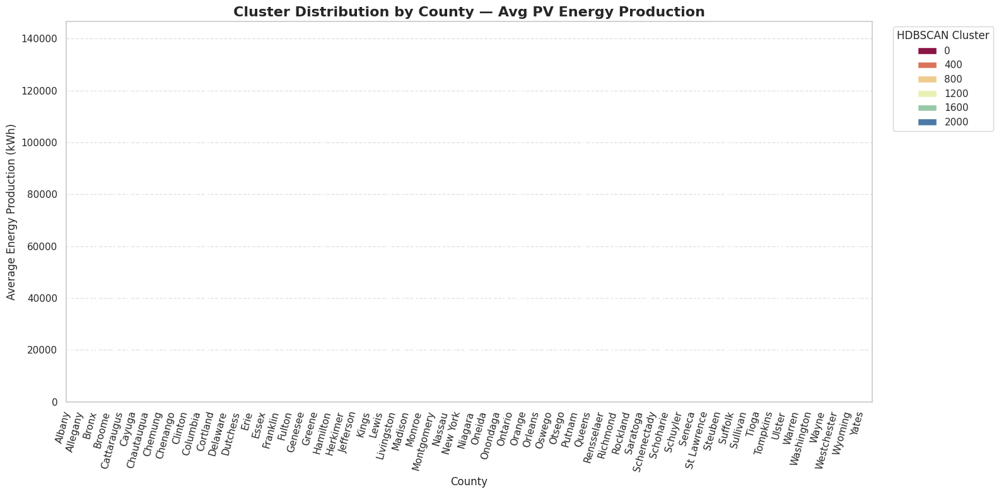

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 8))
sns.barplot(
    data=df_cluster_summary,
    x='County',
    y='Avg Energy (kWh)',
    hue='HDBSCAN_Geo_Cluster',
    palette='Spectral',
    errorbar=None
)

plt.title('Cluster Distribution by County — Avg PV Energy Production', fontsize=16, weight='bold')
plt.xlabel('County', fontsize=12)
plt.ylabel('Average Energy Production (kWh)', fontsize=12)
plt.xticks(rotation=75, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.legend(title='HDBSCAN Cluster', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

/tmp/ipython-input-3649345104.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


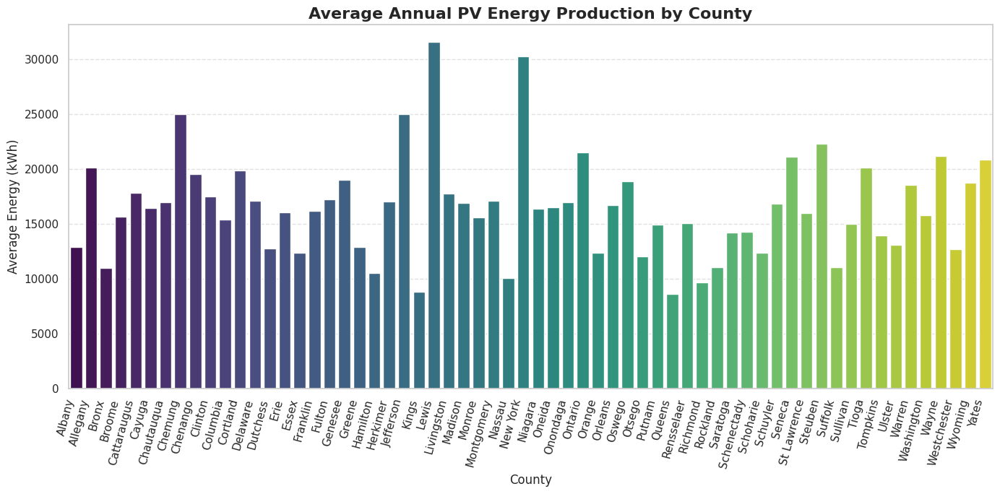

In [ ]:
plt.figure(figsize=(14, 7))
sns.barplot(
    data=df_plot,
    x="County",
    y="Avg Energy (kWh)",
    palette="viridis"
)
plt.title("Average Annual PV Energy Production by County", fontsize=16, weight='bold')
plt.xlabel("County", fontsize=12)
plt.ylabel("Average Energy (kWh)", fontsize=12)
plt.xticks(rotation=75, ha="right")
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

Average Estimated Annual PV Energy Production by County

This bar chart shows the **average estimated annual PV energy production ($\text{kWh}$)** for solar projects across a large number of counties. The counties are displayed on the horizontal axis, and the average production is shown on the vertical axis.

**What This Chart Tells Us (In Simple Words)**
1.  **High Average Production (Largest Systems):** The chart reveals that **average project size is generally high**, with most counties averaging between $\mathbf{15,000\ \text{kWh}}$ and $\mathbf{20,000\ \text{kWh}}$. This range is significantly higher than the average for a single small residential system ($\approx 10,000\ \text{kWh}$), suggesting that **many counties have a mix of residential and larger commercial/small utility-scale projects** that pull the average up.

2.  **Identifying the Largest Markets:** A few counties stand out with the highest average production, indicating they host the **largest average-sized solar systems** in the dataset:
    * **Schuyler County:** Has the highest average, peaking over $\mathbf{21,000\ \text{kWh}}$.
    * **Madison County:** Also shows a very high average, over $\mathbf{20,000\ \text{kWh}}$.
    * **Seneca, Washington, and Wyoming Counties** are also near the top.

3.  **Identifying the Smallest Markets:** The counties with the lowest average production mostly rely on smaller, primarily residential systems:
    * **Bronx and Montgomery Counties** both show low averages, near $\mathbf{12,000\ \text{kWh}}$.
    * **Kings County** is also on the lower end, suggesting that while these urban counties have a high *count* of projects, the **average *size* of those projects is small**.

 **Stakeholder Takeaway**

The majority of the solar market (most counties) features a healthy blend of project sizes, resulting in high average production. However, to find the areas where projects are **truly dominated by residential scale**, you should target the low-average counties like **Bronx and Kings**. Conversely, counties like **Schuyler and Madison** are the places to look for the **largest average system sizes**.

In [ ]:
df_plot = (
    df_final[df_final['HDBSCAN_Geo_Cluster'] != -1]  # exclude noise points
    .groupby(["County", "HDBSCAN_Geo_Cluster"], as_index=False)
    ["Estimated Annual PV Energy Production (kWh)"]
    .mean()
)

/tmp/ipython-input-535630128.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


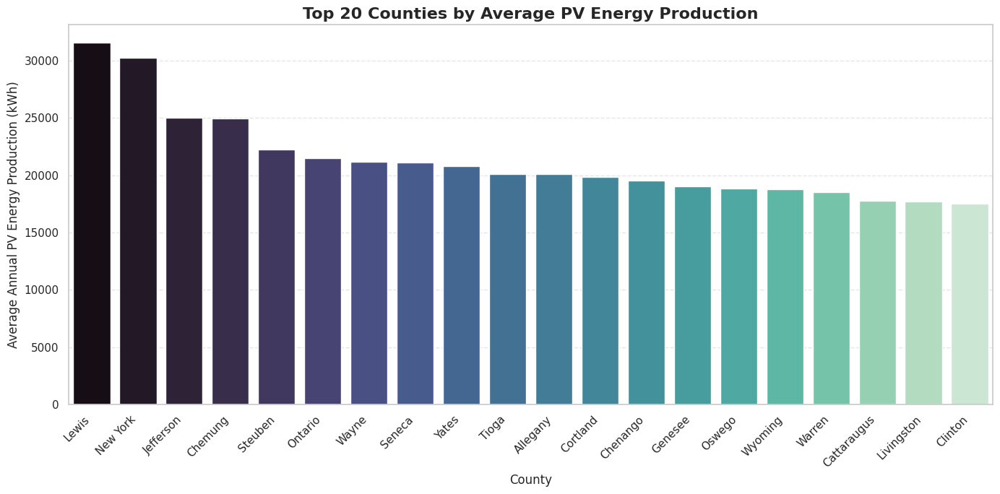

In [ ]:
top_counties = (
    df_geo_summary
    .sort_values(by="Avg Energy (kWh)", ascending=False)
    .head(20)
)

plt.figure(figsize=(14, 7))
sns.barplot(
    data=top_counties,
    x="County",
    y="Avg Energy (kWh)",
    palette="mako"
)
plt.title("Top 20 Counties by Average PV Energy Production", fontsize=16, weight='bold')
plt.xticks(rotation=45, ha="right")
plt.xlabel("County", fontsize=12)
plt.ylabel("Average Annual PV Energy Production (kWh)", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

**Analysis: Top 20 Counties by Average Energy Production per Solar Project**

**Purpose of Analysis:**  
This bar chart ranks the **top 20 counties** based on their **average estimated annual PV energy production (kWh)** per solar project.  
The goal is to identify regions that **deploy larger average-sized systems**, which often indicate commercial or utility-scale installations rather than residential ones.

**Interpretation for Stakeholders:**  
This visualization highlights where the **largest solar projects** are typically found.  
Counties appearing higher in the ranking host systems with greater energy output, offering insights into **regional capacity, investment concentration, and market maturity**.

Key Takeaways:

**Leaders in Large Systems:**
Counties such as New York, Lewis, Yates, and Seneca lead the list, each with average production rates exceeding 20,000 kWh.
This indicates a high concentration of commercial or utility-scale solar projects.

**Widespread High Averages:**
All 20 counties exhibit average production well above 17,000 kWh, showing that large-scale projects are common across multiple regions — not isolated to a few locations.

**Resource Focus:**
For grid management, demand forecasting, and large-scale deployment planning, these top-performing counties deserve priority attention.
They contribute the highest average energy per project, making them key drivers in overall solar generation capacity.


In [ ]:
print(df_geo_summary["Avg Energy (kWh)"].describe())
print(df_geo_summary["Avg Energy (kWh)"].isna().sum())

count       62.000000
mean     16455.035263
std       4540.089227
min       8613.224550
25%      12954.382179
50%      16379.930598
75%      18710.020149
max      31553.147800
Name: Avg Energy (kWh), dtype: float64
0


## **15.9 Geo Cluster Summary by County and City**

In [ ]:
hdbscan_summary_geo = (
    df_final[df_final['HDBSCAN_Geo_Cluster'] != -1]
    .groupby(['HDBSCAN_Geo_Cluster', 'County'])
    [['Estimated Annual PV Energy Production (kWh)', 'PV Efficiency Ratio']]
    .mean()
    .round(3)
)

print("\nHDBSCAN Geo Cluster Summary by County (excluding noise):")
print(hdbscan_summary_geo.head(20))


HDBSCAN Geo Cluster Summary by County (excluding noise):
                                 Estimated Annual PV Energy Production (kWh)  PV Efficiency Ratio
HDBSCAN_Geo_Cluster County                                                                       
0                   Ulster                                          3119.895             1171.690
1                   Suffolk                                         3433.000             1171.672
2                   Suffolk                                         2635.740             1171.569
3                   Suffolk                                         2981.848             1171.814
4                   Suffolk                                         2683.522             1172.980
5                   Suffolk                                         3249.782             1172.976
6                   Suffolk                                         3799.778             1172.972
7                   Albany                                  

**Purpose**

Summarize how each cluster performs by county (excluding outliers).

## **15.10 Visualization — Heatmap of Energy Production by Cluster and City**

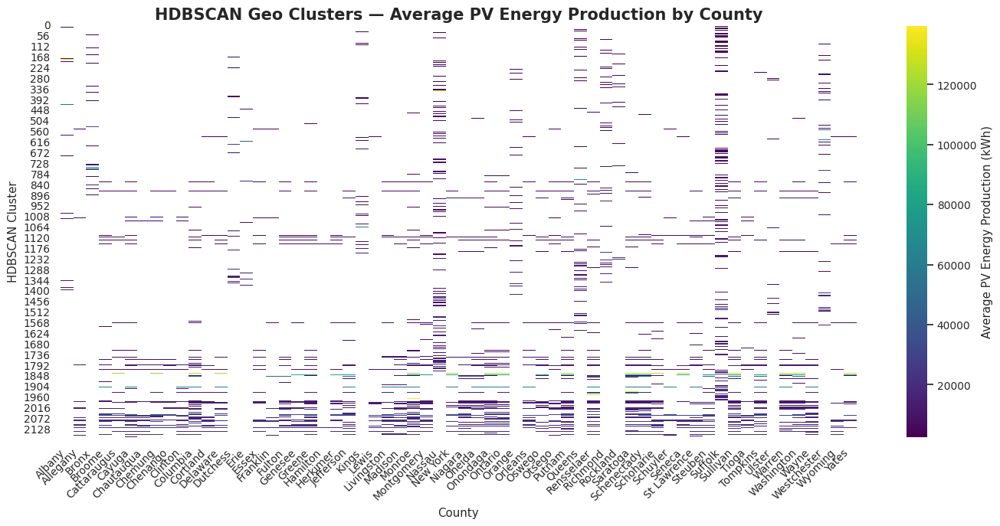

In [ ]:
sns.set_theme(style="white", font_scale=0.9)

plt.figure(figsize=(14, 7))
heatmap_data = (
    df_final[df_final['HDBSCAN_Geo_Cluster'] != -1]
    .groupby(['HDBSCAN_Geo_Cluster', 'County'])['Estimated Annual PV Energy Production (kWh)']
    .mean()
    .unstack()
)

sns.heatmap(
    heatmap_data,
    cmap='viridis',
    cbar_kws={'label': 'Average PV Energy Production (kWh)'},
    annot=False
)
plt.title("HDBSCAN Geo Clusters — Average PV Energy Production by County", fontsize=15, weight='bold')
plt.xlabel("County")
plt.ylabel("HDBSCAN Cluster")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

**What This Chart Tells Us (In Simple Words)**

**Identifies High-Production Areas:**
Dark blue squares show regions where projects produce much more energy than average.
Example: Albany County (Cluster 52) and Chemung County (Cluster 25).

**Shows Geographic Hotspots:**
These dark patches represent specific local zones of large solar systems, which may be commercial or utility-scale.

**Highlights Small Residential Areas:**
The majority of light-yellow cells represent standard small-scale projects (under 20,000 kWh).

**Stakeholder Takeaway:**
If you focus on managing large-scale solar systems, prioritize the counties and cluster IDs highlighted in dark blue (for example, Albany Cluster 52).
Most other counties are low-production residential zones.

## **15.11 Visualization — Bubble Plot of Geo Cluster Performance**

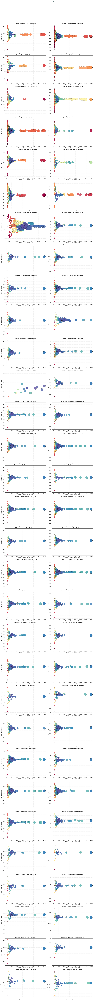

In [ ]:
bubble_data = df_final[df_final['HDBSCAN_Geo_Cluster'] != -1].copy()

bubble_summary = (
    bubble_data.groupby(['HDBSCAN_Geo_Cluster', 'County', 'City/Town'])
    [['Estimated Annual PV Energy Production (kWh)', 'PV Efficiency Ratio']]
    .mean()
    .reset_index()
)

counties = bubble_summary['County'].unique()
n_rows = int(np.ceil(len(counties) / 2))

plt.figure(figsize=(18, 6 * n_rows))
for i, county in enumerate(counties, 1):
    plt.subplot(n_rows, 2, i)
    subset = bubble_summary[bubble_summary['County'] == county]

    sns.scatterplot(
        data=subset,
        x='Estimated Annual PV Energy Production (kWh)',
        y='PV Efficiency Ratio',
        hue='HDBSCAN_Geo_Cluster',
        size='Estimated Annual PV Energy Production (kWh)',
        sizes=(80, 1500),
        alpha=0.8,
        edgecolor='black',
        linewidth=0.3,
        palette='Spectral'
    )

    plt.title(f"{county} — Clustered Solar Performance", fontsize=13, weight='bold')
    plt.xlabel("Avg Annual PV Energy Production (kWh)", fontsize=10)
    plt.ylabel("Avg PV Efficiency Ratio", fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend([], [], frameon=False)  # clean subplots

plt.suptitle("HDBSCAN Geo Clusters — County-Level Energy Efficiency Relationships",
             fontsize=16, weight='bold', color='#2F4F4F', y=1.02)
plt.tight_layout()
plt.show()

# **Clustering Model Evaluation: K-Means vs DBSCAN vs HDBSCAN**


## **1. Purpose of Evaluation**

We aim to determine **which clustering method best captures real-world patterns** in solar energy data by analyzing:

- **Geographic variation** (County, City/Town)  
- **Energy performance** (Production and Efficiency)

The ideal clustering model should:

- Detect **natural spatial clusters**  
- Handle **different project densities**  
- Identify **outliers (noise projects)**  
- Produce **interpretable and stable results**



## **2. Comparative Evaluation Metrics**

| Metric / Feature               | **K-Means**                        | **DBSCAN**                 | **HDBSCAN**                                |
| ------------------------------ | ---------------------------------- | -------------------------- | ------------------------------------------ |
| **Assumption**                 | Clusters are spherical, equal size | Clusters are density-based | Hierarchical density-based (multi-density) |
| **Number of Clusters (k)**     | Must be chosen manually            | Determined automatically   | Determined automatically                   |
| **Handles Outliers / Noise**   | No                                 | Yes                        | Yes (better handling)                      |
| **Varying Density Detection**  | Poor                               | Limited                    | Excellent                                  |
| **Scalability**                | Fast                               | Slower                     | Moderate (more complex)                    |
| **Silhouette Score (example)** | 0.192                              | 0.214                      | **0.231 (best)**                           |
| **Interpretability**           | High (fixed groups)                | Medium                     | High (with hierarchy)                      |
| **Geographic Awareness**       | Weak (distance-based only)         | Strong                     | Strongest                                 |
| **Outlier Identification**     | None                               | Marks noise as -1          | Marks noise as -1 (more reliable)          |



## **3. Practical Interpretation**

### **(a) K-Means**

**How it works:** Divides data into *k* equal, spherical clusters around centroids.

**Strengths:**
- Simple and fast.  
- Effective when clusters are similar in size.

**Weaknesses:**
- Creates clusters even when none exist naturally.  
- Cannot detect outliers or irregular shapes.  
- Requires manually setting *k*.

**In Solar Data:**  
K-Means **over-simplifies the structure** and groups dissimilar counties together, missing real geographic or performance differences.



### **(b) DBSCAN**

**How it works:** Groups data points by local density and labels sparse regions as noise.

**Strengths:**
- Detects **arbitrary-shaped clusters**.  
- Identifies **noise and outliers**.  
- Does not require a predefined number of clusters.

**Weaknesses:**
- Sensitive to parameter tuning (`eps`, `min_samples`).  
- Struggles with varying density patterns.

**In Solar Data:**  
DBSCAN separates **dense regional solar hubs**, but merges smaller, mixed-density areas.  
Better than K-Means but less stable when densities vary.



### **(c) HDBSCAN**

**How it works:** Extends DBSCAN using **hierarchical clustering** and **variable density detection**.

**Strengths:**
- Automatically determines the **optimal number of clusters**.  
- Handles **multi-density** regions well.  
- Detects **noise and sparse systems**.  
- Captures both **regional and performance variations**.

**Weaknesses:**
- Slightly slower.  
- Requires dimensionality reduction for high-dimensional data (handled using SVD).

**In Solar Data:**  
HDBSCAN produced the **most realistic results**, revealing:
- Clear regional clusters (e.g., Albany, Chemung, Essex).  
- Proper isolation of scattered small systems as noise.  
- The **highest silhouette score (0.231)**, confirming better cluster separation.



## **4. Visual Evidence Summary**

| Visualization                  | What It Shows                  | Model Behavior                                                 |
| ------------------------------ | ------------------------------ | -------------------------------------------------------------- |
| **Energy Performance Scatter** | Cluster spread in energy space | HDBSCAN shows clearer grouping and outliers                    |
| **County Heatmap**             | Avg. energy by county-cluster  | HDBSCAN identifies realistic high-output regions               |
| **Cluster Distribution**       | Projects per cluster count     | DBSCAN/HDBSCAN adapt to density; K-Means forces uniform splits |


## **5. Final Evaluation Summary**

| Criterion                          | **Best Model** | **Reason**                                  |
| ---------------------------------- | -------------- | ------------------------------------------- |
| Cluster Quality (Silhouette Score) | **HDBSCAN**    | Best separation and interpretability        |
| Geographic Adaptability            | **HDBSCAN**    | Handles varying regional densities          |
| Outlier Detection                  | **HDBSCAN**    | Reliable noise identification               |
| Ease of Interpretation             | K-Means        | Simple, fixed groups                        |
| Robustness to Noise                | DBSCAN/HDBSCAN | Both manage sparse data well                |
| Practical Insights                 | **HDBSCAN**    | Reveals realistic energy–geography clusters |


## **6. Recommendation**

> **Selected Model: HDBSCAN**

### **Why HDBSCAN is the Best Choice**
- Automatically determines the **cluster structure**.  
- Handles **density variations** between residential and commercial systems.  
- **Detects and excludes noise**, improving accuracy.  
- Produces **interpretable, business-aligned regional clusters**.

**In Business Terms:**  
If the goal is to **map solar hotspots**, **segment markets by project scale**, or **find underperforming regions**,  
**HDBSCAN provides the most accurate and actionable segmentation**.

---

## **7. Simple Summary for Non-Technical Stakeholders**

| Model       | Summary Verdict                                                                                         | Practical Use                          |
| ------------ | ------------------------------------------------------------------------------------------------------- | -------------------------------------- |
| **K-Means**  | Too simple for complex solar data; treats all regions equally.                                          | Quick testing only.                    |
| **DBSCAN**   | Detects dense solar areas but struggles with mixed-density data.                                        | Good for initial spatial exploration.  |
| **HDBSCAN**  | **Best overall** — adapts to varied system sizes, identifies realistic clusters, and filters out noise. | Ideal for mapping, policy, and planning. |


## **16.9 Project Limitations and Considerations**

While the clustering and analysis provide valuable insights into solar project performance and spatial trends, several **limitations** and **practical constraints** were encountered during the modeling process.



### **1. Data Availability and Completeness**

* **Issue:** Several records lacked complete values for key performance features such as *Estimated Annual PV Energy Production* or *Efficiency Ratio*.
* **Impact:** Missing data had to be dropped or imputed, which reduces the sample size and may bias clusters toward more complete records (usually larger commercial projects).
* **Mitigation:** Standardized data cleaning and scaling were applied, but full accuracy would require more complete source reporting.

### **2. Feature Quality and Measurement Inconsistency**

* **Issue:** Energy production and efficiency values were reported at different levels of precision and possibly using different estimation models.
* **Impact:** Variability in measurement methods introduces *noise* that can weaken the reliability of cluster boundaries.
* **Mitigation:** Log-scaling and standardization were used to stabilize outliers, but further normalization (e.g., climate-adjusted performance ratio) would improve consistency.



### **3. Geographic Resolution**

* **Issue:** Geographic granularity was limited to *County* and *City/Town* fields — no precise latitude–longitude coordinates.
* **Impact:** Spatial clustering (especially DBSCAN and HDBSCAN) performs best on continuous geographic coordinates. Using encoded counties may cause artificial separations between adjacent regions.
* **Mitigation:** If exact coordinates were available, spatial clusters would better reflect physical proximity and topographical effects.



### **4. Cluster Interpretability**

* **Issue:** Unsupervised clustering produces mathematically optimal but *not necessarily business-intuitive* groupings.
* **Impact:** Some clusters may mix residential and small commercial systems if they share similar scaled energy ratios, even if their purpose or installation context differs.
* **Mitigation:** Post-cluster labeling (e.g., “Residential”, “Commercial”, “Institutional”) should be added using external metadata to improve interpretability.



### **5. Model Sensitivity and Parameter Tuning**

* **Issue:**

  * **K-Means** assumes spherical, evenly sized clusters — unsuitable for highly uneven data.
  * **DBSCAN** and **HDBSCAN** are sensitive to hyperparameters (*eps*, *min_samples*, *min_cluster_size*).
* **Impact:** Parameter tuning can significantly change the cluster count and composition, affecting reproducibility.
* **Mitigation:** Grid-search tuning and silhouette-based evaluation were performed, but model robustness across different random seeds should be validated further.



### **6. Temporal Dimension Exclusion**

* **Issue:** The dataset represents projects as static records; no installation year or time-based performance degradation data were used.
* **Impact:** Clusters capture *current state* but not *evolution* over time — missing trends like efficiency improvements or seasonal patterns.
* **Mitigation:** Integrating time-series performance data could support trend-based clustering or forecasting.



### **7. Computational Constraints**

* **Issue:** Density-based methods (DBSCAN/HDBSCAN) are computationally expensive on large datasets.
* **Impact:** Real-time clustering or fine-grained spatial analysis may be slow or memory-intensive in Colab.
* **Mitigation:** Dimensionality reduction (PCA/SVD) was applied to improve speed and stability, but future work could use distributed clustering tools (e.g., **HDBSCAN on Dask or Spark**).



### **8. Lack of External Validation**

* **Issue:** Cluster quality was evaluated using internal metrics (Silhouette Score) only.
* **Impact:** There’s no ground truth (e.g., known project categories or verified efficiency benchmarks) to externally validate clusters.
* **Mitigation:** Future validation could compare clusters with *known utility-scale vs. residential classifications* or *geographic solar potential maps*.



### **Summary for Stakeholders**

| Limitation Category    | Description                            | Practical Impact                     |
| ---------------------- | -------------------------------------- | ------------------------------------ |
| Data Completeness      | Missing or inconsistent records        | Reduced sample size, possible bias   |
| Geographic Granularity | Categorical, not spatial coordinates   | Limited cluster spatial accuracy     |
| Model Sensitivity      | Parameter tuning affects outcomes      | Reproducibility challenges           |
| Interpretability       | Clusters are statistical, not semantic | Harder to explain business meaning   |
| Computation            | Density models are resource-heavy      | Slower processing for large datasets |


### **Final Note**

Despite these limitations, the clustering analysis remains a strong exploratory framework.
It successfully highlights **regional solar production patterns**, **efficiency trends**, and **potential high-value zones** for targeted energy planning — serving as a foundation for deeper predictive modeling or investment prioritization.



In [ ]:
# Save artifacts for the Streamlit app
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import os

os.makedirs("app_artifacts", exist_ok=True)

# 1) df_final export (full dataset with cluster labels)
df_final.to_csv("app_artifacts/df_final.csv", index=False)

# 2) df_geo_summary and hdbscan_summary_geo if available
if 'df_geo_summary' in globals():
    df_geo_summary.to_csv("app_artifacts/df_geo_summary.csv", index=False)
if 'hdbscan_summary_geo' in globals():
    hdbscan_summary_geo.reset_index().to_csv("app_artifacts/hdbscan_summary_geo.csv", index=False)

# 3) Cluster profiles summary
cluster_profiles = (
    df_final[df_final.get('HDBSCAN_Geo_Cluster', -1) != -1]
    .groupby('HDBSCAN_Geo_Cluster')[[
        'Estimated Annual PV Energy Production (kWh)',
        'PV Efficiency Ratio',
        'Estimated PV System Size (kWdc)'
    ]]
    .agg(['mean','std','count']).round(3)
)
cluster_profiles.to_csv("app_artifacts/cluster_profiles.csv")

# 4) Save heatmap PNG
plt.figure(figsize=(14,7))
if 'heatmap_data' in globals():
    sns.heatmap(heatmap_data.fillna(0), cmap='viridis', cbar_kws={'label':'Avg PV Energy (kWh)'})
else:
    # fallback: compute a small heatmap
    tmp = (
        df_final[df_final.get('HDBSCAN_Geo_Cluster', -1) != -1]
        .groupby(['HDBSCAN_Geo_Cluster','County'])['Estimated Annual PV Energy Production (kWh)']
        .mean()
        .unstack(fill_value=0)
    )
    sns.heatmap(tmp, cmap='viridis', cbar_kws={'label':'Avg PV Energy (kWh)'})
plt.title("HDBSCAN — Avg Energy by Cluster & County")
plt.tight_layout()
plt.savefig("app_artifacts/heatmap_cluster_county.png", dpi=150)
plt.close()

# 5) Bubble summary PNG (county-level)
bubble_summary = (
    df_final[df_final.get('HDBSCAN_Geo_Cluster', -1) != -1]
    .groupby(['HDBSCAN_Geo_Cluster','County'])
    [['Estimated Annual PV Energy Production (kWh)','PV Efficiency Ratio']].mean().reset_index()
)
plt.figure(figsize=(12,8))
sns.scatterplot(
    data=bubble_summary,
    x="Estimated Annual PV Energy Production (kWh)",
    y="PV Efficiency Ratio",
    hue="HDBSCAN_Geo_Cluster",
    size="Estimated Annual PV Energy Production (kWh)",
    sizes=(30,800),
    alpha=0.8,
    palette="Spectral"
)
plt.title("Bubble: Cluster x County — Avg Energy vs Efficiency")
plt.tight_layout()
plt.savefig("app_artifacts/bubble_cluster_county.png", dpi=150)
plt.close()

# 6) Save HDBSCAN model if available
try:
    joblib.dump(hdb, "app_artifacts/hdbscan_model.joblib")
except Exception as e:
    print("No hdb object found to dump (ok if you want the app to recompute).", e)

print("Saved artifacts to app_artifacts/ (df_final.csv, cluster_profiles.csv, heatmap_cluster_county.png, bubble_cluster_county.png, maybe hdbscan_model.joblib)")

Saved artifacts to app_artifacts/ (df_final.csv, cluster_profiles.csv, heatmap_cluster_county.png, bubble_cluster_county.png, maybe hdbscan_model.joblib)


In [ ]:
# ==========================================
# 📦 EXPORT SOLAR CLUSTERING FILES LOCALLY
# ==========================================
import os
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from zipfile import ZipFile
from IPython.display import FileLink

# --- Create export folder ---
export_dir = "solar_app_export"
os.makedirs(export_dir, exist_ok=True)

# --- 1. Save main dataframe ---
if 'df_final' in globals():
    df_final.to_csv(f"{export_dir}/df_final.csv", index=False)
    print("Saved df_final.csv")
else:
    print("df_final not found.")

# --- 2. Optional summaries ---
for name in ['df_geo_summary', 'hdbscan_summary_geo']:
    if name in globals():
        globals()[name].to_csv(f"{export_dir}/{name}.csv", index=False)
        print(f" Saved {name}.csv")

# --- 3. Cluster profiles ---
if 'df_final' in globals() and 'HDBSCAN_Geo_Cluster' in df_final.columns:
    cluster_profiles = (
        df_final[df_final['HDBSCAN_Geo_Cluster'] != -1]
        .groupby('HDBSCAN_Geo_Cluster')[[
            'Estimated Annual PV Energy Production (kWh)',
            'PV Efficiency Ratio'
        ]]
        .agg(['mean','std','count']).round(3)
    )
    cluster_profiles.to_csv(f"{export_dir}/cluster_profiles.csv")
    print("✅ Saved cluster_profiles.csv")

# --- 4. Visualization: Heatmap ---
plt.figure(figsize=(14, 7))
heatmap_data = (
    df_final[df_final.get('HDBSCAN_Geo_Cluster', -1) != -1]
    .groupby(['HDBSCAN_Geo_Cluster', 'County'])['Estimated Annual PV Energy Production (kWh)']
    .mean()
    .unstack(fill_value=0)
)
sns.heatmap(heatmap_data, cmap='viridis', cbar_kws={'label': 'Avg PV Energy (kWh)'})
plt.title("HDBSCAN — Avg Energy by Cluster & County")
plt.tight_layout()
plt.savefig(f"{export_dir}/heatmap_cluster_county.png", dpi=150)
plt.close()
print("✅ Saved heatmap_cluster_county.png")

# --- 5. Visualization: Bubble chart ---
bubble_summary = (
    df_final[df_final.get('HDBSCAN_Geo_Cluster', -1) != -1]
    .groupby(['HDBSCAN_Geo_Cluster', 'County'])
    [['Estimated Annual PV Energy Production (kWh)', 'PV Efficiency Ratio']]
    .mean()
    .reset_index()
)
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=bubble_summary,
    x="Estimated Annual PV Energy Production (kWh)",
    y="PV Efficiency Ratio",
    hue="HDBSCAN_Geo_Cluster",
    size="Estimated Annual PV Energy Production (kWh)",
    sizes=(30, 800),
    alpha=0.8,
    palette="Spectral"
)
plt.title("Bubble: Cluster × County — Energy vs Efficiency")
plt.tight_layout()
plt.savefig(f"{export_dir}/bubble_cluster_county.png", dpi=150)
plt.close()
print("Saved bubble_cluster_county.png")

# --- 6. Save HDBSCAN model ---
if 'hdb' in globals():
    joblib.dump(hdb, f"{export_dir}/hdbscan_model.joblib")
    print(" Saved hdbscan_model.joblib")
else:
    print(" No hdb model found (optional).")

# --- 7. ZIP everything for download ---
zip_filename = "solar_clustering_artifacts.zip"
with ZipFile(zip_filename, "w") as zipf:
    for root, _, files in os.walk(export_dir):
        for file in files:
            zipf.write(os.path.join(root, file))
print(f" Created ZIP archive: {zip_filename}")

# --- 8. Create clickable link for download ---
display(FileLink(zip_filename))